<a href="https://colab.research.google.com/github/prasanthi-k/covid-19/blob/master/Districts_in_India.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Loads the source code in url

In [ ]:
import urllib.request
import pandas as pd
url="https://en.wikipedia.org/wiki/List_of_districts_in_India#States"
data=urllib.request.urlopen(url).read().decode('utf-8')
data


In [ ]:
import re
p=re.compile(r'<li class="toclevel-2 tocsection-(.+)"><a href="#(.+)"><span class="tocnumber">')
x=p.finditer(data)
states_ter=[]
for i in x:
  states_ter.append(i.group(2))
states_ter.pop()
print(states_ter)

['Andhra_Pradesh_(AP)', 'Arunachal_Pradesh_(AR)', 'Assam_(AS)', 'Bihar_(BR)', 'Chhattisgarh_(CT)', 'Goa_(GA)', 'Gujarat_(GJ)', 'Haryana_(HR)', 'Himachal_Pradesh_(HP)', 'Jharkhand_(JH)', 'Karnataka_(KA)', 'Kerala_(KL)', 'Madhya_Pradesh_(MP)', 'Maharashtra_(MH)', 'Manipur_(MN)', 'Meghalaya_(ML)', 'Mizoram_(MZ)', 'Nagaland_(NL)', 'Odisha_(OR)', 'Punjab_(PB)', 'Rajasthan_(RJ)', 'Sikkim_(SK)', 'Tamil_Nadu_(TN)', 'Telangana_(TG)', 'Tripura_(TR)', 'Uttar_Pradesh_(UP)', 'Uttarakhand_(UT)', 'West_Bengal_(WB)', 'Andaman_and_Nicobar_(AN)', 'Chandigarh_(CH)', 'Dadra_and_Nagar_Haveli_and_Daman_and_Diu_(DD)', 'Jammu_and_Kashmir_(JK)', 'Ladakh_(LA)', 'Lakshadweep_(LD)', 'National_Capital_Territory_of_Delhi_(DL)', 'Puducherry_(PY)']


In [ ]:
l=[]
df=pd.DataFrame(columns=['district','area','population'])

p=re.compile(r'<h3><span id=(.+)class="mw-headline" id="(.+?)">((.+)(\n)+)+?<td><a href="/wiki/(.+?)"((.+)(\n)+)+?<td align="right">(.+?)</td>\n<td align="right">(.+?)</td>')
#(.+)<td><a href="/wiki/(.+)_district"<td align="right">(.+)</td>\n<td align="right">(.+)</td>')
x=p.finditer(data)
for i in x:
  #print(i.group(6))
  l.append(i.group(6))
print(l)

['Anantapur_district', 'Anjaw_district', 'Baksa_district', 'Araria_district', 'Balod_district', 'North_Goa', 'Ahmedabad_district', 'Ambala_district', 'Bilaspur_district,_Himachal_Pradesh', 'Bokaro_district', 'Bagalkot_district', 'Alappuzha_district', 'Agar_Malwa_district', 'Ahmednagar_district', 'Bishnupur_District', 'East_Garo_Hills', 'Aizawl_district', 'Dimapur_district', 'Angul_district', 'Amritsar_district', 'Ajmer_district', 'East_Sikkim', 'Ariyalur_district', 'Adilabad_district', 'Dhalai_district', 'Agra_district', 'Almora_district', 'Alipurduar_district', 'Nicobar_district', 'Chandigarh_district', 'Daman_district,_India', 'Anantnag_district', 'Kargil_district', 'Lakshadweep', 'Central_Delhi', 'Karaikal_district']


#Extracts the area,district names and population details

In [ ]:
all_districts=[]
all_population=[]
all_area=[]
t=re.compile(r'\n<td><a href="/wiki/(.+?)"((.+)(\n)+)+?<td align="right">(.+?)</td>\n<td align="right">(.+?)</td>')
state_text=t.finditer(data)
for i in state_text:
  all_districts.append(i.group(1))
  all_area.append(i.group(6))
  all_population.append(i.group(5))
all_districts[0]=l[0]

print(all_area)
print(all_districts)
print(all_population)


['19,130', '15,152', '10,807', '11,391', '15,359', '8,727', '17,658', '17,626', '13,076', '5,837', '11,161', '6,539', '7,742', '6,190', '4,662', '4,134', '3,603', '200', '&#160;&#8211;&#32;', '6,040', '&#160;&#8211;&#32;', '2,402', '1,200', '3,900', '&#160;&#8211;&#32;', '3,508', '1,587', '&#160;&#8211;&#32;', '2,875', '2,875', '2,919', '2,085', '2,362', '9,129', '6,188', '7,032', '7,422', '8,325', '2,008', '3,245', '1,100', '1,724', '3,786', '&#160;&#8211;&#32;', '1,975', '1,849', '3,237', '2,838', '3,381', '4,888', '1,824', '3,502', '1,327', '2,851', '3,480', '627', '10,434', '1,809', '3,129', '2,277', '880', '1,704', '3,831', '1,009', '2,668', '568', '5,324', '3,790', '1,676', '3,035', '2,829', '638', '3,303', '3,018', '1,917', '2,569', '2,473', '1,624', '2,278', '3,969', '4,978', '2,033', '3,099', '1,569', '3,363', '3,056', '1,486', '1,884', '1,229', '1,787', '3,501', '1,419', '3,173', '2,354', '2,492', '3,202', '3,228', '3,850', '1,702', '2,905', '2,641', '689', '443', '2,199', '2

In [ ]:
pa=re.compile(r'<td>(<i>)?<a href="/wiki/(.+)"(.+)\n</td>\n<td style="text-align: right;">(.+)\n</td>\n<td style="text-align: right;">(.+)\n</td>')
state_population=[]
x=pa.finditer(data)
for i in x:
  #print(i.group(5))
  state_population.append(i.group(5))
print(state_population)

['49,386,799', '1,383,727', '31,169,272', '104,099,452', '25,545,198', '1,458,545', '60,439,692', '25,351,462', '6,864,602', '32,988,134', '61,095,297', '33,406,061', '72,626,809', '112,374,333', '2,721,756', '2,966,889', '1,097,206', '1,978,502', '41,974,218', '27,743,338', '68,548,437', '610,577', '72,147,030', '35,193,978', '3,673,917', '199,812,341', '10,086,292', '91,276,115', '380,581', '1,055,450', '586,956', '1,247,953', '1,247,953', '64,473', '16,787,941', '1,247,953']


In [ ]:
print(len(state_population),len(states_ter),len(l))

36 36 36


#Creating dataframe for each state with populationa and area of repective districts

In [ ]:
states_districts=[]
j=0
all_area[-1]=30
all_area[-2]=293
all_area[-3]=9
all_area[-4]=157
all_population[-4]='200222'
all_population[-3]='41816'
all_population[-2]='950289'
all_population[-1]='55626'
state_population[-1]='1067753'
percent_population=[]
jsum=0
for i in range(len(states_ter)):
  df=pd.DataFrame(columns=['District','Area','Percentage in Population'])
  if states_ter[i]=='Jammu_and_Kashmir_(JK)':
    k=j
    while all_districts[k]!=l[i+1]:
      jsum+=int(all_population[k].replace(',',''))
      k+=1
    state_population[i]=str(jsum)
  if i!=len(states_ter)-1:
    while all_districts[j]!=l[i+1]:
      pa=re.compile(r'(.+)<sup')
      x=pa.finditer(all_population[j])
      y=pa.finditer(all_population[j])
      if len(list(x))==1:
        for ele in y:
          all_population[j]=ele.group(1)
      x=pa.finditer(all_area[j])
      y=pa.finditer(all_area[j])
      if len(list(x))==1:
        for ele in y:
          all_area[j]=ele.group(1)
      if ';' in all_population[j] or '-' in all_population[j]:
        all_population[j]='0'
      elif len(all_population[j].split())>1:
        dummy=[i for i in all_population[j].split()]
        all_population[j]=dummy[0]
      if ';' in str(all_area[j]) or '-' in str(all_area[j]):
        all_area[j]=0
      percent_population.append((int(all_population[j].replace(',',''))/int(state_population[i].replace(',','')))*100)
      new_row={'District':all_districts[j],'Area':all_area[j],'Percentage in Population':percent_population[-1]}
      df=df.append(new_row,ignore_index=True)
      j+=1
  else:
    while j<len(all_area):
      if ';' in all_population[j] or '-' in all_population[j]:
        all_population[j]='0'
      elif len(all_population[j].split())>1:
        dummy=[i for i in all_population[j].split()]
        all_population[j]=dummy[0]
      if ';' in str(all_area[j]) or '-' in str(all_area[j]):
        all_area[j]=0
      percent_population.append((int(all_population[j].replace(',',''))/int(state_population[i].replace(',','')))*100)
      new_row={'District':all_districts[j],'Area':all_area[j],'Percentage in Population':percent_population[-1]}
      #print(all_area[j],percent_population[-1],all_population[j],state_population[i])
      df=df.append(new_row,ignore_index=True)
      j+=1
  states_districts.append(df)
all_districts[0]=l[0]


for i in range(len(states_districts)):
  print(states_ter[i])
  print(states_districts[i],'\n','\n')

Andhra_Pradesh_(AP)
                  District    Area  Percentage in Population
0       Anantapur_district  19,130                  8.268029
1        Chittoor_district  15,152                  8.444500
2   East_Godavari_district  10,807                 10.431024
3          Guntur_district  11,391                  9.899872
4      YSR_Kadapa_district  15,359                  5.840678
5         Krishna_district   8,727                  9.170485
6         Kurnool_district  17,658                  8.193690
7        Prakasam_district  17,626                  6.869779
8         Nellore_district  13,076                  6.005819
9      Srikakulam_district   5,837                  5.465977
10  Visakhapatnam_district  11,161                  8.682711
11   Vizianagaram_district   6,539                  4.743915
12  West_Godavari_district   7,742                  7.967275 
 

Arunachal_Pradesh_(AR)
                        District   Area  Percentage in Population
0                 Anjaw_district 

#district wise plots of their respected area

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

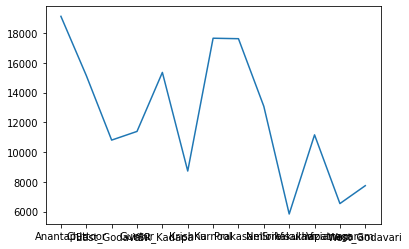

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

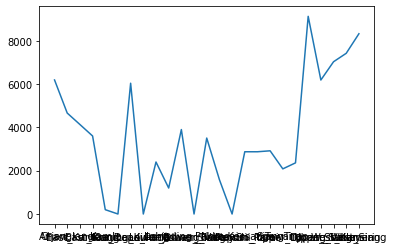

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

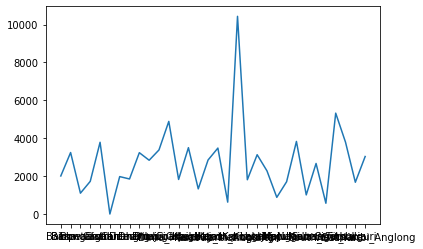

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

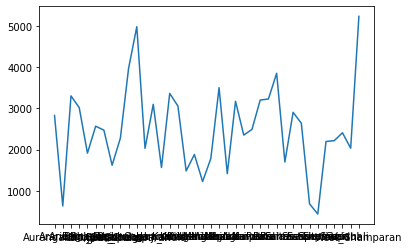

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

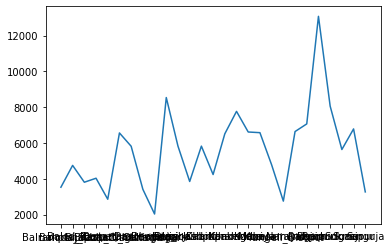

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

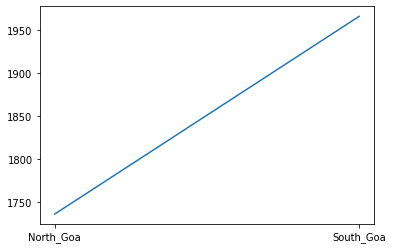

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

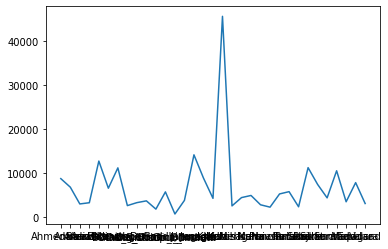

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

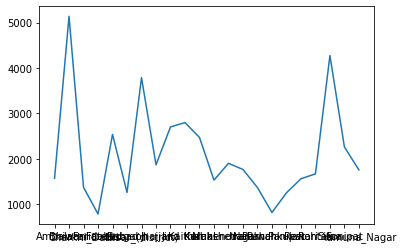

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

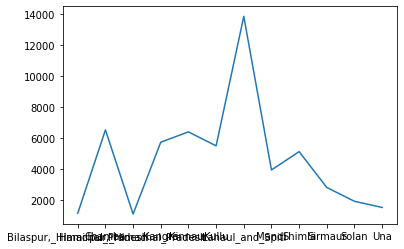

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

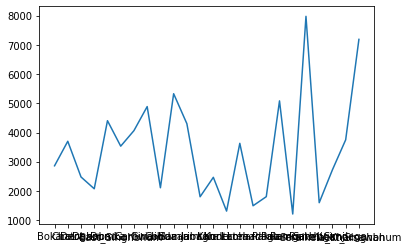

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

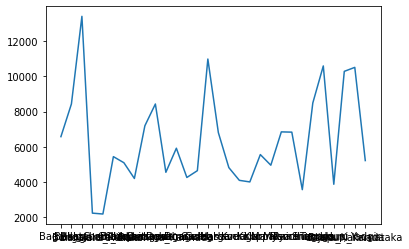

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

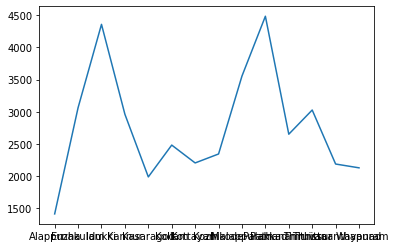

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

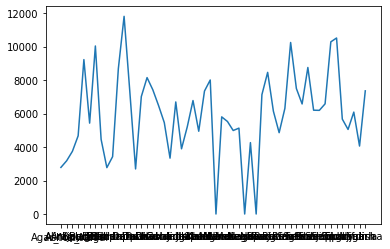

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

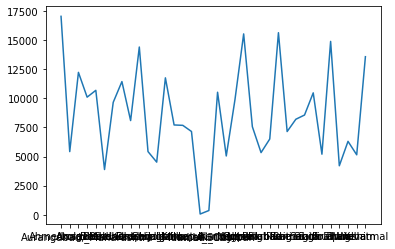

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

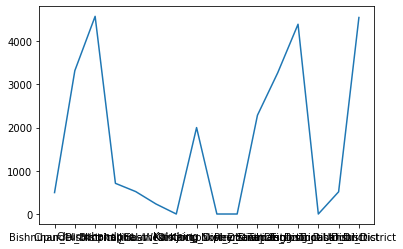

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

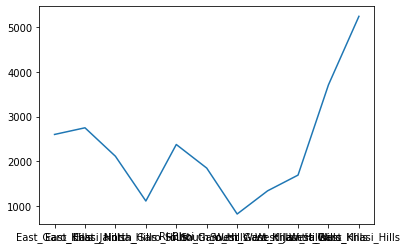

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

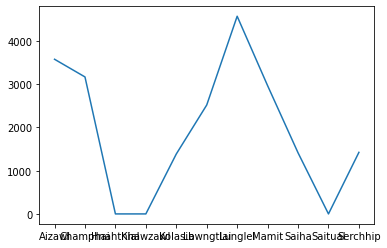

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

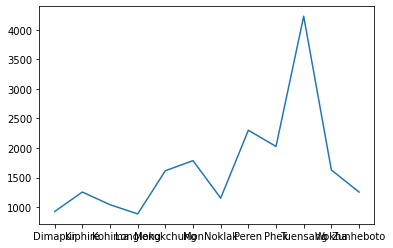

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

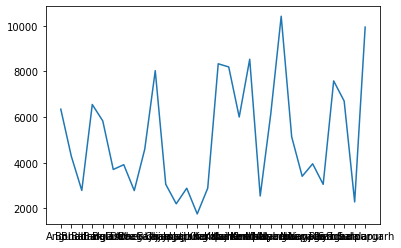

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

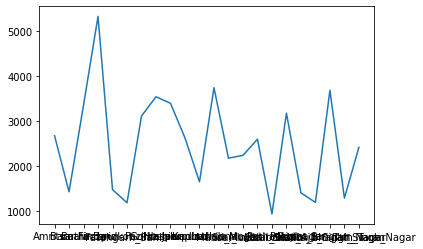

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

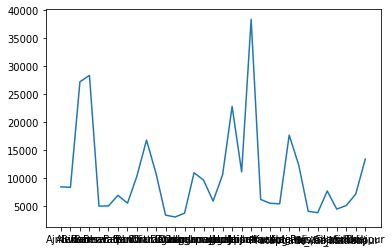

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

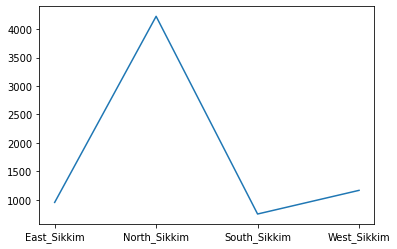

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

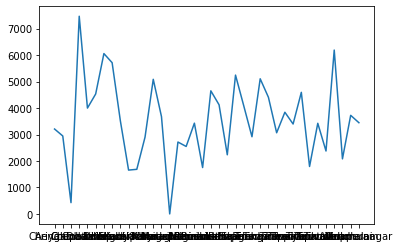

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

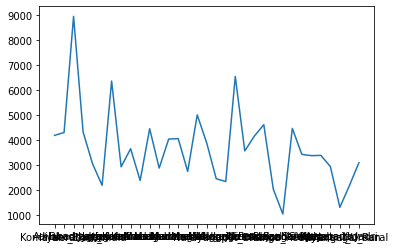

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

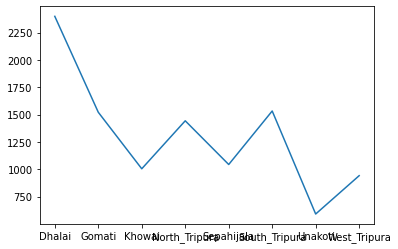

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

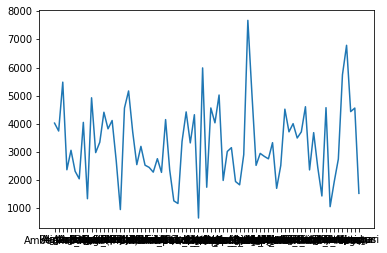

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

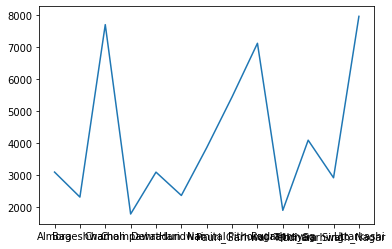

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

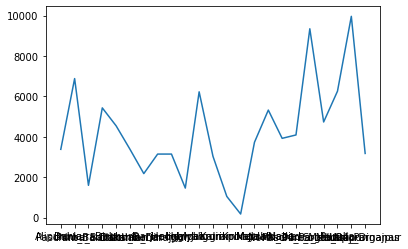

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

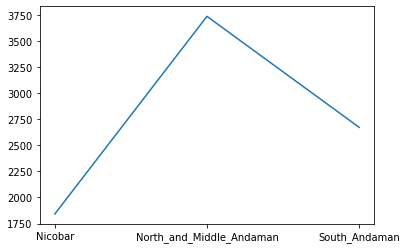

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

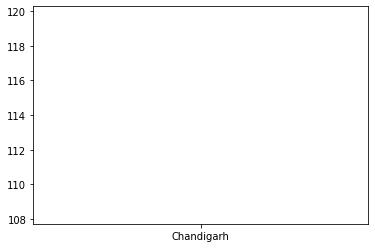

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

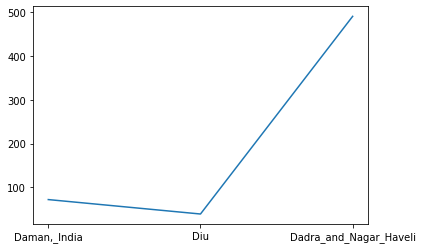

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

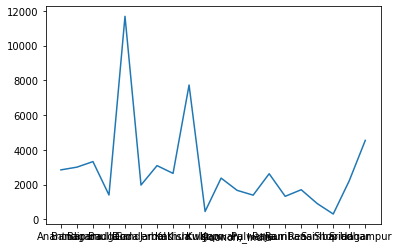

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

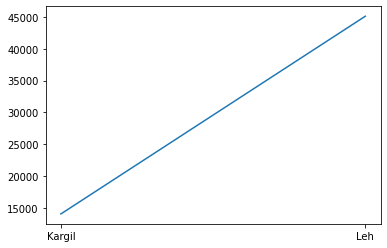

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

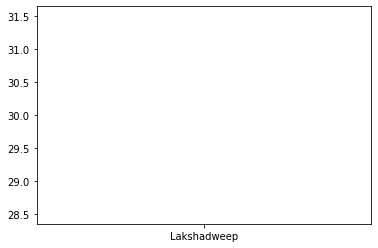

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

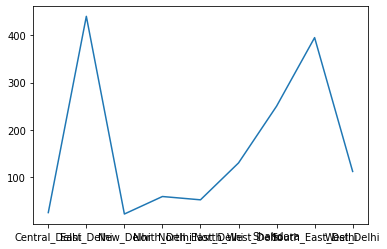

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

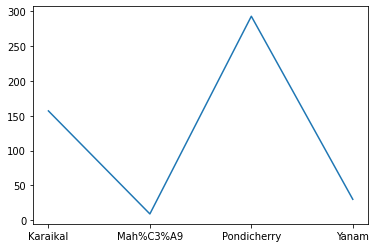

<IPython.core.display.Javascript object>

In [ ]:
from matplotlib import pylab
from google.colab import widgets
from google.colab import data_table
import matplotlib.pyplot as plt
names=[]
for i in states_ter:
  names.append(i.replace('_',' '))
tb = widgets.TabBar(names,location='start')
for i in range(len(states_ter)):
  districts=[]
  areas=[]
  for j in states_districts[i]['District']:
    districts.append(j.replace('_district',''))
  for j in states_districts[i]['Area']:
    areas.append(float(str(j).replace(',','')))
  with tb.output_to(i):
    fig,ax=plt.subplots()
    ax.plot(districts,areas)
    plt.show()

list of top 10 districts in India by size

In [ ]:
for i in range(len(all_area)):
  all_area[i]=float(str(all_area[i]).replace(',',''))
sorted_area=sorted(all_area,reverse=True)
for i in range(10):
  print(all_districts[all_area.index(sorted_area[i])])

Kutch_district
Leh_district
Jaisalmer_district
Barmer_district
Bikaner_district
Jodhpur_district
Anantapur_district
Nagaur_district
Kurnool_district
Prakasam_district


Average area of a district in India

In [ ]:
print(sum(all_area)//len(all_area))

4487.0


median for the given data

In [ ]:
import statistics
print(statistics.median(all_area))

3440.5


To get the information about how the districts are varying in area

In [ ]:
print(statistics.stdev(all_area))

4291.54820955673


There is a large variance in the given data of districts area hence we can say that they deviate very much from the mean and have different sizes

In [ ]:
for i in range(0,len(states_ter)):
  states_ter[i]=states_ter[i][:len(states_ter[i])-5:]

In [ ]:
print(states_ter)
new_population=[52221000,1504000,34293000,119520000,28724000,1540000,67936000,28672000,7300000,37403000,65798000,35125000,82232000,122153000,3103000,3224000,1192000,2150000,43671000,29859000,77264000,664000,75695000,37220000,3992000,224979000,11141000,96906000,397000,1179000,546000,13203000,293000,68000,19814000,1504000]

['Andhra_Pradesh', 'Arunachal_Pradesh', 'Assam', 'Bihar', 'Chhattisgarh', 'Goa', 'Gujarat', 'Haryana', 'Himachal_Pradesh', 'Jharkhand', 'Karnataka', 'Kerala', 'Madhya_Pradesh', 'Maharashtra', 'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Punjab', 'Rajasthan', 'Sikkim', 'Tamil_Nadu', 'Telangana', 'Tripura', 'Uttar_Pradesh', 'Uttarakhand', 'West_Bengal', 'Andaman_and_Nicobar', 'Chandigarh', 'Dadra_and_Nagar_Haveli_and_Daman_and_Diu', 'Jammu_and_Kashmir', 'Ladakh', 'Lakshadweep', 'National_Capital_Territory_of_Delhi', 'Puducherry']


In [ ]:
df1=pd.DataFrame(index=states_ter,columns=["population"])

for i in range(len(states_ter)):
  df1.loc[states_ter[i]]["population"]=new_population[i]
df1

,population
Andhra_Pradesh,52221000
Arunachal_Pradesh,1504000
Assam,34293000
Bihar,119520000
Chhattisgarh,28724000
Goa,1540000
Gujarat,67936000
Haryana,28672000
Himachal_Pradesh,7300000
Jharkhand,37403000


In [ ]:
df2=pd.DataFrame(columns=['District','Population_2019'])
j=0
for i in range(len(all_districts)):
  if j+1<len(l) and all_districts[i]==l[j+1]:
    j=j+1
  df2.loc[i]=[states_ter[j]+'.'+all_districts[i],percent_population[i]*new_population[j]//100]
df2

,District,Population_2019
0,Andhra_Pradesh.Anantapur_district,4317647.0
1,Andhra_Pradesh.Chittoor_district,4409802.0
2,Andhra_Pradesh.East_Godavari_district,5447185.0
3,Andhra_Pradesh.Guntur_district,5169812.0
4,Andhra_Pradesh.YSR_Kadapa_district,3050060.0
...,...,...
729,National_Capital_Territory_of_Delhi.West_Delhi,3001667.0
730,Puducherry.Karaikal_district,282025.0
731,Puducherry.Mah%C3%A9_district,58900.0
732,Puducherry.Pondicherry_district,1338544.0


Top 10 highly populated districts in India

In [ ]:
a=sorted(df2['Population_2019'],reverse=True)
b=list(df2['Population_2019'])
for i in range(10):
  y=b.index(a[i])
  x=df2['District'][y].split('.')
  print(x[0],x[1])


Maharashtra Thane_district
West_Bengal North_24_Parganas_district
Karnataka Bangalore_Urban_district
Maharashtra Pune_district
Maharashtra Mumbai_Suburban_district
West_Bengal South_24_Parganas_district
Gujarat Ahmedabad_district
West_Bengal Murshidabad_district
Rajasthan Jaipur_district
Tamil_Nadu Chennai_district


average population in India and average population per district

In [ ]:
x=df2['Population_2019'].sum()
print("total population of india as of 2019",x)
print('average population per district',x//len(df2['District']))

total population of india as of 2019 1362989307.0
average population per district 1856933.0


variance shown by the data

In [ ]:
print(statistics.stdev(df2['Population_2019']))

1627984.0895146953


all the districts are having high variance and they deviate a lot from each other

**merged data frame along with area**

In [ ]:
df2['area']=all_area
avg_area=sum(all_area)//len(all_area)
print(avg_area)
df2

4487.0


,District,Population_2019,area
0,Andhra_Pradesh.Anantapur_district,4317647.0,19130.0
1,Andhra_Pradesh.Chittoor_district,4409802.0,15152.0
2,Andhra_Pradesh.East_Godavari_district,5447185.0,10807.0
3,Andhra_Pradesh.Guntur_district,5169812.0,11391.0
4,Andhra_Pradesh.YSR_Kadapa_district,3050060.0,15359.0
...,...,...,...
729,National_Capital_Territory_of_Delhi.West_Delhi,3001667.0,112.0
730,Puducherry.Karaikal_district,282025.0,157.0
731,Puducherry.Mah%C3%A9_district,58900.0,9.0
732,Puducherry.Pondicherry_district,1338544.0,293.0


Population Density

In [ ]:
pop_density=[]
for i in range(len(df2['District'])):
  if df2.loc[i]['area']==0:
    pop_density.append(df2.loc[i]['Population_2019']//avg_area)
  else:
    pop_density.append(df2.loc[i]['Population_2019']//df2.loc[i]['area'])

df2['Population density']=pop_density
df2

,District,Population_2019,area,Population density
0,Andhra_Pradesh.Anantapur_district,4317647.0,19130.0,225.0
1,Andhra_Pradesh.Chittoor_district,4409802.0,15152.0,291.0
2,Andhra_Pradesh.East_Godavari_district,5447185.0,10807.0,504.0
3,Andhra_Pradesh.Guntur_district,5169812.0,11391.0,453.0
4,Andhra_Pradesh.YSR_Kadapa_district,3050060.0,15359.0,198.0
...,...,...,...,...
729,National_Capital_Territory_of_Delhi.West_Delhi,3001667.0,112.0,26800.0
730,Puducherry.Karaikal_district,282025.0,157.0,1796.0
731,Puducherry.Mah%C3%A9_district,58900.0,9.0,6544.0
732,Puducherry.Pondicherry_district,1338544.0,293.0,4568.0


In [ ]:
change_names=[]
for i in df2['District']:
  j=i.replace('_district','')
  change_names.append(j.replace('_',' '))

df2['District_name']=change_names
df2.set_index(df2['District_name'],inplace=True)
df2['cases']=[0 for i in range(len(change_names))]
df2

['Andhra Pradesh.Anantapur', 'Andhra Pradesh.Chittoor', 'Andhra Pradesh.East Godavari', 'Andhra Pradesh.Guntur', 'Andhra Pradesh.YSR Kadapa', 'Andhra Pradesh.Krishna', 'Andhra Pradesh.Kurnool', 'Andhra Pradesh.Prakasam', 'Andhra Pradesh.Nellore', 'Andhra Pradesh.Srikakulam', 'Andhra Pradesh.Visakhapatnam', 'Andhra Pradesh.Vizianagaram', 'Andhra Pradesh.West Godavari', 'Arunachal Pradesh.Anjaw', 'Arunachal Pradesh.Changlang', 'Arunachal Pradesh.East Kameng', 'Arunachal Pradesh.East Siang', 'Arunachal Pradesh.Kamle', 'Arunachal Pradesh.Kra Daadi', 'Arunachal Pradesh.Kurung Kumey', 'Arunachal Pradesh.Lepa Rada', 'Arunachal Pradesh.Lohit', 'Arunachal Pradesh.Longding', 'Arunachal Pradesh.Lower Dibang Valley', 'Arunachal Pradesh.Lower Siang', 'Arunachal Pradesh.Lower Subansiri', 'Arunachal Pradesh.Namsai', 'Arunachal Pradesh.Pakke-Kessang', 'Arunachal Pradesh.Papum Pare', 'Arunachal Pradesh.Shi Yomi', 'Arunachal Pradesh.Siang', 'Arunachal Pradesh.Tawang', 'Arunachal Pradesh.Tirap', 'Arunach

,District,Population_2019,area,Population density,District_name,cases
District_name,,,,,,
Andhra Pradesh.Anantapur,Andhra_Pradesh.Anantapur_district,4317647.0,19130.0,225.0,Andhra Pradesh.Anantapur,0
Andhra Pradesh.Chittoor,Andhra_Pradesh.Chittoor_district,4409802.0,15152.0,291.0,Andhra Pradesh.Chittoor,0
Andhra Pradesh.East Godavari,Andhra_Pradesh.East_Godavari_district,5447185.0,10807.0,504.0,Andhra Pradesh.East Godavari,0
Andhra Pradesh.Guntur,Andhra_Pradesh.Guntur_district,5169812.0,11391.0,453.0,Andhra Pradesh.Guntur,0
Andhra Pradesh.YSR Kadapa,Andhra_Pradesh.YSR_Kadapa_district,3050060.0,15359.0,198.0,Andhra Pradesh.YSR Kadapa,0
...,...,...,...,...,...,...
National Capital Territory of Delhi.West Delhi,National_Capital_Territory_of_Delhi.West_Delhi,3001667.0,112.0,26800.0,National Capital Territory of Delhi.West Delhi,0
Puducherry.Karaikal,Puducherry.Karaikal_district,282025.0,157.0,1796.0,Puducherry.Karaikal,0
Puducherry.Mah%C3%A9,Puducherry.Mah%C3%A9_district,58900.0,9.0,6544.0,Puducherry.Mah%C3%A9,0


In [ ]:
a=sorted(df2['Population density'],reverse=True)
b=list(df2['Population density'])
for i in range(10):
  #print(a[i])
  y=b.index(a[i])
  x=df2['District'][y].split('.')
  print(x[0],x[1])


National_Capital_Territory_of_Delhi North_East_Delhi
Maharashtra Mumbai_City_district
National_Capital_Territory_of_Delhi North_West_Delhi
Maharashtra Mumbai_Suburban_district
National_Capital_Territory_of_Delhi Central_Delhi
National_Capital_Territory_of_Delhi West_Delhi
West_Bengal Kolkata_district
National_Capital_Territory_of_Delhi North_Delhi
Tamil_Nadu Chennai_district
National_Capital_Territory_of_Delhi Shahdara


By looking at the observation of districts which are having high density and area . we can infer that not every district , which is having large area is having high population density
The districts having high population are closely clustered within a city

In [ ]:
import json
url="https://api.covid19india.org/districts_daily.json"
request1=urllib.request.urlopen(url)
data=request1.read()
data

b'{\n  "districtsDaily": {\n    "Andaman and Nicobar Islands": {\n      "North and Middle Andaman": [\n        {\n          "active": 0,\n          "confirmed": 1,\n          "deceased": 0,\n          "recovered": 1,\n          "date": "2020-04-21"\n        },\n        {\n          "notes": "",\n          "active": 0,\n          "confirmed": 1,\n          "deceased": 0,\n          "recovered": 1,\n          "date": "2020-04-22"\n        },\n        {\n          "notes": "",\n          "active": 0,\n          "confirmed": 1,\n          "deceased": 0,\n          "recovered": 1,\n          "date": "2020-04-23"\n        },\n        {\n          "notes": "",\n          "active": 0,\n          "confirmed": 1,\n          "deceased": 0,\n          "recovered": 1,\n          "date": "2020-04-24"\n        },\n        {\n          "notes": "",\n          "active": 0,\n          "confirmed": 1,\n          "deceased": 0,\n          "recovered": 1,\n          "date": "2020-04-25"\n        },\n      

In [ ]:
#from pandas.io.json import json_normalize
pd.read_json(data)
data1=json.loads(data)
x=pd.json_normalize(data1['districtsDaily'])
df=pd.json_normalize(x.loc[0][x.axes[1][0]])
df.set_index(df['date'],inplace=True)
y=[]
z=[]
print("Keys in this JSON are : ")
dist=[]
for i in range(len(x.axes[1])):
  j=[k for k in x.axes[1][i].split('.')]
  if j[0] not in y:
    y.append(j[0])
    print("\nstate :-",y[-1],"\nDistricts:-",end=" ")
    dist.append(z)
    z=[]
  print(j[1])
  z.append(j[1])
  print(x.loc[0][x.axes[1][i]])
dist.append(z)
dist.pop(0)

Keys in this JSON are : 

state :- Andaman and Nicobar Islands 
Districts:- North and Middle Andaman
[{'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-21'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-22'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-23'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-24'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-25'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-26'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-27'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-28'}, {'notes': '', 'active': 0, 'confirmed': 1, 'deceased': 0, 'recovered': 1, 'date': '2020-04-29'}, {'notes': '', 'active': 0, 'confirmed'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[]

#Merged dataframe along with number of covid cases in each district

In [ ]:
from matplotlib import pylab
from google.colab import widgets
from google.colab import data_table
tb = widgets.TabBar(y,location='start')
k=0
l=[]
#df3=pd.DataFrame(columns=['active','confirmed','deceased','recovered'])
new_lis=list(df2.axes[0])
print(new_lis)
for i in range(len(y)):
  with tb.output_to(i):
    tb1=widgets.TabBar(dist[i],location='top')
    for j  in range(len(dist[i])):
      with tb1.output_to(j):
        df=pd.json_normalize(x.loc[0][x.axes[1][k]])
        df.set_index(df['date'],inplace=True)
        df=df.drop(columns=['notes','date'])
        nam=str(y[i]+'.'+dist[i][j])
        if nam in new_lis:
          df2.at[nam,'cases']=sum(df['confirmed'])
          print(nam,sum(df['confirmed']))
        k+=1
        l.append(df)
        print(y[i],':',dist[i][j])
        print(df)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

['Andhra Pradesh.Anantapur', 'Andhra Pradesh.Chittoor', 'Andhra Pradesh.East Godavari', 'Andhra Pradesh.Guntur', 'Andhra Pradesh.YSR Kadapa', 'Andhra Pradesh.Krishna', 'Andhra Pradesh.Kurnool', 'Andhra Pradesh.Prakasam', 'Andhra Pradesh.Nellore', 'Andhra Pradesh.Srikakulam', 'Andhra Pradesh.Visakhapatnam', 'Andhra Pradesh.Vizianagaram', 'Andhra Pradesh.West Godavari', 'Arunachal Pradesh.Anjaw', 'Arunachal Pradesh.Changlang', 'Arunachal Pradesh.East Kameng', 'Arunachal Pradesh.East Siang', 'Arunachal Pradesh.Kamle', 'Arunachal Pradesh.Kra Daadi', 'Arunachal Pradesh.Kurung Kumey', 'Arunachal Pradesh.Lepa Rada', 'Arunachal Pradesh.Lohit', 'Arunachal Pradesh.Longding', 'Arunachal Pradesh.Lower Dibang Valley', 'Arunachal Pradesh.Lower Siang', 'Arunachal Pradesh.Lower Subansiri', 'Arunachal Pradesh.Namsai', 'Arunachal Pradesh.Pakke-Kessang', 'Arunachal Pradesh.Papum Pare', 'Arunachal Pradesh.Shi Yomi', 'Arunachal Pradesh.Siang', 'Arunachal Pradesh.Tawang', 'Arunachal Pradesh.Tirap', 'Arunach

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andaman and Nicobar Islands : North and Middle Andaman
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       0          1         0          1
2020-06-25       0          1         0          1
2020-06-26       0          1         0          1
2020-06-27       0          1         0          1
2020-06-28       0          1         0          1

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andaman and Nicobar Islands : South Andaman
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5         15         0         10
2020-04-22       6         16         0         10
2020-04-23      10         20         0         10
2020-04-24      17         27         0         10
2020-04-25      22         32         0         10
...            ...        ...       ...        ...
2020-06-24       3         35         0         32
2020-06-25       3         35         0         32
2020-06-26       3         35         0         32
2020-06-27       3         35         0         32
2020-06-28       3         35         0         32

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andaman and Nicobar Islands : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-06-09       1          1         0          0
2020-06-10       2          2         0          0
2020-06-11       5          5         0          0
2020-06-12       5          5         0          0
2020-06-13       5          5         0          0
2020-06-14       7          7         0          0
2020-06-15       8          8         0          0
2020-06-16       8          8         0          0
2020-06-17       8          8         0          0
2020-06-18       7          9         0          2
2020-06-19       9         11         0          2
2020-06-20       9         11         0          2
2020-06-21       8         12         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andaman and Nicobar Islands : Nicobars
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Anantapur 21021
Andhra Pradesh : Anantapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      31         36         3          2
2020-04-22      31         36         3          2
2020-04-23      32         42         3          7
2020-04-24      31         46         4         11
2020-04-25      34         51         4         13
...            ...        ...       ...        ...
2020-06-24     674       1028         7        347
2020-06-25     726       1080         7        347
2020-06-26     764       1159         7        388
2020-06-27     850       1320         7        463
2020-06-28     662       1371         7        702

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Chittoor 18017
Andhra Pradesh : Chittoor
            active  confirmed  deceased  recovered
date                                              
2020-04-21      49         53         0          4
2020-04-22      55         59         0          4
2020-04-23      62         73         0         11
2020-04-24      62         73         0         11
2020-04-25      62         73         0         11
...            ...        ...       ...        ...
2020-06-24     367        657         6        284
2020-06-25     404        699         6        289
2020-06-26     429        725         6        290
2020-06-27     493        809         6        310
2020-06-28     550        891         6        335

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.East Godavari 15230
Andhra Pradesh : East Godavari
            active  confirmed  deceased  recovered
date                                              
2020-04-21      18         26         0          8
2020-04-22      18         26         0          8
2020-04-23      24         32         0          8
2020-04-24      26         34         0          8
2020-04-25      25         37         0         12
...            ...        ...       ...        ...
2020-06-24     450        760         5        305
2020-06-25     510        824         6        308
2020-06-26     519        836         6        311
2020-06-27     623        945         7        315
2020-06-28     666       1002         7        329

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Guntur 34327
Andhra Pradesh : Guntur
            active  confirmed  deceased  recovered
date                                              
2020-04-21     136        157         6         15
2020-04-22     156        177         6         15
2020-04-23     164        195         8         23
2020-04-24     175        206         8         23
2020-04-25     178        209         8         23
...            ...        ...       ...        ...
2020-06-24     376        891        14        501
2020-06-25     431        958        16        511
2020-06-26     477       1032        17        538
2020-06-27     548       1103        17        538
2020-06-28     624       1193        17        552

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Krishna 35154
Andhra Pradesh : Krishna
            active  confirmed  deceased  recovered
date                                              
2020-04-21      63         83         6         14
2020-04-22      66         86         6         14
2020-04-23      56         88         7         25
2020-04-24      70        102         7         25
2020-04-25      90        127         8         29
...            ...        ...       ...        ...
2020-06-24     575       1132        43        514
2020-06-25     615       1179        45        519
2020-06-26     626       1199        49        524
2020-06-27     639       1252        53        560
2020-06-28     701       1331        58        572

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Kurnool 51547
Andhra Pradesh : Kurnool
            active  confirmed  deceased  recovered
date                                              
2020-04-21     175        184         5          4
2020-04-22     194        203         5          4
2020-04-23     223        234         7          4
2020-04-24     249        261         8          4
2020-04-25     259        275         9          7
...            ...        ...       ...        ...
2020-06-24     634       1483        42        807
2020-06-25     684       1555        44        827
2020-06-26     694       1615        48        873
2020-06-27     701       1684        52        931
2020-06-28     770       1787        58        959

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Prakasam 6404
Andhra Pradesh : Prakasam
            active  confirmed  deceased  recovered
date                                              
2020-04-21      43         44         0          1
2020-04-22      47         48         0          1
2020-04-23      49         50         0          1
2020-04-24      52         53         0          1
2020-04-25      41         53         0         12
...            ...        ...       ...        ...
2020-06-24      98        200         2        100
2020-06-25      88        218         2        128
2020-06-26     111        246         2        133
2020-06-27     123        272         2        147
2020-06-28     164        313         2        147

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : S
            active  confirmed  deceased  recovered
date                                              
2020-04-21      64         68         2          2
2020-04-22      63         67         2          2
2020-04-23      59         67         2          6
2020-04-24      60         68         2          6
2020-04-25      62         72         2          8
...            ...        ...       ...        ...
2020-06-24     194        493         4        295
2020-06-25     212        522         4        306
2020-06-26     227        537         4        306
2020-06-27     230        561         4        327
2020-06-28     248        579         4        327

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Visakhapatnam 8862
Andhra Pradesh : Visakhapatnam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3         21         0         18
2020-04-22       3         21         0         18
2020-04-23       3         22         0         19
2020-04-24       3         22         0         19
2020-04-25       3         22         0         19
...            ...        ...       ...        ...
2020-06-24     179        367         2        186
2020-06-25     219        407         2        186
2020-06-26     201        427         3        223
2020-06-27     231        461         3        227
2020-06-28     271        505         3        231

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.West Godavari 13282
Andhra Pradesh : West Godavari
            active  confirmed  deceased  recovered
date                                              
2020-04-21      30         39         0          9
2020-04-22      30         39         0          9
2020-04-23      30         39         0          9
2020-04-24      30         39         0          9
2020-04-25      30         39         0          9
...            ...        ...       ...        ...
2020-06-24     547        663         1        115
2020-06-25     565        681         1        115
2020-06-26     643        760         1        116
2020-06-27     661        804         2        141
2020-06-28     703        875         3        169

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Y
            active  confirmed  deceased  recovered
date                                              
2020-04-21      27         46         0         19
2020-04-22      32         51         0         19
2020-04-23      23         51         0         28
2020-04-24      23         51         0         28
2020-04-25      27         55         0         28
2020-04-26      30         58         0         28
2020-04-27      30         58         0         28
2020-04-28      37         65         0         28
2020-04-29      41         69         0         28
2020-04-30      45         73         0         28
2020-05-01      42         79         0         37


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Srikakulam 1663
Andhra Pradesh : Srikakulam
            active  confirmed  deceased  recovered
date                                              
2020-04-25       3          3         0          0
2020-04-26       3          3         0          0
2020-04-27       4          4         0          0
2020-04-28       4          4         0          0
2020-04-29       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      36         60         2         22
2020-06-25      23         61         2         36
2020-06-26      24         62         2         36
2020-06-27      22         62         2         38
2020-06-28      21         62         2         39

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Y
            active  confirmed  deceased  recovered
date                                              
2020-05-02      46         83         0         37


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Y
            active  confirmed  deceased  recovered
date                                              
2020-05-03      46         83         0         37
2020-05-04      50         87         0         37
2020-05-05      50         89         0         39
2020-05-06      50         90         0         40
2020-05-07      56         96         0         40
2020-05-08      53         96         0         43
2020-05-09      53         96         0         43
2020-05-10      54         97         0         43
2020-05-11      52         97         0         45
2020-05-12      51         97         0         46
2020-05-13      41         97         0         56
2020-05-14      43         99         0         56
2020-05-15      38        101         0         63
2020-05-16      37        102         0         65
2020-05-17      34        102         0         68
2020-05-18      35        104         0         69
2020-05-19      35        104         0         69
2020-05-20  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-05      14         14         0          0
2020-05-06      27         27         0          0
2020-05-07      27         27         0          0
2020-05-08      27         27         0          0
2020-05-09      27         27         0          0
2020-05-10      27         27         0          0
2020-05-11      27         27         0          0
2020-05-12      27         27         0          0
2020-05-13      73         73         0          0
2020-05-14     105        105         0          0
2020-05-15     150        150         0          0
2020-05-16     150        150         0          0
2020-05-17     127        150         0         23
2020-05-18     125        150         0         25
2020-05-19     125        150         0         25
2020-05-20     128        153         0         25
2020-05-21     128        153         0         25
20

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh.Vizianagaram 2213
Andhra Pradesh : Vizianagaram
            active  confirmed  deceased  recovered
date                                              
2020-05-07       3          3         0          0
2020-05-08       4          4         0          0
2020-05-09       4          4         0          0
2020-05-10       4          4         0          0
2020-05-11       4          4         0          0
2020-05-12       4          4         0          0
2020-05-13       4          4         0          0
2020-05-14       4          4         0          0
2020-05-15       7          7         0          0
2020-05-16       7          7         0          0
2020-05-17       7          7         0          0
2020-05-18       8          8         0          0
2020-05-19       8          8         0          0
2020-05-20      12         16         0          4
2020-05-21      12         16         0          4
2020-05-22      12         16         0          4
2020-05-23      12 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-19     -12         57         0         69
2020-05-21       4         45         0         41
2020-05-22      39        107         1         67
2020-05-23      39        154         1        114
2020-05-24      43        220         1        176
2020-05-25      46        264         1        217
2020-05-26      38        312         2        272
2020-05-27      -8          0         0          8
2020-05-28      -8          0         0          8
2020-05-29      -8          0         0          8
2020-05-30      -8          0         0          8
2020-05-31      -8          0         0          8
2020-06-01      -8          0         0          8
2020-06-02      -8          0         0          8
2020-06-03      -8          0         0          8
2020-06-04      -9          0         0          9
2020-06-05      -9          0         0          9
2020-0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Andhra Pradesh : Foreign Evacuees
            active  confirmed  deceased  recovered
date                                              
2020-05-25      62         62         0          0
2020-05-26     111        111         0          0
2020-05-27     111        111         0          0
2020-05-28     111        111         0          0
2020-05-29     111        111         0          0
2020-05-30     111        111         0          0
2020-05-31     111        111         0          0
2020-06-01     112        112         0          0
2020-06-02     112        112         0          0
2020-06-03     118        119         0          1
2020-06-04     115        119         0          4
2020-06-05     119        123         0          4
2020-06-06     127        131         0          4
2020-06-07     126        131         0          5
2020-06-08     126        132         0          6
2020-06-09     114        132         0         18
2020-06-10     170        188         0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Lohit 116
Arunachal Pradesh : Lohit
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       2          4         0          2
2020-06-25       2          4         0          2
2020-06-26       1          4         0          3
2020-06-27       1          4         0          3
2020-06-28       1          4         0          3

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Anjaw 0
Arunachal Pradesh : Anjaw
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Changlang 1473
Arunachal Pradesh : Changlang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.East Kameng 0
Arunachal Pradesh : East Kameng
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.East Siang 169
Arunachal Pradesh : East Siang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Kamle 0
Arunachal Pradesh : Kamle
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Kra Daadi 0
Arunachal Pradesh : Kra Daadi
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Kurung Kumey 0
Arunachal Pradesh : Kurung Kumey
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Lepa Rada 7
Arunachal Pradesh : Lepa Rada
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Longding 37
Arunachal Pradesh : Longding
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Lower Dibang Valley 49
Arunachal Pradesh : Lower Dibang Valley
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Lower Siang 12
Arunachal Pradesh : Lower Siang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Lower Subansiri 0
Arunachal Pradesh : Lower Subansiri
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Namsai 108
Arunachal Pradesh : Namsai
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh : Pakke Kessang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Papum Pare 464
Arunachal Pradesh : Papum Pare
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Shi Yomi 0
Arunachal Pradesh : Shi Yomi
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Siang 0
Arunachal Pradesh : Siang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Tawang 34
Arunachal Pradesh : Tawang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Tirap 47
Arunachal Pradesh : Tirap
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Upper Dibang Valley 0
Arunachal Pradesh : Upper Dibang Valley
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
20

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Upper Siang 26
Arunachal Pradesh : Upper Siang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.Upper Subansiri 0
Arunachal Pradesh : Upper Subansiri
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.West Kameng 146
Arunachal Pradesh : West Kameng
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh.West Siang 28
Arunachal Pradesh : West Siang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Arunachal Pradesh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       2          2         0          0
2020-05-30       2          2         0          0
2020-05-31       3          3         0          0
2020-06-01       2          2         0          0
2020-06-02       3          3         0          0
2020-06-05       2          2         0          0
2020-06-10      -2          0         0          2
2020-06-14       7          7         0          0
2020-06-17      -3          0         0          3
2020-06-25      -4          0         0          4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Cachar 3109
Assam : Cachar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      16         98         0         82
2020-06-25      16         98         0         82
2020-06-26      16         98         0         82
2020-06-27      16         98         0         82
2020-06-28      16         98         0         82

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Dhubri 8237
Assam : Dhubri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
...            ...        ...       ...        ...
2020-06-24     325        330         0          5
2020-06-25     329        334         0          5
2020-06-26     329        334         0          5
2020-06-27     329        334         0          5
2020-06-28     329        334         0          5

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Goalpara 1796
Assam : Goalpara
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       1          4         0          3
2020-04-23       1          4         0          3
2020-04-24       1          4         0          3
2020-04-25       1          4         0          3
...            ...        ...       ...        ...
2020-06-24      38         57         0          4
2020-06-25      38         57         0          4
2020-06-26      38         57         0          4
2020-06-27      38         57         0          4
2020-06-28      38         57         0          4

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Golaghat 8031
Assam : Golaghat
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24     184        272         0         88
2020-06-25     184        272         0         88
2020-06-26     184        272         0         88
2020-06-27     184        272         0         88
2020-06-28     184        272         0         88

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Hailakandi 1833
Assam : Hailakandi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         1          0
2020-04-23       0          1         1          0
2020-04-24       0          1         1          0
2020-04-25       0          1         1          0
...            ...        ...       ...        ...
2020-06-24      72         78         1          5
2020-06-25      72         78         1          5
2020-06-26      72         78         1          5
2020-06-27      72         78         1          5
2020-06-28      72         78         1          5

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : Jorhat
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       8          8         0          0
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25       8          8         0          0
...            ...        ...       ...        ...
2020-06-24      85        139         0         54
2020-06-25      85        139         0         54
2020-06-26      85        139         0         54
2020-06-27      85        139         0         54
2020-06-28      85        139         0         54

[61 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Kamrup 5177
Assam : Kamrup
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24     191        212         0         21
2020-06-25     194        215         0         21
2020-06-26     194        215         0         21
2020-06-27     194        215         0         21
2020-06-28     194        215         0         21

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Kamrup Metropolitan 18483
Assam : Kamrup Metropolitan
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       6          6         0          0
...            ...        ...       ...        ...
2020-06-24     304        691         4        383
2020-06-25     327        714         4        383
2020-06-26     327        714         4        383
2020-06-27     530        917         4        383
2020-06-28     530        917         4        383

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Lakhimpur 2287
Assam : Lakhimpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      76         82         0          6
2020-06-25      76         82         0          6
2020-06-26      76         82         0          6
2020-06-27      76         82         0          6
2020-06-28      76         82         0          6

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Morigaon 1705
Assam : Morigaon
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      21         49         0         28
2020-06-25      21         49         0         28
2020-06-26      21         49         0         28
2020-06-27      21         49         0         28
2020-06-28      21         49         0         28

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Nalbari 983
Assam : Nalbari
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      17         26         0          9
2020-06-25      19         28         0          9
2020-06-26      19         28         0          9
2020-06-27      19         28         0          9
2020-06-28      19         28         0          9

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : South Salmara Mancachar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
2020-04-29       0          1         0          1
2020-04-30       0          1         0          1
2020-05-01       0          1         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24     -12          1         0         13
2020-04-25     -12          1         0         13
2020-04-26     -20          1         0         21
2020-04-27     -20          1         0         21
2020-04-28       0          1         0         21
2020-04-29       0          1         0         21
2020-04-30       0          1         0         21
2020-05-17      -1          0         0          1
2020-05-18      -2          0         1          1
2020-05-19      14         16         1          1
2020-05-21      -1          5         0          6
2020-05-22      32         32         0          0
2020-05-23       2          2         0          0
2020-05-27     -25          0         0         25
2020-05-28     -21          4         0         25
2020-05-31      23         23         0          0
2020-06-01     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Bongaigaon 679
Assam : Bongaigaon
            active  confirmed  deceased  recovered
date                                              
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       5          5         0          0
2020-05-01       5          5         0          0
2020-05-02       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      17         24         0          7
2020-06-25      17         24         0          7
2020-06-26      17         24         0          7
2020-06-27      17         24         0          7
2020-06-28      17         24         0          7

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Karimganj 2728
Assam : Karimganj
            active  confirmed  deceased  recovered
date                                              
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-06       1          2         0          1
2020-05-07       1          2         0          1
2020-05-08       1          2         0          1
2020-05-09       1          2         0          1
2020-05-10       1          2         0          1
2020-05-11       1          2         0          1
2020-05-12       1          2         0          1
2020-05-13       1          2         0          1
2020-05-14       1          2         0          1
2020-05-15       1          2         0          1
2020-05-16       1          2         0          1
2020-05-17       1          2         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-01       0          1         0          1
2020-05-02       0          1         0          1
2020-05-03       0          1         0          1
2020-05-04       0          1         0          1
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       0          1         0          1
2020-05-11       0          1         0          1
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       0          1         0          1
2020-05-16       0          1         0          1
2020-05-17       0          1         0          1
2020-05-18 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : South Salmara Mankachar
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          1         0          1
2020-05-03       0          1         0          1
2020-05-04       0          1         0          1
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       0          1         0          1
2020-05-11       0          1         0          1
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       0          1         0          1
2020-05-16       0          1         0          1
2020-05-17       0          1         0          1
2020-05-18       0          1         0          1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Kokrajhar 2226
Assam : Kokrajhar
            active  confirmed  deceased  recovered
date                                              
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       2          2         0          0
2020-05-20       2          2         0          0
2020-05-21       6          6         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Baksa 1198
Assam : Baksa
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Barpeta 3272
Assam : Barpeta
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       4          4         0          0
2020-05-26      13         13         0          0
2020-05-27      13         13         0          0
2020-05-28      16         16         0          0
2020-05-29      16         16         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : Biswanath
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20       2          2         0          0
2020-05-21       2          2         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       2          2         0          0
2020-05-28       2          2         0          0
2020-05-29       2          2         0          0
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Charaideo 471
Assam : Charaideo
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       9          9         0          0
2020-05-28       9          9         0          0
2020-05-29       9          9         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Chirang 1291
Assam : Chirang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       4          4         0          0
2020-05-24       6          6         0          0
2020-05-25       6          6         0          0
2020-05-26       6          6         0          0
2020-05-27       6          6         0          0
2020-05-28       6          6         0          0
2020-05-29       6          6         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Darrang 2352
Assam : Darrang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       2          2         0          0
2020-05-27       8          8         0          0
2020-05-28       8          8         0          0
2020-05-29       8          8         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Dhemaji 2056
Assam : Dhemaji
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       4          4         0          0
2020-05-26       4          4         0          0
2020-05-27       5          5         0          0
2020-05-28       8          8         0          0
2020-05-29      12         12         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Dibrugarh 1712
Assam : Dibrugarh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       4          4         0          0
2020-05-29       5          5         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Dima Hasao 2270
Assam : Dima Hasao
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       7          7         0          0
2020-05-24       7          7         0          0
2020-05-25       7          7         0          0
2020-05-26       7          7         0          0
2020-05-27       7          7         0          0
2020-05-28       8          8         0          0
2020-05-29       8          8         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Hojai 6870
Assam : Hojai
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20      10         10         0          0
2020-05-21      10         10         0          0
2020-05-22      10         10         0          0
2020-05-23      15         15         0          0
2020-05-24      25         25         0          0
2020-05-25      25         25         0          0
2020-05-26      26         26         0          0
2020-05-27      46         46         0          0
2020-05-28      47         47         0          0
2020-05-29      55         55         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Karbi Anglong 688
Assam : Karbi Anglong
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       2          2         0          0
2020-05-27       4          4         0          0
2020-05-28       4          4         0          0
2020-05-29       8          8       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Majuli 336
Assam : Majuli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Nagaon 6506
Assam : Nagaon
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20       4          4         0          0
2020-05-21       4          4         0          0
2020-05-22       5          5         0          0
2020-05-23       6          6         0          0
2020-05-24      10         10         0          0
2020-05-25      11         11         0          0
2020-05-26      19         19         0          0
2020-05-27      23         23         0          0
2020-05-28      33         33         0          0
2020-05-29      34         34         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Sivasagar 879
Assam : Sivasagar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       3          3         0          0
2020-05-22       6          6         0          0
2020-05-23       7          7         0          0
2020-05-24       7          7         0          0
2020-05-25      12         12         0          0
2020-05-26      12         12         0          0
2020-05-27      13         13         0          0
2020-05-28      13         13         0          0
2020-05-29      13         13         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Sonitpur 1771
Assam : Sonitpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       3          3         0          0
2020-05-21       8          8         0          0
2020-05-22      14         14         0          0
2020-05-23      14         14         0          0
2020-05-24      14         14         0          0
2020-05-25      14         14         0          0
2020-05-26      14         14         0          0
2020-05-27      14         14         0          0
2020-05-28      14         14         0          0
2020-05-29      14         14         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Tinsukia 2664
Assam : Tinsukia
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       1          1         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       6          6         0          0
2020-05-26       6          6         0          0
2020-05-27       6          6         0          0
2020-05-28       6          6         0          0
2020-05-29      26         26         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.Udalguri 2350
Assam : Udalguri
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       3          3         0          0
2020-05-27       3          3         0          0
2020-05-28       3          3         0          0
2020-05-29       3          3         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam.West Karbi Anglong 658
Assam : West Karbi Anglong
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       2          2         0          0
2020-05-22       1          1         0          0
2020-05-23       2          2         0          0
2020-05-24       5          5         0          0
2020-05-25       5          5         0          0
2020-05-26       5          5         0          0
2020-05-27       5          5         0          0
2020-05-28       5          5         0          0
2020-05-29       4        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Assam : Airport Quarantine
            active  confirmed  deceased  recovered
date                                              
2020-06-13       4          4         0          0
2020-06-14       4          4         0          0
2020-06-15       4          4         0          0
2020-06-16       4          4         0          0
2020-06-17       4          4         0          0
2020-06-18       4          4         0          0
2020-06-19       4          4         0          0
2020-06-20       4          4         0          0
2020-06-21       4          4         0          0
2020-06-22       4          4         0          0
2020-06-23       4          4         0          0
2020-06-24       4          4         0          0
2020-06-25       4          4         0          0
2020-06-26       4          4         0          0
2020-06-27       4          4         0          0
2020-06-28       4          4         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Begusarai 11288
Bihar : Begusarai
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22       8          9         0          1
2020-04-23       8          9         0          1
2020-04-24       8          9         0          1
2020-04-25       8          9         0          1
...            ...        ...       ...        ...
2020-06-24      75        364         4        285
2020-06-25      40        374         4        330
2020-06-26      42        382         3        337
2020-06-27      48        389         4        337
2020-06-28      57        398         4        337

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Bhagalpur 10419
Bihar : Bhagalpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       4          5         0          1
2020-04-23       4          5         0          1
2020-04-24       4          5         0          1
2020-04-25       4          5         0          1
...            ...        ...       ...        ...
2020-06-24      63        382         1        318
2020-06-25      68        389         1        320
2020-06-26      85        407         1        321
2020-06-27     107        440         1        332
2020-06-28     146        479         1        332

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar : Bhojpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      26        165         2        137
2020-06-25      27        166         2        137
2020-06-26      27        166         2        137
2020-06-27      69        209         2        138
2020-06-28      69        209         2        138

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Buxar 7211
Bihar : Buxar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       8          8         0          0
2020-04-23       8          8         0          0
2020-04-24      20         20         0          0
2020-04-25      25         25         0          0
...            ...        ...       ...        ...
2020-06-24      60        205         0        145
2020-06-25      63        210         0        147
2020-06-26      46        210         0        164
2020-06-27      29        224         0        195
2020-06-28      29        224         0        195

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Gaya 4760
Bihar : Gaya
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       1          5         0          4
2020-04-23       1          5         0          4
2020-04-24       1          5         0          4
2020-04-25       2          6         0          4
...            ...        ...       ...        ...
2020-06-24      43        184         2        139
2020-06-25      43        184         2        139
2020-06-26      52        193         2        139
2020-06-27      51        193         2        140
2020-06-28      57        199         2        140

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar : Gopalganj
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       0          3         0          3
2020-04-23       0          3         0          3
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24      48        222         0        174
2020-06-25      43        227         0        184
2020-06-26      57        241         0        184
2020-06-27      62        246         0        184
2020-06-28      64        248         0        184

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Lakhisarai 2717
Bihar : Lakhisarai
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      30         97         0         67
2020-06-25      38        108         0         70
2020-06-26      40        110         0         70
2020-06-27      42        125         0         83
2020-06-28      42        125         0         83

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Munger 11690
Bihar : Munger
            active  confirmed  deceased  recovered
date                                              
2020-04-21      27         27         0          0
2020-04-22      20         27         1          6
2020-04-23      24         31         1          6
2020-04-24      55         62         1          6
2020-04-25      58         65         1          6
...            ...        ...       ...        ...
2020-06-24      61        321         1        259
2020-06-25      53        322         1        268
2020-06-26      57        332         1        274
2020-06-27      50        333         1        282
2020-06-28      57        340         1        282

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Nalanda 6633
Bihar : Nalanda
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         28         0          0
2020-04-22      27         29         0          2
2020-04-23      29         31         0          2
2020-04-24      32         34         0          2
2020-04-25      32         34         0          2
...            ...        ...       ...        ...
2020-06-24      43        194         3        148
2020-06-25      34        195         3        158
2020-06-26      35        198         3        160
2020-06-27      34        200         3        163
2020-06-28      37        203         3        163

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Nawada 6074
Bihar : Nawada
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       2          3         0          1
2020-04-23       2          3         0          1
2020-04-24       2          3         0          1
2020-04-25       2          3         0          1
...            ...        ...       ...        ...
2020-06-24      28        218         2        188
2020-06-25      35        229         2        192
2020-06-26      46        240         2        192
2020-06-27      55        253         2        196
2020-06-28      59        257         2        196

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Patna 14518
Bihar : Patna
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22      11         16         0          5
2020-04-23      19         24         0          5
2020-04-24      21         26         0          5
2020-04-25      28         33         0          5
...            ...        ...       ...        ...
2020-06-24     210        501         4        287
2020-06-25     221        516         5        290
2020-06-26     244        539         5        290
2020-06-27     259        564         5        300
2020-06-28     279        584         5        300

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Rohtas 11205
Bihar : Rohtas
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       9          9         0          0
...            ...        ...       ...        ...
2020-06-24      45        316         1        270
2020-06-25      24        322         1        297
2020-06-26      16        322         1        305
2020-06-27      18        325         2        305
2020-06-28      24        331         2        305

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Saran 4809
Bihar : Saran
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       1          2         0          1
2020-04-25       2          3         0          1
...            ...        ...       ...        ...
2020-06-24      47        187         5        135
2020-06-25      23        188         5        160
2020-06-26      32        197         5        160
2020-06-27      18        200         5        177
2020-06-28      18        200         5        177

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Siwan 8598
Bihar : Siwan
            active  confirmed  deceased  recovered
date                                              
2020-04-21      29         29         0          0
2020-04-22      12         29         0         17
2020-04-23      13         30         0         17
2020-04-24      13         30         0         17
2020-04-25      13         30         0         17
...            ...        ...       ...        ...
2020-06-24     171        390         2        217
2020-06-25     174        399         2        223
2020-06-26     157        400         2        241
2020-06-27     124        402         2        276
2020-06-28     124        402         2        276

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Vaishali 3849
Bihar : Vaishali
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         1          0
2020-04-23       0          1         1          0
2020-04-24       0          1         1          0
2020-04-25       1          2         1          0
...            ...        ...       ...        ...
2020-06-24      34        139         3        102
2020-06-25      34        140         3        103
2020-06-26      25        140         3        112
2020-06-27      28        144         3        113
2020-06-28      28        144         3        113

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Banka 6133
Bihar : Banka
            active  confirmed  deceased  recovered
date                                              
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
2020-04-26       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      54        222         0        168
2020-06-25      51        223         0        172
2020-06-26      51        223         0        172
2020-06-27      30        227         0        197
2020-06-28      30        227         0        197

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.East Champaran 5236
Bihar : East Champaran
            active  confirmed  deceased  recovered
date                                              
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      16        167         1        150
2020-06-25      17        174         1        156
2020-06-26      16        174         1        157
2020-06-27      18        176         1        157
2020-06-28      18        176         1        157

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar : Kaimur Bhabua
            active  confirmed  deceased  recovered
date                                              
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25      14         14         0          0
2020-04-26      14         14         0          0
2020-04-27      14         14         0          0
2020-04-28      18         18         0          0
2020-04-29      18         18         0          0
2020-04-30      18         18         0          0
2020-05-01      24         24         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar : Aurangabad
            active  confirmed  deceased  recovered
date                                              
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
2020-04-26       2          2         0          0
2020-04-27       7          7         0          0
2020-04-28       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      54        182         1        127
2020-06-25      48        190         1        141
2020-06-26      40        193         1        152
2020-06-27      33        202         1        168
2020-06-28      41        210         1        168

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Madhepura 4480
Bihar : Madhepura
            active  confirmed  deceased  recovered
date                                              
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      27        162         1        134
2020-06-25      33        168         1        134
2020-06-26      23        168         1        144
2020-06-27      41        187         1        145
2020-06-28      41        187         1        145

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Arwal 2656
Bihar : Arwal
            active  confirmed  deceased  recovered
date                                              
2020-04-25       1          1         0          0
2020-04-26       4          4         0          0
2020-04-27       4          4         0          0
2020-04-28       4          4         0          0
2020-04-29       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      28         95         0         67
2020-06-25      26         96         0         70
2020-06-26      23         96         0         73
2020-06-27      25        101         0         76
2020-06-28      28        104         0         76

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Jehanabad 7147
Bihar : Jehanabad
            active  confirmed  deceased  recovered
date                                              
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       4          4         0          0
2020-04-29       4          4         0          0
2020-04-30       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      30        222         2        190
2020-06-25      32        224         2        190
2020-06-26      22        225         2        201
2020-06-27      30        233         2        201
2020-06-28      42        245         2        201

[64 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Darbhanga 5979
Bihar : Darbhanga
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       5          5         0          0
2020-04-30       5          5         0          0
2020-05-01       5          5         0          0
...            ...        ...       ...        ...
2020-06-24     108        272         5        159
2020-06-25     105        281         5        171
2020-06-26      91        282         5        186
2020-06-27      94        286         5        187
2020-06-28      94        286         5        187

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Madhubani 10876
Bihar : Madhubani
            active  confirmed  deceased  recovered
date                                              
2020-04-27       5          5         0          0
2020-04-28       5          5         0          0
2020-04-29       5          5         0          0
2020-04-30       5          5         0          0
2020-05-01      18         18         0          0
...            ...        ...       ...        ...
2020-06-24     218        394         1        175
2020-06-25     127        400         1        272
2020-06-26     148        422         2        272
2020-06-27     158        437         2        277
2020-06-28     160        439         2        277

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Purnia 6646
Bihar : Purnia
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      48        270         0        222
2020-06-25      62        284         0        222
2020-06-26      34        287         0        253
2020-06-27      30        288         0        258
2020-06-28      30        288         0        258

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Araria 2758
Bihar : Araria
            active  confirmed  deceased  recovered
date                                              
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      20        103         1         82
2020-06-25      20        103         1         82
2020-06-26      30        116         1         85
2020-06-27      15        116         1        100
2020-06-28      15        116         1        100

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Sheikhpura 4225
Bihar : Sheikhpura
            active  confirmed  deceased  recovered
date                                              
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      30        133         0        103
2020-06-25      31        134         0        103
2020-06-26      23        137         0        114
2020-06-27      21        140         0        119
2020-06-28      26        145         0        119

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Sitamarhi 3385
Bihar : Sitamarhi
            active  confirmed  deceased  recovered
date                                              
2020-04-28       1          1         0          0
2020-04-29       2          2         0          0
2020-04-30       6          6         0          0
2020-05-01       6          6         0          0
2020-05-02       6          6         0          0
...            ...        ...       ...        ...
2020-06-24      14        130         2        114
2020-06-25      12        130         2        116
2020-06-26      12        130         2        116
2020-06-27      12        130         2        116
2020-06-28      13        131         2        116

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.West Champaran 3696
Bihar : West Champaran
            active  confirmed  deceased  recovered
date                                              
2020-04-29       5          5         0          0
2020-04-30       5          5         0          0
2020-05-01       5          5         0          0
2020-05-02       5          5         0          0
2020-05-03      10         10         0          0
...            ...        ...       ...        ...
2020-06-24      17        134         1        116
2020-06-25      30        147         1        116
2020-06-26      36        149         1        112
2020-06-27      38        155         1        116
2020-06-28      38        155         1        116

[61 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-01       0          2         0          0
2020-05-02       0          2         1          0
2020-05-05       0          0         0         26
2020-05-06       0          0         0         30
2020-05-15     -12          0         0         12
2020-05-20       5         28         0         23
2020-05-21     174        197         0         23
2020-05-24     -49          0         0         49
2020-06-13       1          1         0          0
2020-06-15       1          1         0          0
2020-06-18       1          1         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Kaimur 4840
Bihar : Kaimur
            active  confirmed  deceased  recovered
date                                              
2020-05-02      27         27         0          0
2020-05-03      28         28         0          0
2020-05-04      30         30         0          0
2020-05-05      31         31         0          0
2020-05-06      32         32         0          0
2020-05-07      16         32         0         16
2020-05-08      16         32         0         16
2020-05-09       7         32         0         25
2020-05-10       8         32         0         24
2020-05-11       8         32         0         24
2020-05-12       8         32         0         24
2020-05-13       9         33         0         24
2020-05-14       6         33         0         27
2020-05-15       3         33         0         30
2020-05-16       2         34         0         32
2020-05-17       4         36         0         32
2020-05-18       4         36         0         3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Katihar 7671
Bihar : Katihar
            active  confirmed  deceased  recovered
date                                              
2020-05-02       2          2         0          0
2020-05-03       5          5         0          0
2020-05-04       5          5         0          0
2020-05-05      10         10         0          0
2020-05-06      10         10         0          0
2020-05-07      10         10         0          0
2020-05-08      11         11         0          0
2020-05-09      11         11         0          0
2020-05-10      11         11         0          0
2020-05-11      11         11         0          0
2020-05-12      12         12         0          0
2020-05-13      12         12         0          0
2020-05-14      12         12         0          0
2020-05-15      12         12         0          0
2020-05-16      17         17         0          0
2020-05-17      17         17         0          0
2020-05-18      21         21         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Sheohar 1554
Bihar : Sheohar
            active  confirmed  deceased  recovered
date                                              
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       2          2         0          0
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       3          3         0          0
2020-05-15       2          3         0          1
2020-05-16       4          4         0          0
2020-05-17       4          4         0          0
2020-05-18       5          5         0          0
2020-05-19       2          5         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Samastipur 5926
Bihar : Samastipur
            active  confirmed  deceased  recovered
date                                              
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       7          7         0          0
2020-05-09       7          7         0          0
2020-05-10       8          8         0          0
2020-05-11       9          9         0          0
2020-05-12       9          9         0          0
2020-05-13      11         11         0          0
2020-05-14      11         11         0          0
2020-05-15      11         11         0          0
2020-05-16      15         15         0          0
2020-05-17      15         15         0          0
2020-05-18      15         15         0          0
2020-05-19      15         16         0          1
2020-05-20      15         16         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Kishanganj 3780
Bihar : Kishanganj
            active  confirmed  deceased  recovered
date                                              
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       9          9         0          0
2020-05-11       9          9         0          0
2020-05-12       9          9         0          0
2020-05-13       9          9         0          0
2020-05-14      10         10         0          0
2020-05-15      12         12         0          0
2020-05-16      12         12         0          0
2020-05-17      12         12         0          0
2020-05-18      14         14         0          0
2020-05-19      13         14         0          1
2020-05-20      11         14         0          3
2020-05-21      11         14         0          3
2020-05-22       7         14         0          7
2020-05-23       7         14         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Khagaria 9686
Bihar : Khagaria
            active  confirmed  deceased  recovered
date                                              
2020-05-08       4          4         0          0
2020-05-09       5          5         0          0
2020-05-10       6          6         0          0
2020-05-11      11         11         0          0
2020-05-12      27         27         0          0
2020-05-13      30         30         0          0
2020-05-14      36         36         0          0
2020-05-15      41         41         0          0
2020-05-16      43         43         0          0
2020-05-17      42         43         1          0
2020-05-18      54         55         1          0
2020-05-19      54         55         1          0
2020-05-20      69         70         1          0
2020-05-21      70         71         1          0
2020-05-22      86         96         2          8
2020-05-23     107        117         2          8
2020-05-24     101        119         2      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Saharsa 3837
Bihar : Saharsa
            active  confirmed  deceased  recovered
date                                              
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       9          9         0          0
2020-05-11      10         10         0          0
2020-05-12      10         10         0          0
2020-05-13      10         10         0          0
2020-05-14      10         10         0          0
2020-05-15      13         13         0          0
2020-05-16      13         13         0          0
2020-05-17      13         13         0          0
2020-05-18      19         19         0          0
2020-05-19      22         22         0          0
2020-05-20      22         22         0          0
2020-05-21      22         22         0          0
2020-05-22      21         21         0          0
2020-05-23      21         21         0          0
2020-05-24      21         21         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Supaul 5392
Bihar : Supaul
            active  confirmed  deceased  recovered
date                                              
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       3          3         0          0
2020-05-12       4          4         0          0
2020-05-13       7          7         0          0
2020-05-14       9          9         0          0
2020-05-15      11         11         0          0
2020-05-16      11         11         0          0
2020-05-17      11         11         0          0
2020-05-18      21         21         0          0
2020-05-19      25         25         0          0
2020-05-20      27         27         0          0
2020-05-21      29         29         0          0
2020-05-22      29         29         0          0
2020-05-23      44         44         0          0
2020-05-24      45         46         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Muzaffarpur 5299
Bihar : Muzaffarpur
            active  confirmed  deceased  recovered
date                                              
2020-05-09       3          3         0          0
2020-05-10       6          6         0          0
2020-05-11       9          9         0          0
2020-05-12      12         12         0          0
2020-05-13      15         15         0          0
2020-05-14      18         18         0          0
2020-05-15      18         18         0          0
2020-05-16      20         20         0          0
2020-05-17      25         25         0          0
2020-05-18      30         30         0          0
2020-05-19      27         30         0          3
2020-05-20      24         30         0          6
2020-05-21      24         30         0          6
2020-05-22      21         32         0         11
2020-05-23      24         35         0         11
2020-05-24      26         37         0         11
2020-05-25      21         38         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bihar.Jamui 1893
Bihar : Jamui
            active  confirmed  deceased  recovered
date                                              
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       3          3         0          0
2020-05-16      12         12         0          0
2020-05-17      12         12         0          0
2020-05-18      14         14         0          0
2020-05-19      15         15         0          0
2020-05-20      15         15         0          0
2020-05-21      15         15         0          0
2020-05-22      26         26         0          0
2020-05-23      27         27         0          0
2020-05-24      28         28         0          0
2020-05-25      28         28         0          0
2020-05-26      29         29         0          0
2020-05-27      18         29         0         11
2020-05-28      18         29         0         11
2020-05-29      22         33         0         11


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chandigarh.Chandigarh 16565
Chandigarh : Chandigarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         27         0         14
2020-04-22      13         27         0         14
2020-04-23      13         27         0         14
2020-04-24      13         27         0         14
2020-04-25      13         28         0         15
...            ...        ...       ...        ...
2020-06-24      92        420         6        322
2020-06-25      88        423         6        329
2020-06-26      84        425         6        335
2020-06-27      87        428         6        335
2020-06-28      87        428         6        335

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chandigarh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-07       0          1         0          0
2020-06-14       2          2         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Bilaspur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       0        172         2        170
2020-06-25       0        172         2        170
2020-06-26       0        172         2        170
2020-06-27       1        173         2        170
2020-06-28       8        180         2        170

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Durg 2156
Chhattisgarh : Durg
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      46        109         3         60
2020-06-25      43        109         3         63
2020-06-26      42        123         3         78
2020-06-27      43        128         3         82
2020-06-28      51        136         3         82

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Korba 6901
Chhattisgarh : Korba
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         28         0          0
2020-04-22      11         28         0         17
2020-04-23      11         28         0         17
2020-04-24      11         28         0         17
2020-04-25      11         28         0         17
...            ...        ...       ...        ...
2020-06-24     105        306         0        201
2020-06-25      72        306         0        234
2020-06-26      59        306         0        247
2020-06-27      57        306         0        249
2020-06-28      57        306         0        249

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Raipur 4253
Chhattisgarh : Raipur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       0          5         0          5
2020-04-23       0          5         0          5
2020-04-24       0          5         0          5
2020-04-25       0          5         0          5
...            ...        ...       ...        ...
2020-06-24     108        236         1        127
2020-06-25      94        245         1        150
2020-06-26      94        259         1        164
2020-06-27      82        261         1        178
2020-06-28      87        266         1        178

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Rajnandgaon 3418
Chhattisgarh : Rajnandgaon
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24     119        209         2         88
2020-06-25     123        213         2         88
2020-06-26     117        218         2         99
2020-06-27     137        239         2        100
2020-06-28     157        259         2        100

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-25      -6          1         0          7
2020-04-28       0          1         0          0
2020-04-29       0          1         0          0
2020-05-01       0          3         0          0
2020-05-23       2          2         0          0
2020-05-24       7          7         0          0
2020-05-25      -3          0         0          3
2020-05-27      -1         -1         0          0
2020-06-01       2          2         0          0
2020-06-08       1          1         0          0
2020-06-09       1          1         0          0
2020-06-14     -84          0         0         84
2020-06-15     -12          0         0         12


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Surajpur 640
Chhattisgarh : Surajpur
            active  confirmed  deceased  recovered
date                                              
2020-04-30       3          3         0          0
2020-05-01       3          3         0          0
2020-05-02       6          6         0          0
2020-05-03       6          6         0          0
2020-05-04       6          6         0          0
2020-05-05       6          6         0          0
2020-05-06       6          6         0          0
2020-05-07       6          6         0          0
2020-05-08       6          6         0          0
2020-05-09       4          6         0          2
2020-05-10       4          6         0          2
2020-05-11       2          6         0          4
2020-05-12       2          6         0          4
2020-05-13       2          6         0          4
2020-05-14       1          6         0          5
2020-05-15       1          6         0          5
2020-05-16       0          6   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Kabeerdham
            active  confirmed  deceased  recovered
date                                              
2020-05-03       6          6         0          0
2020-05-04       6          6         0          0
2020-05-05       6          6         0          0
2020-05-06       6          6         0          0
2020-05-07       6          6         0          0
2020-05-08       6          6         0          0
2020-05-09       3          6         0          3
2020-05-10       3          6         0          3
2020-05-11       1          6         0          5
2020-05-12       1          6         0          5
2020-05-13       0          6         0          6
2020-05-14       0          6         0          6
2020-05-15       0          6         0          6
2020-05-16       0          6         0          6
2020-05-17       2          8         0          6
2020-05-18       2          8         0          6
2020-05-19       2          8         0          6
2020-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Balod 1419
Chhattisgarh : Balod
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       1          1         0          0
2020-05-16       2          2         0          0
2020-05-17      11         11         0          0
2020-05-18      11         11         0          0
2020-05-19      11         11         0          0
2020-05-20      13         13         0          0
2020-05-21      14         14         0          0
2020-05-22      14         14         0          0
2020-05-23      16         18         0          2
2020-05-24      16         18         0          2
2020-05-25      16         18         0          2
2020-05-26      16         24         0          8
2020-05-27      14         24         0         10
2020-05-28      14         24         0         10
2020-05-29      14         24        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Baloda Bazar 4429
Chhattisgarh : Baloda Bazar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       6          6         0          0
2020-05-18       6          6         0          0
2020-05-19       6          6         0          0
2020-05-20       8          8         0          0
2020-05-21       8          8         0          0
2020-05-22       8          8         0          0
2020-05-23      15         15         0          0
2020-05-24      19         19         0          0
2020-05-25      19         19         0          0
2020-05-26      17         19         0          2
2020-05-27      16         20         0          4
2020-05-28      16         20         0          4
2020-05-29      14     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Balrampur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       7          7         0          0
2020-05-25       8          8         0          0
2020-05-26       9          9         0          0
2020-05-27       9          9         0          0
2020-05-28       9          9         0          0
2020-05-29      10         10         0          0
2020-0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Bametara
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       2          2         0          0
2020-05-26      15         15         0          0
2020-05-27      15         15         0          0
2020-05-28      15         15         0          0
2020-05-29      15         15         0          0
2020-05

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Bastar 134
Chhattisgarh : Bastar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       1          1         0          0
2020-05-29       2          2       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Bijapur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Dakshin Bastar Dantewada
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Dhamtari 217
Chhattisgarh : Dhamtari
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       2          2         0          0
2020-05-28       2          2         0          0
2020-05-29       3          3   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Gariaband 514
Chhattisgarh : Gariaband
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       5          5         0          0
2020-05-26       4          5         0          1
2020-05-27       4          5         0          1
2020-05-28       4          5         0          1
2020-05-29       1          5 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Janjgir Champa
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       5          5         0          0
2020-05-17       5          5         0          0
2020-05-18      11         11         0          0
2020-05-19      11         11         0          0
2020-05-20      11         11         0          0
2020-05-21      14         14         0          0
2020-05-22      14         14         0          0
2020-05-23      12         15         0          3
2020-05-24      12         15         0          3
2020-05-25      12         15         0          3
2020-05-26      10         15         0          5
2020-05-27      10         15         0          5
2020-05-28      10         15         0          5
2020-05-29       5         15         0         10
2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Jashpur 2746
Chhattisgarh : Jashpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       3          3         0          0
2020-05-27       3          3         0          0
2020-05-28      16         16         0          0
2020-05-29      16         16    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Kondagaon 46
Chhattisgarh : Kondagaon
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Koriya 1443
Chhattisgarh : Koriya
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       5          5         0          0
2020-05-24       6          6         0          0
2020-05-25       8          8         0          0
2020-05-26       7          8         0          1
2020-05-27       7          8         0          1
2020-05-28       8          9         0          1
2020-05-29       8          9      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Mahasamund 1833
Chhattisgarh : Mahasamund
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       1         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Mungeli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       3          3         0          0
2020-05-23      12         12         0          0
2020-05-24      13         13         0          0
2020-05-25      43         43         0          0
2020-05-26      70         70         0          0
2020-05-27      70         70         0          0
2020-05-28      81         81         0          0
2020-05-29      82         82         0          0
2020-05-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Narayanpur 80
Chhattisgarh : Narayanpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Raigarh 1958
Chhattisgarh : Raigarh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20       5          5         0          0
2020-05-21       5          5         0          0
2020-05-22       5          5         0          0
2020-05-23       9          9         0          0
2020-05-24      10         10         0          0
2020-05-25      10         10         0          0
2020-05-26      10         10         0          0
2020-05-27      11         11         0          0
2020-05-28      13         13         0          0
2020-05-29      13         13    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Sukma 35
Chhattisgarh : Sukma
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh.Surguja 899
Chhattisgarh : Surguja
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       2          2         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       6          6         0          0
2020-05-24       6          6         0          0
2020-05-25       7          7         0          0
2020-05-26       7          7         0          0
2020-05-27       7          7         0          0
2020-05-28       7          7         0          0
2020-05-29       7          7     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Uttar Bastar Kanker
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       5          5         0          0
2020-05-24       5          5         0          0
2020-05-25       8          8         0          0
2020-05-26      12         12         0          0
2020-05-27      13         13         0          0
2020-05-28      15         15         0          0
2020-05-29      15         15         0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Gaurela Pendra Marwahi
            active  confirmed  deceased  recovered
date                                              
2020-05-24       2          2         0          0
2020-05-25       3          3         0          0
2020-05-26       3          3         0          0
2020-05-27       3          3         0          0
2020-05-28       3          3         0          0
2020-05-29       3          3         0          0
2020-05-30       3          3         0          0
2020-05-31       3          3         0          0
2020-06-01       3          3         0          0
2020-06-02       3          3         0          0
2020-06-03       3          3         0          0
2020-06-04       3          3         0          0
2020-06-05       3          3         0          0
2020-06-06       3          3         0          0
2020-06-07       3          3         0          0
2020-06-08       0          3         0          3
2020-06-09       0          3         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Chhattisgarh : Other State
            active  confirmed  deceased  recovered
date                                              
2020-06-10       1          1         0          0
2020-06-11       1          1         0          0
2020-06-12       1          1         0          0
2020-06-13       1          1         0          0
2020-06-14       1          1         0          0
2020-06-15       0          1         0          1
2020-06-16       0          1         0          1
2020-06-17       0          1         0          1
2020-06-18       0          1         0          1
2020-06-19       0          1         0          1
2020-06-20       0          1         0          1
2020-06-21       0          1         0          1
2020-06-22       0          1         0          1
2020-06-23       0          1         0          1
2020-06-24       0          1         0          1
2020-06-25       0          1         0          1
2020-06-26       0          1         0          1
2020

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : East Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23      38         38         0          0
2020-04-24      38         38         0          0
2020-04-25      38         38         0          0
...            ...        ...       ...        ...
2020-06-24      38         38         0          0
2020-06-25      38         38         0          0
2020-06-26      38         38         0          0
2020-06-27      38         38         0          0
2020-06-28      38         38         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : New Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23      37         37         0          0
2020-04-24      37         37         0          0
2020-04-25      37         37         0          0
...            ...        ...       ...        ...
2020-06-24      37         37         0          0
2020-06-25      37         37         0          0
2020-06-26      37         37         0          0
2020-06-27      37         37         0          0
2020-06-28      37         37         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : North Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23      60         60         0          0
2020-04-24      60         60         0          0
2020-04-25      60         60         0          0
...            ...        ...       ...        ...
2020-06-24      60         60         0          0
2020-06-25      60         60         0          0
2020-06-26      60         60         0          0
2020-06-27      60         60         0          0
2020-06-28      60         60         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : North East Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23      25         25         0          0
2020-04-24      25         25         0          0
2020-04-25      25         25         0          0
...            ...        ...       ...        ...
2020-06-24      25         25         0          0
2020-06-25      25         25         0          0
2020-06-26      25         25         0          0
2020-06-27      25         25         0          0
2020-06-28      25         25         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : North West Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23      32         32         0          0
2020-04-24      32         32         0          0
2020-04-25      32         32         0          0
...            ...        ...       ...        ...
2020-06-24      31         32         1          0
2020-06-25      31         32         1          0
2020-06-26      31         32         1          0
2020-06-27      31         32         1          0
2020-06-28      31         32         1          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : South Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      26         26         0          0
2020-04-23      70         70         0          0
2020-04-24      70         70         0          0
2020-04-25      70         70         0          0
...            ...        ...       ...        ...
2020-06-24      70         70         0          0
2020-06-25      70         70         0          0
2020-06-26      70         70         0          0
2020-06-27      70         70         0          0
2020-06-28      70         70         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : South West Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23      42         42         0          0
2020-04-24      42         42         0          0
2020-04-25      42         42         0          0
...            ...        ...       ...        ...
2020-06-24      42         42         0          0
2020-06-25      42         42         0          0
2020-06-26      42         42         0          0
2020-06-27      42         42         0          0
2020-06-28      42         42         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : West Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23     122        122         0          0
2020-04-24     122        122         0          0
2020-04-25     122        122         0          0
...            ...        ...       ...        ...
2020-06-24     122        122         0          0
2020-06-25     122        122         0          0
2020-06-26     122        122         0          0
2020-06-27     122        122         0          0
2020-06-28     122        122         0          0

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21    2112       2112         0          0
2020-04-22    2204       2204         0          0
2020-04-23    1588       1588         0          0
2020-04-24     816       1726        53        857
2020-04-25     914       1837        54        869
...            ...        ...       ...        ...
2020-06-24   25801      69602      2364      41437
2020-06-25   25799      72992      2428      44765
2020-06-26   26870      76452      2491      47091
2020-06-27   27542      79400      2557      49301
2020-06-28   27542      79400      2557      49301

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : Central Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-23     184        184         0          0
2020-04-24     184        184         0          0
2020-04-25     184        184         0          0
2020-04-26     184        184         0          0
2020-04-27     184        184         0          0
...            ...        ...       ...        ...
2020-06-24     184        184         0          0
2020-06-25     184        184         0          0
2020-06-26     184        184         0          0
2020-06-27     184        184         0          0
2020-06-28     184        184         0          0

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : Shahdara
            active  confirmed  deceased  recovered
date                                              
2020-04-23      48         48         0          0
2020-04-24      48         48         0          0
2020-04-25      48         48         0          0
2020-04-26      48         48         0          0
2020-04-27      48         48         0          0
...            ...        ...       ...        ...
2020-06-24      48         48         0          0
2020-06-25      48         48         0          0
2020-06-26      48         48         0          0
2020-06-27      48         48         0          0
2020-06-28      48         48         0          0

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Delhi : South East Delhi
            active  confirmed  deceased  recovered
date                                              
2020-04-23     130        130         0          0
2020-04-24     130        130         0          0
2020-04-25     130        130         0          0
2020-04-26     130        130         0          0
2020-04-27     130        130         0          0
...            ...        ...       ...        ...
2020-06-24     130        130         0          0
2020-06-25     130        130         0          0
2020-06-26     130        130         0          0
2020-06-27     130        130         0          0
2020-06-28     130        130         0          0

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Goa.North Goa 515
Goa : North Goa
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       0          6         0          6
2020-04-23       0          6         0          6
2020-04-24       0          6         0          6
2020-04-25       0          6         0          6
...            ...        ...       ...        ...
2020-06-24      -1          6         1          6
2020-06-25      -1          6         1          6
2020-06-26      -1          6         1          6
2020-06-27      45         52         1          6
2020-06-28      56         63         1          6

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Goa : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-05-16       5          5         0          0
2020-05-17       5          5         0          0
2020-05-18      14         14         0          0
2020-05-19      22         22         0          0
2020-05-20      26         26         0          0
2020-05-21      28         28         0          0
2020-05-22      30         30         0          0
2020-05-23      22         31         0          9
2020-05-24      33         42         0          9
2020-05-25      31         43         0         12
2020-05-26      22         43         0         21
2020-05-27      14         44         0         30
2020-05-28      14         45         0         31
2020-05-29      11         45         0         34
2020-05-30      11         46         0         35
2020-05-31      10         47         0         37
2020-06-01       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Goa.South Goa 9367
Goa : South Goa
            active  confirmed  deceased  recovered
date                                              
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
...            ...        ...       ...        ...
2020-06-24     316        377         0         61
2020-06-25     316        377         0         61
2020-06-26     316        377         0         61
2020-06-27     569        734         1        164
2020-06-28     600        765         1        164

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Goa : Other State
            active  confirmed  deceased  recovered
date                                              
2020-06-13       4          4         0          0
2020-06-14       4          4         0          0
2020-06-15       4          4         0          0
2020-06-16       4          4         0          0
2020-06-17       4          4         0          0
2020-06-18       4          4         0          0
2020-06-19       4          4         0          0
2020-06-20       4          4         0          0
2020-06-21       4          4         0          0
2020-06-22       4          4         0          0
2020-06-23       4          4         0          0
2020-06-24       4          4         0          0
2020-06-25       4          4         0          0
2020-06-26       4          4         0          0
2020-06-27       4          4         0          0
2020-06-28       4          4         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Ahmadabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21    1373       1373         0          0
2020-04-22    1353       1501        62         86
2020-04-23    1470       1652        69        113
2020-04-24    1625       1821        83        113
2020-04-25    1802       2003        86        115
2020-04-26    1980       2181        86        115
2020-04-27    2057       2378       109        212
2020-04-28    2173       2542       128        241
2020-04-29    2377       2777       137        263
2020-04-30    2561       3026       149        316
2020-05-01    2729       3293       165        399


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Anand 6853
Gujarat : Anand
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         28         0          0
2020-04-22      24         30         2          4
2020-04-23      22         33         2          9
2020-04-24      21         36         2         13
2020-04-25      24         41         3         14
...            ...        ...       ...        ...
2020-06-24      15        167        13        139
2020-06-25      14        174        13        147
2020-06-26      12        182        13        157
2020-06-27      15        193        13        165
2020-06-28      15        193        13        165

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Aravalli 6599
Gujarat : Aravalli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      12         12         0          0
2020-04-22      16         17         1          0
2020-04-23      17         18         1          0
2020-04-24      17         18         1          0
2020-04-25      17         18         1          0
...            ...        ...       ...        ...
2020-06-24      27        186        15        144
2020-06-25      29        188        15        144
2020-06-26      20        189        17        152
2020-06-27      17        194        17        160
2020-06-28      17        194        17        160

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Banas Kantha
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22      15         16         0          1
2020-04-23      15         16         0          1
2020-04-24      15         16         0          1
2020-04-25      26         27         0          1
2020-04-26      27         28         0          1
2020-04-27      26         28         1          1
2020-04-28      26         28         1          1
2020-04-29      26         28         1          1
2020-04-30      23         28         1          4
2020-05-01      24         29         1          4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Bharuch 4223
Gujarat : Bharuch
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         24         0          0
2020-04-22      19         24         2          3
2020-04-23      24         29         2          3
2020-04-24      24         29         2          3
2020-04-25      17         29         2         10
...            ...        ...       ...        ...
2020-06-24      87        172         6         79
2020-06-25      85        181         6         90
2020-06-26      96        197         8         93
2020-06-27      97        205         8        100
2020-06-28      99        205         6        100

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Bhavnagar 8291
Gujarat : Bhavnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      32         32         0          0
2020-04-22       9         32         5         18
2020-04-23      10         33         5         18
2020-04-24      12         35         5         18
2020-04-25      17         40         5         18
...            ...        ...       ...        ...
2020-06-24      55        213        13        145
2020-06-25      59        218        13        146
2020-06-26      66        226        13        147
2020-06-27      80        240        13        147
2020-06-28      80        240        13        147

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Botad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       8          9         1          0
2020-04-23      10         11         1          0
2020-04-24      11         12         1          0
2020-04-25      11         12         1          0
...            ...        ...       ...        ...
2020-06-24      13         77         2         62
2020-06-25      14         78         2         62
2020-06-26      16         80         2         62
2020-06-27      16         82         3         63
2020-06-28      16         82         3         63

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Chota Udaipur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       9         11         0          2
2020-04-23       8         11         0          3
2020-04-24       8         11         0          3
2020-04-25      10         13         0          3
2020-04-26      10         13         0          3
2020-04-27      10         13         0          3
2020-04-28       8         13         0          5
2020-04-29       7         13         0          6
2020-04-30       7         13         0          6
2020-05-01       7         13         0          6


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Dahod 2158
Gujarat : Dahod
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       3          4         0          1
2020-04-25       3          4         0          1
...            ...        ...       ...        ...
2020-06-24      10         54         0         44
2020-06-25      11         55         0         44
2020-06-26      13         57         0         44
2020-06-27      15         59         0         44
2020-06-28      15         59         0         44

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Gandhinagar 18786
Gujarat : Gandhinagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         17         0          0
2020-04-22       4         17         2         11
2020-04-23       5         18         2         11
2020-04-24       6         19         2         11
2020-04-25       9         23         2         12
...            ...        ...       ...        ...
2020-06-24     180        587        25        382
2020-06-25     157        602        27        418
2020-06-26     158        616        27        431
2020-06-27     152        623        28        443
2020-06-28     154        625        28        443

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Gir Somnath 2238
Gujarat : Gir Somnath
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       1          3         0          2
2020-04-25       1          3         0          2
...            ...        ...       ...        ...
2020-06-24      14         63         1         48
2020-06-25      18         67         1         48
2020-06-26      18         67         1         48
2020-06-27      20         69         1         48
2020-06-28      20         69         1         48

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Jamnagar 3793
Gujarat : Jamnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         1          0
2020-04-23       0          1         1          0
2020-04-24       0          1         1          0
2020-04-25       0          1         1          0
...            ...        ...       ...        ...
2020-06-24      86        160         4         70
2020-06-25      93        174         4         77
2020-06-26     101        183         4         78
2020-06-27      95        190         4         91
2020-06-28      95        190         4         91

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Kachchh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       4          6         1          1
2020-04-23       4          6         1          1
2020-04-24       4          6         1          1
2020-04-25       4          6         1          1
2020-04-26       4          6         1          1
2020-04-27       2          6         1          3
2020-04-28       1          6         1          4
2020-04-29       1          6         1          4
2020-04-30       0          6         1          5
2020-05-01       1          7         1          5


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Kheda 4527
Gujarat : Kheda
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       4          5         0          1
2020-04-24       4          5         0          1
2020-04-25       4          5         0          1
...            ...        ...       ...        ...
2020-06-24      26        125         5         94
2020-06-25      29        131         5         97
2020-06-26      29        136         5        102
2020-06-27      29        139         5        105
2020-06-28      29        139         5        105

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Mahesana
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       5          7         0          2
2020-04-23       5          7         0          2
2020-04-24       5          7         0          2
2020-04-25       5          7         0          2
2020-04-26       5          7         0          2
2020-04-27       5          7         0          2
2020-04-28       5          7         0          2
2020-04-29       6          8         0          2
2020-04-30       6         11         0          5
2020-05-01       6         11         0          5


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Mahisagar 5420
Gujarat : Mahisagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22      12         12         0          0
2020-04-23       9          9         0          0
2020-04-24       9          9         0          0
2020-04-25      10         10         0          0
...            ...        ...       ...        ...
2020-06-24      21        133         2        110
2020-06-25      21        133         2        110
2020-06-26      22        134         2        110
2020-06-27      23        135         2        110
2020-06-28      23        135         2        110

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Morbi 287
Gujarat : Morbi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       4         10         1          5
2020-06-25       4         11         1          6
2020-06-26       6         13         1          6
2020-06-27       9         16         1          6
2020-06-28       9         16         1          6

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Narmada 1664
Gujarat : Narmada
            active  confirmed  deceased  recovered
date                                              
2020-04-21      12         12         0          0
2020-04-22      12         12         0          0
2020-04-23      12         12         0          0
2020-04-24      12         12         0          0
2020-04-25      12         12         0          0
...            ...        ...       ...        ...
2020-06-24      38         68         0         30
2020-06-25      47         79         0         32
2020-06-26      53         85         0         32
2020-06-27      55         88         0         33
2020-06-28      55         88         0         33

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Navsari 1632
Gujarat : Navsari
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      20         59         1         38
2020-06-25      25         64         1         38
2020-06-26      29         68         1         38
2020-06-27      48         89         1         40
2020-06-28      48         89         1         40

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Panch Mahals
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22       9         11         2          0
2020-04-23      10         12         2          0
2020-04-24      13         15         2          0
2020-04-25      15         17         2          0
2020-04-26      15         17         2          0
2020-04-27      18         20         2          0
2020-04-28      18         20         2          0
2020-04-29      20         24         2          2
2020-04-30      29         34         2          3
2020-05-01      31         37         3          3


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Patan 4993
Gujarat : Patan
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22       3         15         1         11
2020-04-23       3         15         1         11
2020-04-24       3         15         1         11
2020-04-25       4         16         1         11
...            ...        ...       ...        ...
2020-06-24      39        152        13        100
2020-06-25      41        154        13        100
2020-06-26      40        162        14        108
2020-06-27      39        164        14        111
2020-06-28      39        164        14        111

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Porbandar 554
Gujarat : Porbandar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       0          3         0          3
2020-04-23       0          3         0          3
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24       2         14         2         10
2020-06-25       2         14         2         10
2020-06-26       2         14         2         10
2020-06-27       2         14         2         10
2020-06-28       2         14         2         10

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Rajkot 7423
Gujarat : Rajkot
            active  confirmed  deceased  recovered
date                                              
2020-04-21      40         40         0          0
2020-04-22      29         41         0         12
2020-04-23      29         41         0         12
2020-04-24      29         41         0         12
2020-04-25      27         41         0         14
...            ...        ...       ...        ...
2020-06-24      92        201         5        104
2020-06-25      98        215         5        112
2020-06-26     107        228         5        116
2020-06-27     118        240         6        116
2020-06-28     118        240         6        116

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Sabar Kantha
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       1          3         0          2
2020-04-25       1          3         0          2
2020-04-26       1          3         0          2
2020-04-27       1          3         0          2
2020-04-28       1          3         0          2
2020-04-29       1          3         0          2
2020-04-30       1          3         0          2
2020-05-01       0          3         0          3


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Surat 115353
Gujarat : Surat
            active  confirmed  deceased  recovered
date                                              
2020-04-21     347        347         0          0
2020-04-22     390        415        12         13
2020-04-23     430        456        13         13
2020-04-24     433        462        14         15
2020-04-25     465        496        15         16
...            ...        ...       ...        ...
2020-06-24    1037       3712       139       2536
2020-06-25    1152       3876       142       2582
2020-06-26    1182       4058       145       2731
2020-06-27    1295       4242       147       2800
2020-06-28    1295       4242       147       2800

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Tapi 321
Gujarat : Tapi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       1          6         0          5
2020-06-25       1          6         0          5
2020-06-26       1          6         0          5
2020-06-27       2          7         0          5
2020-06-28       2          7         0          5

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Vadodara 67190
Gujarat : Vadodara
            active  confirmed  deceased  recovered
date                                              
2020-04-21     199        199         0          0
2020-04-22     190        208        10          8
2020-04-23     154        218        11         53
2020-04-24     159        223        11         53
2020-04-25     162        230        12         56
...            ...        ...       ...        ...
2020-06-24     628       1985        47       1310
2020-06-25     620       2029        47       1362
2020-06-26     564       2074        47       1463
2020-06-27     601       2121        47       1473
2020-06-28     601       2121        47       1473

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Valsad 2222
Gujarat : Valsad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       2          3         1          0
2020-04-23       3          4         1          0
2020-04-24       4          5         1          0
2020-04-25       4          5         1          0
...            ...        ...       ...        ...
2020-06-24      30         80         3         47
2020-06-25      38         88         3         47
2020-06-26      38         88         3         47
2020-06-27      43         93         3         47
2020-06-28      43         93         3         47

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Dang
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       2          2         0          0
...            ...        ...       ...        ...
2020-06-24       0          4         0          4
2020-06-25       0          4         0          4
2020-06-26       0          4         0          4
2020-06-27       0          4         0          4
2020-06-28       0          4         0          4

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Surendranagar 2416
Gujarat : Surendranagar
            active  confirmed  deceased  recovered
date                                              
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      50        104         4         50
2020-06-25      48        106         5         53
2020-06-26      51        112         5         56
2020-06-27      49        119         5         65
2020-06-28      49        119         5         65

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-01       0          0         0          1
2020-06-24      -2         -2         0          0
2020-06-25      -2         -2         0          0
2020-06-26      -2         -2         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Ahmedabad 704871
Gujarat : Ahmedabad
            active  confirmed  deceased  recovered
date                                              
2020-05-02    2896       3543       185        462
2020-05-03    3076       3817       208        533
2020-05-04    3222       4076       234        620
2020-05-05    3448       4425       273        704
2020-05-06    3640       4716       298        778
2020-05-07    3784       4991       321        886
2020-05-08    3916       5260       343       1001
2020-05-09    4070       5540       363       1107
2020-05-10    4064       5818       381       1373
2020-05-11    4204       6086       400       1482
2020-05-12    4058       6353       421       1874
2020-05-13    4087       6645       446       2112
2020-05-14    4198       6910       465       2247
2020-05-15    4310       7171       479       2382
2020-05-16    5106       8144       493       2545
2020-05-17    5236       8420       524       2660
2020-05-18    5287       8683       5

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Banaskantha 6685
Gujarat : Banaskantha
            active  confirmed  deceased  recovered
date                                              
2020-05-02      14         29         1         14
2020-05-03      21         36         1         14
2020-05-04      24         39         1         14
2020-05-05      34         49         1         14
2020-05-06      49         64         1         14
2020-05-07      43         67         2         22
2020-05-08      48         75         2         25
2020-05-09      49         77         3         25
2020-05-10      45         81         3         33
2020-05-11      45         81         3         33
2020-05-12      42         81         3         36
2020-05-13      43         82         3         36
2020-05-14      39         83         3         41
2020-05-15      31         83         3         49
2020-05-16      25         83         4         54
2020-05-17      12         83         4         67
2020-05-18       6         83      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Chhota Udaipur 1726
Gujarat : Chhota Udaipur
            active  confirmed  deceased  recovered
date                                              
2020-05-02       8         14         0          6
2020-05-03       4         14         0         10
2020-05-04       3         14         0         11
2020-05-05       3         14         0         11
2020-05-06       3         14         0         11
2020-05-07       2         14         0         12
2020-05-08       1         14         0         13
2020-05-09       1         14         0         13
2020-05-10       1         14         0         13
2020-05-11       1         14         0         13
2020-05-12       4         17         0         13
2020-05-13       3         17         0         14
2020-05-14       7         21         0         14
2020-05-15       7         21         0         14
2020-05-16       7         21         0         14
2020-05-17       7         21         0         14
2020-05-18       7         21

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Kutch 3712
Gujarat : Kutch
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          7         1          5
2020-05-03       1          7         1          5
2020-05-04       1          7         1          5
2020-05-05       1          7         1          5
2020-05-06       1          7         1          5
2020-05-07       1          7         1          5
2020-05-08       1          7         1          5
2020-05-09       1          7         1          5
2020-05-10       1          8         1          6
2020-05-11       1          8         1          6
2020-05-12       7         14         1          6
2020-05-13       7         14         1          6
2020-05-14       7         14         1          6
2020-05-15       7         14         1          6
2020-05-16       7         14         1          6
2020-05-17      21         28         1          6
2020-05-18      24         31         1        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Mehsana 7368
Gujarat : Mehsana
            active  confirmed  deceased  recovered
date                                              
2020-05-02       4         11         0          7
2020-05-03      25         32         0          7
2020-05-04      25         32         0          7
2020-05-05      35         42         0          7
2020-05-06      34         42         0          8
2020-05-07      33         42         1          8
2020-05-08      33         42         1          8
2020-05-09      33         42         1          8
2020-05-10      29         50         1         20
2020-05-11      13         52         2         37
2020-05-12      20         59         2         37
2020-05-13      28         67         2         37
2020-05-14      34         73         2         37
2020-05-15      30         73         3         40
2020-05-16      32         75         3         40
2020-05-17      32         75         3         40
2020-05-18      26         75         3    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Panchmahal 5470
Gujarat : Panchmahal
            active  confirmed  deceased  recovered
date                                              
2020-05-02      30         38         3          5
2020-05-03      30         38         3          5
2020-05-04      37         45         3          5
2020-05-05      40         49         3          6
2020-05-06      42         51         3          6
2020-05-07      42         51         3          6
2020-05-08      48         57         3          6
2020-05-09      46         59         4          9
2020-05-10      30         61         4         27
2020-05-11      28         65         4         33
2020-05-12      28         65         4         33
2020-05-13      29         66         4         33
2020-05-14      27         68         4         37
2020-05-15      15         68         5         48
2020-05-16      16         69         5         48
2020-05-17      16         71         6         49
2020-05-18      12         71        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Sabarkantha 5204
Gujarat : Sabarkantha
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          3         0          3
2020-05-03       0          3         0          3
2020-05-04       2          5         0          3
2020-05-05       5          9         1          3
2020-05-06       5         10         2          3
2020-05-07       5         10         2          3
2020-05-08      12         17         2          3
2020-05-09      12         17         2          3
2020-05-10      18         23         2          3
2020-05-11      21         26         2          3
2020-05-12      18         27         2          7
2020-05-13      18         27         2          7
2020-05-14      16         27         2          9
2020-05-15      18         29         2          9
2020-05-16      21         32         2          9
2020-05-17      25         38         2         11
2020-05-18      22         39      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Devbhumi Dwarka
            active  confirmed  deceased  recovered
date                                              
2020-05-03       3          3         0          0
2020-05-04       3          3         0          0
2020-05-05       3          3         0          0
2020-05-06       3          3         0          0
2020-05-07       4          4         0          0
2020-05-08       4          4         0          0
2020-05-09       4          4         0          0
2020-05-10       4          4         0          0
2020-05-11       4          4         0          0
2020-05-12       5          5         0          0
2020-05-13      12         12         0          0
2020-05-14      12         12         0          0
2020-05-15      12         12         0          0
2020-05-16      10         12         0          2
2020-05-17      10         12         0          2
2020-05-18      10         12         0          2
2020-05-19      10         12         0          2
2020-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Junagadh 1740
Gujarat : Junagadh
            active  confirmed  deceased  recovered
date                                              
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       2          2         0          0
2020-05-11       3          3         0          0
2020-05-12       1          3         0          2
2020-05-13       2          4         0          2
2020-05-14       2          4         0          2
2020-05-15       2          4         0          2
2020-05-16       3          5         0          2
2020-05-17       4          6         0          2
2020-05-18       7          9         0          2
2020-05-19       9         12         0          3
2020-05-20      10         13         0          3
2020-05-21      12         15         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       2          2         0          0
2020-05-21       5          5         0          0
2020-05-22       5          5         0          0
2020-05-23       5          5         0          0
2020-05-2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gujarat.Amreli 939
Gujarat : Amreli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       2          2         0          0
2020-05-18       2          2         0          0
2020-05-19       2          2         0          0
2020-05-20       2          2         0          0
2020-05-21       2          2         0          0
2020-05-22       2          2         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       6          6         0          0
2020-05-26       7          7         0          0
2020-05-27       8          8         0          0
2020-05-28       6          8         0          2
2020-05-29       6          8         0       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Ambala 6526
Haryana : Ambala
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22       1         12         1         10
2020-04-23       1         12         1         10
2020-04-24       1         12         1         10
2020-04-25       2         13         1         10
...            ...        ...       ...        ...
2020-06-24     114        299         3        182
2020-06-25     106        302         3        193
2020-06-26      86        309         3        220
2020-06-27      86        309         3        220
2020-06-28      64        309         3        242

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Bhiwani 4757
Haryana : Bhiwani
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       1          3         0          2
2020-04-25       1          3         0          2
...            ...        ...       ...        ...
2020-06-24     217        316         3         96
2020-06-25     223        331         3        105
2020-06-26     245        355         3        107
2020-06-27     287        407         3        117
2020-06-28     287        407         3        117

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Charki Dadri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
2020-04-29       0          1         0          1
2020-04-30       0          1         0          1
2020-05-01       0          1         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Faridabad 48889
Haryana : Faridabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      43         43         0          0
2020-04-22      17         43         0         26
2020-04-23      15         43         0         28
2020-04-24      14         43         0         29
2020-04-25      14         43         0         29
...            ...        ...       ...        ...
2020-06-24    1426       2797        65       1306
2020-06-25    1375       2940        68       1497
2020-06-26    1329       3134        70       1735
2020-06-27    1425       3325        71       1829
2020-06-28    1425       3325        71       1829

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Fatehabad 2107
Haryana : Fatehabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      27         94         0         67
2020-06-25      20         98         0         78
2020-06-26      20         98         0         78
2020-06-27      13         99         0         86
2020-06-28      13         99         0         86

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Gurugram
            active  confirmed  deceased  recovered
date                                              
2020-04-21      37         37         0          0
2020-04-22      15         41         0         26
2020-04-23      19         45         0         26
2020-04-24      12         47         0         35
2020-04-25      16         51         0         35
...            ...        ...       ...        ...
2020-06-24    1810       4762        75       2877
2020-06-25    1734       4851        76       3041
2020-06-26    1596       4944        81       3267
2020-06-27    1518       5070        83       3469
2020-06-28    1328       5124        83       3713

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Hisar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       1          2         0          1
2020-04-23       1          2         0          1
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24     104        206         1        101
2020-06-25      93        214         1        120
2020-06-26      88        214         6        120
2020-06-27      88        214         6        120
2020-06-28      88        214         6        120

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Jind 2522
Haryana : Jind
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      56         96         4         36
2020-06-25      56         96         4         36
2020-06-26      60        100         4         36
2020-06-27      60        100         4         36
2020-06-28      21        100         4         75

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Kaithal 1752
Haryana : Kaithal
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      18         70         0         52
2020-06-25      24         78         0         54
2020-06-26      24         78         0         54
2020-06-27      24         78         0         54
2020-06-28      31         85         0         54

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Karnal 5119
Haryana : Karnal
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       0          6         1          5
2020-04-23       0          6         1          5
2020-04-24       0          6         1          5
2020-04-25       0          6         1          5
...            ...        ...       ...        ...
2020-06-24      79        236         3        154
2020-06-25      96        262         4        162
2020-06-26     102        269         5        162
2020-06-27      92        273         6        175
2020-06-28      92        273         6        175

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Kurukshetra 2452
Haryana : Kurukshetra
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       1          2         0          1
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      46        112         0         66
2020-06-25      46        112         0         66
2020-06-26      35        113         0         78
2020-06-27      35        113         0         78
2020-06-28      26        114         0         88

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Nuh 5851
Haryana : Nuh
            active  confirmed  deceased  recovered
date                                              
2020-04-21      57         57         0          0
2020-04-22      29         57         0         28
2020-04-23      22         57         0         35
2020-04-24      22         57         0         35
2020-04-25      19         57         0         38
...            ...        ...       ...        ...
2020-06-24      32        160         0        128
2020-06-25      25        161         0        136
2020-06-26      28        167         0        139
2020-06-27      31        177         0        146
2020-06-28      36        182         0        146

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Palwal 6996
Haryana : Palwal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      34         34         0          0
2020-04-22       8         34         0         26
2020-04-23       7         34         0         27
2020-04-24       7         34         0         27
2020-04-25       5         34         0         29
...            ...        ...       ...        ...
2020-06-24      88        280         2        190
2020-06-25      85        290         2        203
2020-06-26      85        298         2        211
2020-06-27      85        298         2        211
2020-06-28      79        303         2        222

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Panchkula 2587
Haryana : Panchkula
            active  confirmed  deceased  recovered
date                                              
2020-04-21      18         18         0          0
2020-04-22      15         18         0          3
2020-04-23      15         18         0          3
2020-04-24      15         18         0          3
2020-04-25      15         18         0          3
...            ...        ...       ...        ...
2020-06-24      49         99         0         50
2020-06-25      53        103         0         50
2020-06-26      55        105         0         50
2020-06-27      56        108         0         52
2020-06-28      56        108         0         52

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Panipat 4298
Haryana : Panipat
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       1          5         0          4
2020-04-23       0          5         0          5
2020-04-24       2          7         0          5
2020-04-25       3          8         0          5
...            ...        ...       ...        ...
2020-06-24      33        137         6         98
2020-06-25      38        152         7        107
2020-06-26      38        152         7        107
2020-06-27      52        166         7        107
2020-06-28      57        171         7        107

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Rohtak 8919
Haryana : Rohtak
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         1          0
2020-04-23       2          3         1          0
2020-04-24       3          4         1          0
2020-04-25       3          4         1          0
...            ...        ...       ...        ...
2020-06-24      69        481         7        405
2020-06-25      76        488         7        405
2020-06-26      91        503         7        405
2020-06-27      54        527         7        466
2020-06-28      54        527         7        466

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Sirsa 2276
Haryana : Sirsa
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       0          4         0          4
2020-04-23       0          4         0          4
2020-04-24       0          4         0          4
2020-04-25       0          4         0          4
...            ...        ...       ...        ...
2020-06-24      20         90         0         70
2020-06-25      20         93         0         73
2020-06-26      18         94         0         76
2020-06-27      21         97         0         76
2020-06-28      21         97         0         76

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Sonipat 21777
Haryana : Sonipat
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22      11         13         0          2
2020-04-23      11         13         0          2
2020-04-24       9         13         0          4
2020-04-25      15         19         0          4
...            ...        ...       ...        ...
2020-06-24     369        954        11        574
2020-06-25     470       1059        15        574
2020-06-26     414       1094        15        665
2020-06-27     441       1157        16        700
2020-06-28     441       1157        16        700

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Yamunanagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       0          3         0          3
2020-04-23       0          3         0          3
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24      40         90         0         50
2020-06-25      40         90         0         50
2020-06-26      31         95         0         64
2020-06-27      28         98         0         70
2020-06-28      22        100         0         78

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Italians*
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         14         0          0
2020-04-22       0         14         0         14
2020-04-23       0         14         0         14


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Italians
            active  confirmed  deceased  recovered
date                                              
2020-04-24       0         14         0         14
2020-04-25       0         14         0         14
2020-04-26       0         14         0         14
2020-04-27       0         14         0         14
2020-04-28       0         14         0         14
...            ...        ...       ...        ...
2020-06-24       0         14         0         14
2020-06-25       0         14         0         14
2020-06-26       0         14         0         14
2020-06-27       0         14         0         14
2020-06-28       0         14         0         14

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Jhajjar 6768
Haryana : Jhajjar
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       5          5         0          0
2020-04-29       6          6         0          0
2020-04-30      24         24         0          0
2020-05-01      28         28         0          0
...            ...        ...       ...        ...
2020-06-24      73        208         3        132
2020-06-25      78        217         3        136
2020-06-26      80        226         3        143
2020-06-27      81        235         4        150
2020-06-28      86        240         4        150

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Charkhi Dadri 1463
Haryana : Charkhi Dadri
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          1         0          1
2020-05-03       0          1         0          1
2020-05-04       0          1         0          1
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       1          2         0          1
2020-05-11       3          4         0          1
2020-05-12       3          4         0          1
2020-05-13       3          4         0          1
2020-05-14       3          4         0          1
2020-05-15       3          4         0          1
2020-05-16       3          4         0          1
2020-05-17       3          4         0          1
2020-05-18       3          4  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Mahendragarh 4242
Haryana : Mahendragarh
            active  confirmed  deceased  recovered
date                                              
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       4          4         0          0
2020-05-10       4          4         0          0
2020-05-11       5          5         0          0
2020-05-12       5          5         0          0
2020-05-13       5          5         0          0
2020-05-14       6          6         0          0
2020-05-15       6          6         0          0
2020-05-16       6          6         0          0
2020-05-17       7          7         0          0
2020-05-18       4          8         0          4
2020-05-19       6         10         0          4
2020-05-20       6         10         0          4
2020-05-21       7         11         0          4
2020-05-22      17         21         0          4
2020-05-23      17         21    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana.Rewari 3340
Haryana : Rewari
            active  confirmed  deceased  recovered
date                                              
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       4          4         0          0
2020-05-13       5          5         0          0
2020-05-14       6          6         0          0
2020-05-15       6          6         0          0
2020-05-16       9          9         0          0
2020-05-17       9          9         0          0
2020-05-18       9          9         0          0
2020-05-19       9          9         0          0
2020-05-20       9          9         0          0
2020-05-21       9          9         0          0
2020-05-22      11         11         0          0
2020-05-23      11         11         0          0
2020-05-24      15         16         0          1
2020-05-25      15         16         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-19      -7          0         0          7
2020-05-20      -7          0         0          7
2020-05-23      21         21         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Haryana : Foreign Evacuees
            active  confirmed  deceased  recovered
date                                              
2020-05-24      21         21         0          0
2020-05-25      21         21         0          0
2020-05-26      21         21         0          0
2020-05-27      21         21         0          0
2020-05-28      21         21         0          0
2020-05-29      21         21         0          0
2020-05-30      19         21         0          2
2020-05-31      19         21         0          2
2020-06-01      19         21         0          2
2020-06-02      19         21         0          2
2020-06-03      19         21         0          2
2020-06-04      19         21         0          2
2020-06-05      19         21         0          2
2020-06-06      19         21         0          2
2020-06-07      19         21         0          2
2020-06-08      19         21         0          2
2020-06-09      19         21         0          2
2020

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Chamba 1507
Himachal Pradesh : Chamba
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          6         0          3
2020-04-22       3          6         0          3
2020-04-23       3          6         0          3
2020-04-24       3          6         0          3
2020-04-25       3          6         0          3
...            ...        ...       ...        ...
2020-06-24      14         50         0         35
2020-06-25      12         50         0         37
2020-06-26      12         51         0         38
2020-06-27      10         51         0         40
2020-06-28       9         51         0         41

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh : Hamirpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24     106        221         1        114
2020-06-25     110        225         1        114
2020-06-26     109        228         1        118
2020-06-27     117        238         1        120
2020-06-28     117        238         1        120

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Kangra 5248
Himachal Pradesh : Kangra
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          5         1          3
2020-04-22       1          5         1          3
2020-04-23       1          5         1          3
2020-04-24       1          5         1          3
2020-04-25       1          5         1          3
...            ...        ...       ...        ...
2020-06-24      87        211         2        122
2020-06-25     102        228         3        123
2020-06-26     107        244         3        134
2020-06-27     112        251         3        136
2020-06-28     114        255         3        138

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Sirmaur 775
Himachal Pradesh : Sirmaur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      10         34         0         17
2020-06-25      12         36         0         17
2020-06-26      13         37         0         17
2020-06-27      13         37         0         17
2020-06-28      13         37         0         17

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Solan 2063
Himachal Pradesh : Solan
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          9         0          7
2020-04-22       2          9         0          7
2020-04-23       2          9         0          7
2020-04-24       6          9         0          3
2020-04-25       6          9         0          3
...            ...        ...       ...        ...
2020-06-24      39         84         0         41
2020-06-25      45         91         0         42
2020-06-26      45         92         0         43
2020-06-27      47         95         0         44
2020-06-28      47         95         0         44

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Una 2712
Himachal Pradesh : Una
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         16         0          2
2020-04-22      14         16         0          2
2020-04-23      14         16         0          2
2020-04-24       8         16         0          8
2020-04-25       8         16         0          8
...            ...        ...       ...        ...
2020-06-24      29         99         0         70
2020-06-25      28         99         0         71
2020-06-26      28        101         0         73
2020-06-27      28        101         0         73
2020-06-28      28        101         0         73

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       0          1         1          0
2020-04-25      -5          1         1          5
2020-05-03       0          0         0          1
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-16       1          1         0          0
2020-05-24       8          8         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Mandi 764
Himachal Pradesh : Mandi
            active  confirmed  deceased  recovered
date                                              
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          2         1          0
2020-05-07       1          2         1          0
2020-05-08       1          2         1          0
2020-05-09       1          2         1          0
2020-05-10       1          2         1          0
2020-05-11       1          2         1          0
2020-05-12       1          2         1          0
2020-05-13       1          2         1          0
2020-05-14       1          2         1          0
2020-05-15       1          2         1          0
2020-05-16       0          2         1          1
2020-05-17       0          2         1          1
2020-05-18       0          2         1          1
2020-05-19       0          2         1          1
2020-05-20       4          6 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Shimla 706
Himachal Pradesh : Shimla
            active  confirmed  deceased  recovered
date                                              
2020-05-05       0          1         1          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       0          1         0          1
2020-05-17       0          1         0          1
2020-05-18       0          1         0          1
2020-05-19       0          1         0          1
2020-05-20       0          1         0          1
2020-05-21       0          1         0          1
2020-05-22       0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh : Bilaspur
            active  confirmed  deceased  recovered
date                                              
2020-05-10       2          2         0          0
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       4          4         0          0
2020-05-15       4          4         0          0
2020-05-16       4          4         0          0
2020-05-17       4          4         0          0
2020-05-18       7          7         0          0
2020-05-19       7          7         0          0
2020-05-20       5          7         0          2
2020-05-21       5          7         0          2
2020-05-22       5          7         0          2
2020-05-23       5          7         0          2
2020-05-24       4          8         0          4
2020-05-25       7         11         0          4
2020-05-26       7         11         0          4
202

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Kinnaur 75
Himachal Pradesh : Kinnaur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Kullu 126
Himachal Pradesh : Kullu
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Himachal Pradesh.Lahaul and Spiti 0
Himachal Pradesh : Lahaul and Spiti
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Anantnag 20879
Jammu and Kashmir : Anantnag
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       8          8         0          0
2020-04-23       9          9         0          0
2020-04-24      16         16         0          0
2020-04-25      37         37         0          0
...            ...        ...       ...        ...
2020-06-24     173        622         6        443
2020-06-25     160        622         6        456
2020-06-26     165        627         6        456
2020-06-27     170        633         6        457
2020-06-28     170        633         6        457

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Badgam 195
Jammu and Kashmir : Badgam
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         14         0          0
2020-04-22      14         14         0          0
2020-04-23      14         14         0          0
2020-04-24       5         14         0          9
2020-04-25       5         14         0          9
2020-04-26       5         14         0          9
2020-04-27       6         15         0          9
2020-04-28       6         15         0          9
2020-04-29      10         19         0          9
2020-04-30      10         20         0         10
2020-05-01      10         21         0         11
2020-05-02      10         21         0         11


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Bandipore
            active  confirmed  deceased  recovered
date                                              
2020-04-21      91         91         0          0
2020-04-22      95         97         0          2
2020-04-23      97         99         0          2
2020-04-24      85        108         1         22
2020-04-25      93        116         1         22
2020-04-26     100        124         1         23
2020-04-27     102        127         1         24
2020-04-28     102        127         1         24
2020-04-29     102        127         1         24
2020-04-30     102        127         1         24
2020-05-01      92        128         1         35
2020-05-02      91        128         1         36


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Baramula
            active  confirmed  deceased  recovered
date                                              
2020-04-21      45         45         0          0
2020-04-22      47         47         0          0
2020-04-23      50         50         0          0
2020-04-24      38         52         2         12
2020-04-25      41         55         2         12
2020-04-26      42         62         3         17
2020-04-27      43         67         3         21
2020-04-28      48         72         3         21
2020-04-29      49         73         3         21
2020-04-30      60         84         3         21
2020-05-01      56         85         3         26
2020-05-02      59         88         3         26


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Ganderbal 2572
Jammu and Kashmir : Ganderbal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         14         0          0
2020-04-22      14         14         0          0
2020-04-23      14         14         0          0
2020-04-24      12         14         0          2
2020-04-25      12         14         0          2
...            ...        ...       ...        ...
2020-06-24      17         76         0         59
2020-06-25      23         82         0         59
2020-06-26      20         82         0         62
2020-06-27      24         86         0         62
2020-06-28      24         86         0         62

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Jammu 9400
Jammu and Kashmir : Jammu
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      26         26         0          0
2020-04-23      26         26         0          0
2020-04-24      21         26         0          5
2020-04-25      19         26         0          7
...            ...        ...       ...        ...
2020-06-24      71        318         7        240
2020-06-25      68        322         7        247
2020-06-26      60        322         7        255
2020-06-27      59        325         7        259
2020-06-28      59        325         7        259

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Kathua 5101
Jammu and Kashmir : Kathua
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      86        203         0        117
2020-06-25      87        206         0        119
2020-06-26      83        211         0        128
2020-06-27      59        211         0        152
2020-06-28      59        211         0        152

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Kishtwar 702
Jammu and Kashmir : Kishtwar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      10         25         0         15
2020-06-25       9         25         0         16
2020-06-26       9         25         0         16
2020-06-27       7         27         0         20
2020-06-28       7         27         0         20

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Kulgam 20236
Jammu and Kashmir : Kulgam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       6          6         0          0
...            ...        ...       ...        ...
2020-06-24     211        711        11        489
2020-06-25     244        744        11        489
2020-06-26     246        751        11        494
2020-06-27     246        759        12        501
2020-06-28     246        759        12        501

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Kupwara 15346
Jammu and Kashmir : Kupwara
            active  confirmed  deceased  recovered
date                                              
2020-04-21      33         33         0          0
2020-04-22      37         37         0          0
2020-04-23      41         41         0          0
2020-04-24      39         45         0          6
2020-04-25      40         46         0          6
...            ...        ...       ...        ...
2020-06-24     133        482         5        344
2020-06-25     126        491         5        360
2020-06-26     134        508         5        369
2020-06-27     132        517         5        380
2020-06-28     132        517         5        380

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Pulwama 7694
Jammu and Kashmir : Pulwama
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24     220        387         4        163
2020-06-25     214        386         4        168
2020-06-26     233        409         4        172
2020-06-27     243        429         4        182
2020-06-28     243        429         4        182

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Rajouri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       1          4         0          3
2020-04-25       1          4         0          3
...            ...        ...       ...        ...
2020-06-24      53         91         1         37
2020-06-25      56         94         1         37
2020-06-26      63        101         1         37
2020-06-27      50        104         1         53
2020-06-28      50        104         1         53

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Samba 3196
Jammu and Kashmir : Samba
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      73        133         0         60
2020-06-25      69        134         0         65
2020-06-26      66        135         0         69
2020-06-27      60        136         0         76
2020-06-28      60        136         0         76

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Shupiyan
            active  confirmed  deceased  recovered
date                                              
2020-04-21      32         32         0          0
2020-04-22      42         46         0          4
2020-04-23      51         55         0          4
2020-04-24      49         60         0         11
2020-04-25      52         63         0         11
2020-04-26      52         63         0         11
2020-04-27      55         68         0         13
2020-04-28      58         71         0         13
2020-04-29      58         71         0         13
2020-04-30      59         72         0         13
2020-05-01      57         74         0         17
2020-05-02      58         77         0         19


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Srinagar 21321
Jammu and Kashmir : Srinagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      79         79         0          0
2020-04-22      76         79         0          3
2020-04-23      76         79         0          3
2020-04-24      51         79         1         27
2020-04-25      54         83         1         28
...            ...        ...       ...        ...
2020-06-24     503        752        21        228
2020-06-25     529        785        22        234
2020-06-26     539        795        22        234
2020-06-27     572        844        22        250
2020-06-28     572        844        22        250

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Udhampur 5847
Jammu and Kashmir : Udhampur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      20         20         0          0
2020-04-22      20         20         0          0
2020-04-23      20         20         0          0
2020-04-24      11         20         1          8
2020-04-25      11         20         1          8
...            ...        ...       ...        ...
2020-06-24      66        217         1        150
2020-06-25      64        217         1        152
2020-06-26      96        257         1        160
2020-06-27      98        259         1        160
2020-06-28      98        259         1        160

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Ramban 6093
Jammu and Kashmir : Ramban
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      79        213         0        134
2020-06-25      62        213         0        151
2020-06-26      59        213         0        154
2020-06-27      61        215         0        154
2020-06-28      61        215         0        154

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-23       7          7         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Reasi 888
Jammu and Kashmir : Reasi
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      12         36         0         24
2020-06-25      12         37         0         25
2020-06-26      14         40         0         26
2020-06-27      14         40         0         26
2020-06-28      14         40         0         26

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Budgam
            active  confirmed  deceased  recovered
date                                              
2020-05-03      14         26         0         12
2020-05-04      18         30         0         12
2020-05-05      18         30         0         12
2020-05-06      18         30         0         12
2020-05-07      19         31         0         12
2020-05-08      33         46         0         13
2020-05-09      33         46         0         13
2020-05-10      33         46         0         13
2020-05-11      32         46         0         14
2020-05-12      32         46         0         14
2020-05-13      39         53         0         14
2020-05-14      35         53         0         18
2020-05-15      32         53         0         21
2020-05-16      29         58         1         28
2020-05-17      29         58         1         28
2020-05-18      28         59         1         30
2020-05-19      28         59         1         30
2020

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Bandipora 10577
Jammu and Kashmir : Bandipora
            active  confirmed  deceased  recovered
date                                              
2020-05-03      72        128         1         55
2020-05-04      68        130         1         61
2020-05-05      69        132         1         62
2020-05-06      69        132         1         62
2020-05-07      70        134         1         63
2020-05-08      58        134         1         75
2020-05-09      58        134         1         75
2020-05-10      58        134         1         75
2020-05-11      26        134         1        107
2020-05-12      26        134         1        107
2020-05-13      25        134         1        108
2020-05-14      16        134         1        117
2020-05-15      12        135         1        122
2020-05-16       9        135         1        125
2020-05-17       9        135         1        125
2020-05-18       8        137         1        128
2020-05-19       8

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Baramulla 18196
Jammu and Kashmir : Baramulla
            active  confirmed  deceased  recovered
date                                              
2020-05-03      54         91         3         34
2020-05-04      61        103         3         39
2020-05-05      59        104         3         42
2020-05-06      59        104         3         42
2020-05-07      60        105         3         42
2020-05-08      61        106         3         42
2020-05-09      58        106         3         45
2020-05-10      60        108         3         45
2020-05-11      61        109         3         45
2020-05-12      49        109         3         57
2020-05-13      50        110         3         57
2020-05-14      50        110         3         57
2020-05-15      46        116         3         67
2020-05-16      35        118         3         80
2020-05-17      35        118         3         80
2020-05-18      35        119         3         81
2020-05-19      26

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Shopiyan
            active  confirmed  deceased  recovered
date                                              
2020-05-03      62         81         0         19
2020-05-04      64         83         0         19
2020-05-05      64         89         0         25
2020-05-06      69         94         0         25
2020-05-07      64         98         0         34
2020-05-08      51         98         0         47
2020-05-09      53        100         0         47
2020-05-10      52        103         0         51
2020-05-11      52        103         0         51
2020-05-12      44        104         0         60
2020-05-13      45        105         0         60
2020-05-14      47        107         0         60
2020-05-15      44        107         0         63
2020-05-16      43        107         0         64
2020-05-17      33        108         0         75
2020-05-18      34        109         0         75
2020-05-19      34        109         0         75
20

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir.Doda 1537
Jammu and Kashmir : Doda
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       2          2         0          0
2020-05-28       1          2         0          1
2020-05-29       1          2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Mirpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Muzaffarabad
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jammu and Kashmir : Punch
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       4          4         0          0
2020-05-21       4          4         0          0
2020-05-22       5          5         0          0
2020-05-23       6          6         0          0
2020-05-24       6          6         0          0
2020-05-25       8          8         0          0
2020-05-26      12         12         0          0
2020-05-27      23         23         0          0
2020-05-28      24         24         0          0
2020-05-29      38         38         0          0
2020-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Bokaro 1338
Jharkhand : Bokaro
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         11         0          0
2020-04-23      11         11         0          0
2020-04-24      11         11         0          0
2020-04-25      11         11         0          0
...            ...        ...       ...        ...
2020-06-24       7         36         2         27
2020-06-25       8         37         2         27
2020-06-26       9         38         2         27
2020-06-27      14         43         2         27
2020-06-28      14         43         2         27

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Deoghar 594
Jharkhand : Deoghar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      23         33         0         10
2020-06-25      27         37         0         10
2020-06-26      30         40         0         10
2020-06-27      11         41         0         30
2020-06-28      11         41         0         30

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Dhanbad 3179
Jharkhand : Dhanbad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      18        127         0        109
2020-06-25      18        127         0        109
2020-06-26      21        130         0        109
2020-06-27      22        131         0        109
2020-06-28      22        131         0        109

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Giridih 1693
Jharkhand : Giridih
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      20         72         1         51
2020-06-25      28         80         1         51
2020-06-26      34         86         1         51
2020-06-27      35         87         1         51
2020-06-28      35         87         1         51

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Hazaribagh 4684
Jharkhand : Hazaribagh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      50        174         2        122
2020-06-25      55        179         2        122
2020-06-26      62        186         2        122
2020-06-27      52        189         2        135
2020-06-28      52        189         2        135

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand : Kodarma
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Ranchi 8570
Jharkhand : Ranchi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      25         25         0          0
2020-04-22      25         25         0          0
2020-04-23      29         29         0          0
2020-04-24      29         29         0          0
2020-04-25      30         30         0          0
...            ...        ...       ...        ...
2020-06-24      49        202         5        148
2020-06-25      50        204         5        149
2020-06-26      45        204         5        154
2020-06-27      44        207         5        158
2020-06-28      44        207         5        158

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Simdega 6310
Jharkhand : Simdega
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      79        349         0        270
2020-06-25      80        351         0        271
2020-06-26      80        351         0        271
2020-06-27      80        351         0        271
2020-06-28      80        351         0        271

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-23       3          3         0          0
2020-04-24      -2          9         3          8
2020-04-25       2         13         3          8
2020-04-28       0          1         0          0
2020-05-06       0          0         0          4
2020-05-07       0          0         0          4
2020-05-08      -4          0         0          4
2020-05-09      21         21         0          0
2020-05-12       2          2         0          0
2020-05-13       3          3         0          0
2020-05-16      -2          0         0          2
2020-05-22      15         15         0          0
2020-05-25      19         19         0          0
2020-05-26      22         22         0          0
2020-05-27     -13         25         0         38
2020-05-28      -7         31         0         38
2020-06-02      14         14         0          0
2020-06-05 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Palamu 1478
Jharkhand : Palamu
            active  confirmed  deceased  recovered
date                                              
2020-04-25       3          3         0          0
2020-04-26       3          3         0          0
2020-04-27       3          3         0          0
2020-04-28       3          3         0          0
2020-04-29       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       5         50         0         45
2020-06-25       6         51         0         45
2020-06-26       3         51         0         48
2020-06-27       3         51         0         48
2020-06-28       3         51         0         48

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Garhwa 3377
Jharkhand : Garhwa
            active  confirmed  deceased  recovered
date                                              
2020-04-26       3          3         0          0
2020-04-27       3          3         0          0
2020-04-28       3          3         0          0
2020-04-29       3          3         0          0
2020-04-30       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      11         97         0         86
2020-06-25       0         97         0         97
2020-06-26       0         97         0         97
2020-06-27       0         97         0         97
2020-06-28       0         97         0         97

[64 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Jamtara 678
Jharkhand : Jamtara
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       2          2         0          0
2020-04-30       2          2         0          0
2020-05-01       2          2         0          0
...            ...        ...       ...        ...
2020-06-24       8         28         0         20
2020-06-25       8         28         0         20
2020-06-26       8         28         0         20
2020-06-27       8         28         0         20
2020-06-28       8         28         0         20

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Godda 118
Jharkhand : Godda
            active  confirmed  deceased  recovered
date                                              
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Koderma 3664
Jharkhand : Koderma
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          1         0          0
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       2          3         0          1
2020-05-11       2          3         0          1
2020-05-12       2          3         0          1
2020-05-13       3          4         0          1
2020-05-14       5          6         0          1
2020-05-15       5          6         0          1
2020-05-16       5          6         0          1
2020-05-17       5          6         0          1
2020-05-18       5          6         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Dumka 183
Jharkhand : Dumka
            active  confirmed  deceased  recovered
date                                              
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       2          2         0          0
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       2          2         0          0
2020-05-15       2          2         0          0
2020-05-16       0          2         0          2
2020-05-17       0          2         0          2
2020-05-18       0          2         0          2
2020-05-19       0          2         0          2
2020-05-20       0          2         0          2
2020-05-21       0          2         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Chatra 817
Jharkhand : Chatra
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       0          1         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.East Singhbhum 7323
Jharkhand : East Singhbhum
            active  confirmed  deceased  recovered
date                                              
2020-05-13       1          1         0          0
2020-05-14       3          3         0          0
2020-05-15       3          3         0          0
2020-05-16       4          4         0          0
2020-05-17       4          4         0          0
2020-05-18       5          5         0          0
2020-05-19       6          6         0          0
2020-05-20      11         11         0          0
2020-05-21      16         16         0          0
2020-05-22      16         16         0          0
2020-05-23      20         20         0          0
2020-05-24      24         24         0          0
2020-05-25      25         25         0          0
2020-05-26      25         25         0          0
2020-05-27      28         28         0          0
2020-05-28      28         28         0          0
2020-05-29      51       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Gumla 2261
Jharkhand : Gumla
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23      10         10         0          0
2020-05-24      10         10         0          0
2020-05-25      10         10         0          0
2020-05-26      10         10         0          0
2020-05-27      11         11         0          0
2020-05-28      13         13         0          0
2020-05-29      20         20         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Khunti 506
Jharkhand : Khunti
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       3          3         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Latehar 1273
Jharkhand : Latehar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       4          4         0          0
2020-05-20       4          4         0          0
2020-05-21       4          4         0          0
2020-05-22       4          4         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       4          4         0          0
2020-05-26       4          4         0          0
2020-05-27      10         10         0          0
2020-05-28      10         10         0          0
2020-05-29       6         10         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Lohardaga 996
Jharkhand : Lohardaga
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       2          2         0          0
2020-05-20       2          2         0          0
2020-05-21       2          2         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       2          2         0          0
2020-05-28       2          2         0          0
2020-05-29       3          3       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Pakur 654
Jharkhand : Pakur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       4          4         0          0
2020-05-28       4          4         0          0
2020-05-29       4          4         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.Ramgarh 2816
Jharkhand : Ramgarh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       2          2         0          0
2020-05-18       2          2         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       6          6         0          0
2020-05-24       9          9         0          0
2020-05-25      10         10         0          0
2020-05-26      10         10         0          0
2020-05-27      11         11         0          0
2020-05-28      11         11         0          0
2020-05-29      24         24         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand : Sahibganj
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand : Saraikela-Kharsawan
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       1          1         0          0
2020-05-20       2          2         0          0
2020-05-21       4          4         0          0
2020-05-22       4          4         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       4          4         0          0
2020-05-26       4          4         0          0
2020-05-27       4          4         0          0
2020-05-28       4          4         0          0
2020-05-29       4          4         0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Jharkhand.West Singhbhum 1255
Jharkhand : West Singhbhum
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       4          4         0          0
2020-05-24       6          6         0          0
2020-05-25       6          6         0          0
2020-05-26       6          6         0          0
2020-05-27      15         15         0          0
2020-05-28      15         15         0          0
2020-05-29      15       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Bagalkote
            active  confirmed  deceased  recovered
date                                              
2020-04-21      21         21         0          0
2020-04-22      21         21         0          0
2020-04-23      21         21         0          0
2020-04-24      21         24         1          2
2020-04-25      21         24         1          2
...            ...        ...       ...        ...
2020-06-24      36        137         1        100
2020-06-25      54        155         1        100
2020-06-26      46        161         2        113
2020-06-27      48        163         2        113
2020-06-28      48        163         2        113

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Ballari
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         13         0          0
2020-04-22      13         13         0          0
2020-04-23      13         13         0          0
2020-04-24      10         13         0          3
2020-04-25      10         13         0          3
...            ...        ...       ...        ...
2020-06-24     376        529         8        145
2020-06-25     353        555         8        194
2020-06-26     361        602         9        232
2020-06-27     324        626        10        292
2020-06-28     324        626        10        292

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Belagavi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      43         43         0          0
2020-04-22      43         43         0          0
2020-04-23      43         43         0          0
2020-04-24      41         45         1          3
2020-04-25      50         54         1          3
...            ...        ...       ...        ...
2020-06-24      22        312         1        289
2020-06-25      20        316         1        295
2020-06-26      20        317         1        296
2020-06-27      21        318         1        296
2020-06-28      21        318         1        296

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Bengaluru
            active  confirmed  deceased  recovered
date                                              
2020-04-21     100        100         0          0
2020-04-22     102        102         0          0
2020-04-23     111        111         0          0
2020-04-24      67        120         4         49
2020-04-25      80        133         4         49
2020-04-26      71        133         5         57
2020-04-27      72        134         5         57
2020-04-28      68        135         5         62
2020-04-29      68        135         5         62
2020-04-30      78        145         5         62
2020-05-01      70        145         5         70


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Bengaluru Rural
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       6         12         0          6
2020-04-25       6         12         0          6
...            ...        ...       ...        ...
2020-06-24      46         58         1         11
2020-06-25      52         70         4         14
2020-06-26      55         73         4         14
2020-06-27      60         78         4         14
2020-06-28      60         78         4         14

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Bidar 12175
Karnataka : Bidar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22      15         15         0          0
2020-04-23      15         15         0          0
2020-04-24       6         15         0          9
2020-04-25       6         15         0          9
...            ...        ...       ...        ...
2020-06-24     136        529        15        378
2020-06-25     126        537        15        396
2020-06-26     126        538        16        396
2020-06-27      80        555        19        456
2020-06-28      80        555        19        456

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Chikkaballapura
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         13         0          0
2020-04-22      13         13         0          0
2020-04-23      13         13         0          0
2020-04-24       5         17         2         10
2020-04-25       6         18         2         10
...            ...        ...       ...        ...
2020-06-24      30        180         2        147
2020-06-25      32        182         2        147
2020-06-26      27        182         2        152
2020-06-27      22        183         2        158
2020-06-28      22        183         2        158

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Dakshina Kannada 10470
Karnataka : Dakshina Kannada
            active  confirmed  deceased  recovered
date                                              
2020-04-21      16         16         0          0
2020-04-22      16         16         0          0
2020-04-23      17         17         0          0
2020-04-24       3         16         2         11
2020-04-25       4         17         2         11
...            ...        ...       ...        ...
2020-06-24     202        457         7        246
2020-06-25     142        486         8        334
2020-06-26     143        519         8        366
2020-06-27     184        568         8        374
2020-06-28     184        568         8        374

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Davanagere 9145
Karnataka : Davanagere
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      41        275         7        227
2020-06-25      48        282         7        227
2020-06-26      39        283         7        237
2020-06-27      42        289         7        240
2020-06-28      42        289         7        240

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Dharwad 4786
Karnataka : Dharwad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       9          9         0          0
2020-04-24       7          9         0          2
2020-04-25       7          9         0          2
...            ...        ...       ...        ...
2020-06-24     117        218         3         98
2020-06-25     100        244         3        141
2020-06-26     116        274         4        154
2020-06-27     130        293         5        158
2020-06-28     130        293         5        158

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Gadag 2346
Karnataka : Gadag
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       3          4         1          0
2020-04-25       3          4         1          0
...            ...        ...       ...        ...
2020-06-24      50         94         2         42
2020-06-25      57        104         2         45
2020-06-26      69        116         2         45
2020-06-27      90        140         3         47
2020-06-28      90        140         3         47

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Kalaburagi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      30         30         0          0
2020-04-22      35         35         0          0
2020-04-23      35         35         0          0
2020-04-24      26         36         4          6
2020-04-25      26         36         4          6
...            ...        ...       ...        ...
2020-06-24     412       1254        13        829
2020-06-25     415       1289        14        860
2020-06-26     381       1331        15        935
2020-06-27     388       1364        17        959
2020-06-28     388       1364        17        959

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Kodagu 279
Karnataka : Kodagu
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       5          8         0          3
2020-06-25      23         26         0          3
2020-06-26      27         30         0          3
2020-06-27      36         39         0          3
2020-06-28      36         39         0          3

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Mandya 13560
Karnataka : Mandya
            active  confirmed  deceased  recovered
date                                              
2020-04-21      12         12         0          0
2020-04-22      12         12         0          0
2020-04-23      14         14         0          0
2020-04-24      15         15         0          0
2020-04-25      16         16         0          0
...            ...        ...       ...        ...
2020-06-24      39        373         0        334
2020-06-25      48        382         0        334
2020-06-26      54        388         0        334
2020-06-27      62        400         0        338
2020-06-28      62        400         0        338

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Mysuru
            active  confirmed  deceased  recovered
date                                              
2020-04-21      86         86         0          0
2020-04-22      88         88         0          0
2020-04-23      88         88         0          0
2020-04-24      55         88         0         33
2020-04-25      56         89         0         33
...            ...        ...       ...        ...
2020-06-24      86        196         0        110
2020-06-25      92        218         1        125
2020-06-26      96        223         1        126
2020-06-27     104        235         1        130
2020-06-28     104        235         1        130

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Tumakuru 1729
Karnataka : Tumakuru
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          3         1          1
2020-04-25       1          3         1          1
...            ...        ...       ...        ...
2020-06-24      15         57         3         39
2020-06-25      16         58         3         39
2020-06-26      18         60         3         39
2020-06-27      31         73         3         39
2020-06-28      31         73         3         39

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Udupi 27588
Karnataka : Udupi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24     122       1102         2        978
2020-06-25     103       1116         2       1011
2020-06-26      95       1125         2       1028
2020-06-27      99       1139         2       1038
2020-06-28      99       1139         2       1038

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Uttara Kannada 4877
Karnataka : Uttara Kannada
            active  confirmed  deceased  recovered
date                                              
2020-04-21      10         10         0          0
2020-04-22      10         10         0          0
2020-04-23      10         10         0          0
2020-04-24       1         11         0         10
2020-04-25       1         11         0         10
...            ...        ...       ...        ...
2020-06-24      44        156         0        112
2020-06-25      45        167         0        122
2020-06-26      51        173         0        122
2020-06-27      44        175         0        131
2020-06-28      44        175         0        131

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Vijayapura
            active  confirmed  deceased  recovered
date                                              
2020-04-21      35         35         0          0
2020-04-22      35         35         0          0
2020-04-23      37         37         0          0
2020-04-24      37         39         2          0
2020-04-25      37         39         2          0
...            ...        ...       ...        ...
2020-06-24      82        321         7        232
2020-06-25      92        331         7        232
2020-06-26      94        333         7        232
2020-06-27      94        333         7        232
2020-06-28      94        333         7        232

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-23       2          2         0          0
2020-04-28       0          0         0          1
2020-04-29       0          0         0          1
2020-04-30       0          0         0         14
2020-05-01       0          0         0         14
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-06-15      -1          0         1          0
2020-06-16      -1          0         1          0
2020-06-17      -1          0         1          0
2020-06-18      -9          0         1          8
2020-06-19      -1          0         1          0
2020-06-20      -1          0         1          0
2020-06-21      -1          0         1          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Chitradurga 1584
Karnataka : Chitradurga
            active  confirmed  deceased  recovered
date                                              
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       6         47         0         41
2020-06-25       6         47         0         41
2020-06-26       7         48         0         41
2020-06-27       9         50         0         41
2020-06-28       9         50         0         41

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Bengaluru Urban
            active  confirmed  deceased  recovered
date                                              
2020-05-02      67        145         6         71
2020-05-03      70        149         6         72
2020-05-04      68        150         6         75
2020-05-05      71        153         6         75
2020-05-06      73        155         6         75
2020-05-07      72        156         6         77
2020-05-08      72        163         6         84
2020-05-09      82        175         6         86
2020-05-10      83        177         7         86
2020-05-11      79        178         7         91
2020-05-12      83        182         7         91
2020-05-13      81        184         7         95
2020-05-14      84        189         7         97
2020-05-15      94        202         7        101
2020-05-16      94        216         7        115
2020-05-17      87        216         7        122
2020-05-18     111        240         7        122
202

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-02       2         20         0         18
2020-05-03       2         20         0         18
2020-05-04       2         20         0         18
2020-05-05       2         20         0         18
2020-05-06       2         20         0         18
2020-05-07       2         20         0         18
2020-05-08       2         20         0         18
2020-05-09       2         20         0         18
2020-05-10       2         21         0         19
2020-05-11       3         22         0         19
2020-05-12       3         22         0         19
2020-05-13       3         22         0         19
2020-05-14       2         22         1         19
2020-05-15       2         22         1         19
2020-05-16       2         22         1         19
2020-05-17       2         22         1         19
2020-05-18       1         22         1         20
2020-05

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Haveri 986
Karnataka : Haveri
            active  confirmed  deceased  recovered
date                                              
2020-05-04       1          1         0          0
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       2          2         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       3          3         0          0
2020-05-15       3          3         0          0
2020-05-16       3          3         0          0
2020-05-17       3          3         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Shivamogga
            active  confirmed  deceased  recovered
date                                              
2020-05-10       8          8         0          0
2020-05-11       8          8         0          0
2020-05-12       8          8         0          0
2020-05-13       8          8         0          0
2020-05-14       8          8         0          0
2020-05-15       9          9         0          0
2020-05-16      12         12         0          0
2020-05-17      14         14         0          0
2020-05-18      14         14         0          0
2020-05-19      26         26         0          0
2020-05-20      26         26         0          0
2020-05-21      32         32         0          0
2020-05-22      34         34         0          0
2020-05-23      34         34         0          0
2020-05-24      36         36         0          0
2020-05-25      36         36         0          0
2020-05-26      36         36         0          0
2020-05-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Hassan 8373
Karnataka : Hassan
            active  confirmed  deceased  recovered
date                                              
2020-05-12       5          5         0          0
2020-05-13       9          9         0          0
2020-05-14       9          9         0          0
2020-05-15      16         16         0          0
2020-05-16      20         20         0          0
2020-05-17      26         26         0          0
2020-05-18      30         30         0          0
2020-05-19      33         33         0          0
2020-05-20      54         54         0          0
2020-05-21      67         67         0          0
2020-05-22      81         81         0          0
2020-05-23      85         85         0          0
2020-05-24      99         99         0          0
2020-05-25     100        100         0          0
2020-05-26     113        113         0          0
2020-05-27     128        128         0          0
2020-05-28     141        141         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Kolar 1660
Karnataka : Kolar
            active  confirmed  deceased  recovered
date                                              
2020-05-12       5          5         0          0
2020-05-13       5          5         0          0
2020-05-14       5          5         0          0
2020-05-15       6          6         0          0
2020-05-16       6          6         0          0
2020-05-17       9          9         0          0
2020-05-18       9          9         0          0
2020-05-19       9          9         0          0
2020-05-20       9          9         0          0
2020-05-21      11         11         0          0
2020-05-22      11         11         0          0
2020-05-23      14         14         0          0
2020-05-24      14         14         0          0
2020-05-25      16         16         0          0
2020-05-26      18         18         0          0
2020-05-27      19         19         0          0
2020-05-28      19         19         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Yadgir 21472
Karnataka : Yadgir
            active  confirmed  deceased  recovered
date                                              
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       2          2         0          0
2020-05-15       2          2         0          0
2020-05-16       2          2         0          0
2020-05-17       5          5         0          0
2020-05-18      10         10         0          0
2020-05-19      11         11         0          0
2020-05-20      12         12         0          0
2020-05-21      12         12         0          0
2020-05-22      12         12         0          0
2020-05-23      84         84         0          0
2020-05-24     110        110         0          0
2020-05-25     125        125         0          0
2020-05-26     139        139         0          0
2020-05-27     154        155         1          0
2020-05-28     152        162         1 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka : Chamarajanagara
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
202

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Chikkamagaluru 915
Karnataka : Chikkamagaluru
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       5          5         0          0
2020-05-20       5          5         0          0
2020-05-21       5          5         0          0
2020-05-22      10         10         0          0
2020-05-23      10         10         0          0
2020-05-24      10         10         0          0
2020-05-25      10         10         0          0
2020-05-26      10         10         0          0
2020-05-27      12         13         0          1
2020-05-28      15         16         0          1
2020-05-29      16        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Koppal 717
Karnataka : Koppal
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       3          3         0          0
2020-05-24       3          3         0          0
2020-05-25       3          3         0          0
2020-05-26       4          4         0          0
2020-05-27       4          4         0          0
2020-05-28       4          4         0          0
2020-05-29       4          4         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Raichur 11746
Karnataka : Raichur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       6          6         0          0
2020-05-19       7          7         0          0
2020-05-20      11         11         0          0
2020-05-21      16         16         0          0
2020-05-22      26         26         0          0
2020-05-23      66         66         0          0
2020-05-24      66         66         0          0
2020-05-25      66         66         0          0
2020-05-26      66         66         0          0
2020-05-27      71         71         0          0
2020-05-28      72         72         0          0
2020-05-29     134        134         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Karnataka.Ramanagara 1337
Karnataka : Ramanagara
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Alappuzha 4539
Kerala : Alappuzha
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          5         0          5
2020-04-22       0          5         0          5
2020-04-23       0          5         0          5
2020-04-24       0          5         0          5
2020-04-25       0          5         0          5
...            ...        ...       ...        ...
2020-06-24     127        224         1         96
2020-06-25     142        242         1         99
2020-06-26     163        263         1         99
2020-06-27     171        276         1        104
2020-06-28     164        276         1        111

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Ernakulam 4763
Kerala : Ernakulam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3         24         1         20
2020-04-22       3         24         1         20
2020-04-23       3         24         1         20
2020-04-24       3         24         1         20
2020-04-25       3         24         1         20
...            ...        ...       ...        ...
2020-06-24     114        199         1         83
2020-06-25     122        209         1         85
2020-06-26     131        218         1         85
2020-06-27     144        232         1         86
2020-06-28     152        232         1         78

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Idukki 2744
Kerala : Idukki
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0         10         0         10
2020-04-22       0         10         0         10
2020-04-23       4         14         0         10
2020-04-24       4         14         0         10
2020-04-25       4         14         0         10
...            ...        ...       ...        ...
2020-06-24      55         92         0         37
2020-06-25      56         95         0         39
2020-06-26      53         97         0         44
2020-06-27      51         99         0         48
2020-06-28      50         99         0         49

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Kannur 14210
Kerala : Kannur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      54        102         0         48
2020-04-22      61        109         0         48
2020-04-23      60        109         0         49
2020-04-24      57        109         0         52
2020-04-25      56        111         1         54
...            ...        ...       ...        ...
2020-06-24     107        375         5        263
2020-06-25     115        384         5        264
2020-06-26     127        397         5        265
2020-06-27     123        408         5        280
2020-06-28     137        409         5        267

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Kasaragod 18333
Kerala : Kasaragod
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26        172         0        146
2020-04-22      26        172         0        146
2020-04-23      20        172         0        152
2020-04-24      18        175         0        157
2020-04-25      16        175         0        159
...            ...        ...       ...        ...
2020-06-24     132        417         0        285
2020-06-25     128        421         0        293
2020-06-26     129        423         0        294
2020-06-27     135        434         0        299
2020-06-28     126        434         0        308

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Kollam 5912
Kerala : Kollam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6         10         0          4
2020-04-22       6         10         0          4
2020-04-23       7         11         0          4
2020-04-24       3         11         0          8
2020-04-25       6         14         0          8
...            ...        ...       ...        ...
2020-06-24     181        270         2         87
2020-06-25     194        283         2         87
2020-06-26     200        299         2         97
2020-06-27     198        311         2        111
2020-06-28     192        311         2        117

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Kottayam 4170
Kerala : Kottayam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          3         0          3
2020-04-22       1          4         0          3
2020-04-23       3          6         0          3
2020-04-24       3          6         0          3
2020-04-25       6          9         0          3
...            ...        ...       ...        ...
2020-06-24      91        178         1         86
2020-06-25      91        180         1         88
2020-06-26     107        198         1         90
2020-06-27     115        213         1         97
2020-06-28     119        213         1         93

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Kozhikode 5758
Kerala : Kozhikode
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9         20         0         11
2020-04-22       9         22         0         13
2020-04-23      11         24         0         13
2020-04-24      11         24         0         13
2020-04-25       9         24         0         15
...            ...        ...       ...        ...
2020-06-24      73        220         1        146
2020-06-25      74        227         1        152
2020-06-26      70        234         1        163
2020-06-27      78        242         1        163
2020-06-28      80        243         1        162

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Malappuram 9506
Kerala : Malappuram
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7         21         0         14
2020-04-22       8         22         0         14
2020-04-23       7         22         0         15
2020-04-24       7         22         0         15
2020-04-25       7         22         0         15
...            ...        ...       ...        ...
2020-06-24     190        379         3        186
2020-06-25     184        385         3        198
2020-06-26     182        401         3        216
2020-06-27     207        448         3        238
2020-06-28     214        448         3        231

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Palakkad 10010
Kerala : Palakkad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6         12         0          6
2020-04-22       5         12         0          7
2020-04-23       5         12         0          7
2020-04-24       5         12         0          7
2020-04-25       5         12         0          7
...            ...        ...       ...        ...
2020-06-24     207        424         1        215
2020-06-25     226        448         1        220
2020-06-26     247        471         1        222
2020-06-27     270        496         1        224
2020-06-28     265        496         1        229

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Pathanamthitta 5126
Kerala : Pathanamthitta
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6         17         0         11
2020-04-22       6         17         0         11
2020-04-23       6         17         0         11
2020-04-24       3         17         0         14
2020-04-25       3         17         0         14
...            ...        ...       ...        ...
2020-06-24     179        249         0         70
2020-06-25     183        262         0         79
2020-06-26     187        266         0         79
2020-06-27     176        272         0         96
2020-06-28     173        272         0         99

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Thiruvananthapuram 4672
Kerala : Thiruvananthapuram
            active  confirmed  deceased  recovered
date                                              
2020-04-21      -1         14         1         14
2020-04-22       1         14         1         12
2020-04-23       2         15         1         12
2020-04-24       2         15         1         12
2020-04-25       2         15         1         12
...            ...        ...       ...        ...
2020-06-24      61        180         4        115
2020-06-25      63        182         4        115
2020-06-26      70        189         4        115
2020-06-27      70        193         4        119
2020-06-28      74        193         4        115

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Thrissur 7007
Kerala : Thrissur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0         13         0         13
2020-04-22       0         13         0         13
2020-04-23       0         13         0         13
2020-04-24       0         13         0         13
2020-04-25       0         13         0         13
...            ...        ...       ...        ...
2020-06-24     140        317         3        174
2020-06-25     147        327         3        177
2020-06-26     139        334         3        192
2020-06-27     155        356         3        198
2020-06-28     150        356         3        203

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala.Wayanad 2187
Kerala : Wayanad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          3         0          2
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       1          3         0          2
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24      32         78         1         45
2020-06-25      34         80         1         45
2020-06-26      39         85         1         45
2020-06-27      44         90         1         45
2020-06-28      43         90         1         46

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-30       0         -3         0         -4
2020-05-24       1          1         0          0
2020-05-28      -1          0         1          0
2020-05-29       1          1         0          0
2020-05-30       7          7         0          0
2020-05-31       7          7         0          0
2020-06-01       7          7         0          0
2020-06-02       7          7         0          0
2020-06-03       7          7         0          0
2020-06-04      -1          0         1          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Kerala : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-30       2          2         0          0
2020-05-31       2          2         0          0
2020-06-01       2          2         0          0
2020-06-02       2          2         0          0
2020-06-03       2          2         0          0
2020-06-04       2          2         0          0
2020-06-05       2          2         0          0
2020-06-06       2          2         0          0
2020-06-07       2          2         0          0
2020-06-08       2          2         0          0
2020-06-09       2          2         0          0
2020-06-10       2          2         0          0
2020-06-11       2          2         0          0
2020-06-12       2          2         0          0
2020-06-13       2          2         0          0
2020-06-14       2          2         0          0
2020-06-15       2          2         0          0
2020-06-16

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Ladakh.Kargil 10393
Ladakh : Kargil
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       1          4         0          3
2020-04-23       1          4         0          3
2020-04-24       0          4         0          4
2020-04-25       1          5         0          4
...            ...        ...       ...        ...
2020-06-24     503        690         0        187
2020-06-25     435        690         0        255
2020-06-26     362        692         0        330
2020-06-27     301        701         0        400
2020-06-28     301        701         0        400

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Ladakh.Leh 5097
Ladakh : Leh
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         14         0          0
2020-04-22       3         14         0         11
2020-04-23       3         14         0         11
2020-04-24       2         14         0         12
2020-04-25       3         15         0         12
...            ...        ...       ...        ...
2020-06-24     154        242         1         87
2020-06-25     138        242         1        103
2020-06-26     116        254         1        137
2020-06-27     104        259         1        154
2020-06-28     104        259         1        154

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Ladakh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-06-02      -1          0         1          0
2020-06-03      -1          0         1          0
2020-06-04      -1          0         1          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Agar Malwa 933
Madhya Pradesh : Agar Malwa
            active  confirmed  deceased  recovered
date                                              
2020-04-21      10         11         1          0
2020-04-22      10         11         1          0
2020-04-23      10         11         1          0
2020-04-24      10         11         1          0
2020-04-25      10         11         1          0
...            ...        ...       ...        ...
2020-06-24       1         16         1         14
2020-06-25       1         16         1         14
2020-06-26       1         16         1         14
2020-06-27       1         16         1         14
2020-06-28       1         16         1         14

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Alirajpur 205
Madhya Pradesh : Alirajpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       0          3         0          3
2020-06-25       0          3         0          3
2020-06-26       0          3         0          3
2020-06-27       0          3         0          3
2020-06-28       0          3         0          3

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Barwani 3244
Madhya Pradesh : Barwani
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         24         0          0
2020-04-22      24         24         0          0
2020-04-23      24         24         0          0
2020-04-24      24         24         0          0
2020-04-25      24         24         0          0
...            ...        ...       ...        ...
2020-06-24      21         92         3         68
2020-06-25      23         97         3         71
2020-06-26      26        105         3         76
2020-06-27      18        106         3         85
2020-06-28      18        106         3         85

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Betul 1348
Madhya Pradesh : Betul
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      10         47         0         37
2020-06-25      11         49         0         38
2020-06-26      11         49         0         38
2020-06-27      11         49         0         38
2020-06-28      11         49         0         38

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Bhopal 94226
Madhya Pradesh : Bhopal
            active  confirmed  deceased  recovered
date                                              
2020-04-21     243        285         7         35
2020-04-22     261        303         7         35
2020-04-23     243        323         7         73
2020-04-24     278        360         9         73
2020-04-25     275        388         9        104
...            ...        ...       ...        ...
2020-06-24     668       2601        91       1842
2020-06-25     657       2633        94       1882
2020-06-26     602       2664        94       1968
2020-06-27     600       2705        94       2011
2020-06-28     600       2705        94       2011

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Chhindwara 1029
Madhya Pradesh : Chhindwara
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          4         1          0
2020-04-22       3          4         1          0
2020-04-23       3          4         1          0
2020-04-24       3          4         1          0
2020-04-25       4          5         1          0
...            ...        ...       ...        ...
2020-06-24      20         43         2         21
2020-06-25      20         43         2         21
2020-06-26      21         46         2         23
2020-06-27      21         48         2         25
2020-06-28      21         48         2         25

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Dewas 6605
Madhya Pradesh : Dewas
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         20         6          0
2020-04-22      14         20         6          0
2020-04-23      15         21         6          0
2020-04-24      16         22         6          0
2020-04-25      12         22         6          4
...            ...        ...       ...        ...
2020-06-24      36        206        10        160
2020-06-25      34        208        10        164
2020-06-26      31        210        10        169
2020-06-27      31        213        10        172
2020-06-28      31        213        10        172

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Dhar 7188
Madhya Pradesh : Dhar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      40         41         1          0
2020-04-22      35         36         1          0
2020-04-23      35         36         1          0
2020-04-24      35         36         1          0
2020-04-25      35         36         1          0
...            ...        ...       ...        ...
2020-06-24      20        155         5        130
2020-06-25      24        161         5        132
2020-06-26      28        166         6        132
2020-06-27      29        170         6        135
2020-06-28      29        170         6        135

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Gwalior 8726
Madhya Pradesh : Gwalior
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          3         0          2
2020-04-22       1          3         0          2
2020-04-23       2          4         0          2
2020-04-24       2          4         0          2
2020-04-25       2          4         0          2
...            ...        ...       ...        ...
2020-06-24      52        309         2        255
2020-06-25      51        312         2        259
2020-06-26      56        321         2        263
2020-06-27      59        334         2        273
2020-06-28      59        334         2        273

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Hoshangabad 2517
Madhya Pradesh : Hoshangabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      25         25         0          0
2020-04-22      24         25         0          1
2020-04-23      25         26         0          1
2020-04-24      25         26         0          1
2020-04-25      28         30         1          1
...            ...        ...       ...        ...
2020-06-24       4         41         3         34
2020-06-25       4         41         3         34
2020-06-26       4         41         3         34
2020-06-27       4         41         3         34
2020-06-28       4         41         3         34

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Indore 199834
Madhya Pradesh : Indore
            active  confirmed  deceased  recovered
date                                              
2020-04-21     792        915        52         71
2020-04-22     797        923        52         74
2020-04-23     810        945        53         82
2020-04-24     892       1029        55         82
2020-04-25     921       1085        57        107
...            ...        ...       ...        ...
2020-06-24     964       4461       207       3290
2020-06-25     952       4507       211       3344
2020-06-26     962       4543       214       3367
2020-06-27     960       4575       218       3397
2020-06-28     960       4575       218       3397

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Jabalpur 14337
Madhya Pradesh : Jabalpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         26         1          6
2020-04-22      19         26         1          6
2020-04-23      23         30         1          6
2020-04-24      23         31         1          7
2020-04-25      35         43         1          7
...            ...        ...       ...        ...
2020-06-24      62        372        14        296
2020-06-25      67        378        14        297
2020-06-26      68        380        14        298
2020-06-27      66        386        14        306
2020-06-28      66        386        14        306

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Khandwa 12206
Madhya Pradesh : Khandwa
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         32         0          8
2020-04-22      24         32         0          8
2020-04-23      27         35         0          8
2020-04-24      23         35         0         12
2020-04-25      24         36         0         12
...            ...        ...       ...        ...
2020-06-24      12        292        17        263
2020-06-25      13        293        17        263
2020-06-26      19        299        17        263
2020-06-27      21        301        17        263
2020-06-28      21        301        17        263

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Khargone 9992
Madhya Pradesh : Khargone
            active  confirmed  deceased  recovered
date                                              
2020-04-21      35         41         3          3
2020-04-22      35         41         3          3
2020-04-23      39         51         5          7
2020-04-24      48         61         6          7
2020-04-25      47         60         6          7
...            ...        ...       ...        ...
2020-06-24      43        269        14        212
2020-06-25      37        269        14        218
2020-06-26      42        277        14        221
2020-06-27      45        282        14        223
2020-06-28      45        282        14        223

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Mandsaur 4798
Madhya Pradesh : Mandsaur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          8         1          0
2020-04-22       7          8         1          0
2020-04-23       7          8         1          0
2020-04-24       7          8         1          0
2020-04-25       7          8         1          0
...            ...        ...       ...        ...
2020-06-24       4        101         9         88
2020-06-25       7        105         9         89
2020-06-26       7        106         9         90
2020-06-27       8        109         9         92
2020-06-28       8        109         9         92

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Morena 5855
Madhya Pradesh : Morena
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2         16         0         14
2020-04-22       2         16         0         14
2020-04-23       2         16         0         14
2020-04-24       2         16         0         14
2020-04-25       0         13         0         13
...            ...        ...       ...        ...
2020-06-24      66        214         1        147
2020-06-25      76        224         1        147
2020-06-26     112        260         1        147
2020-06-27     127        278         1        150
2020-06-28     127        278         1        150

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Raisen 4728
Madhya Pradesh : Raisen
            active  confirmed  deceased  recovered
date                                              
2020-04-21      23         24         0          1
2020-04-22      25         26         0          1
2020-04-23      25         26         0          1
2020-04-24      25         26         0          1
2020-04-25      25         26         0          1
...            ...        ...       ...        ...
2020-06-24      25        108         5         78
2020-06-25      23        108         5         80
2020-06-26      23        108         5         80
2020-06-27      24        109         5         80
2020-06-28      24        109         5         80

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Rajgarh 1401
Madhya Pradesh : Rajgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       2          2         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       3          3         0          0
2020-05-27       7          7

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Ratlam 3647
Madhya Pradesh : Ratlam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22      12         12         0          0
2020-04-23      12         12         0          0
2020-04-24      12         12         0          0
2020-04-25      12         12         0          0
...            ...        ...       ...        ...
2020-06-24      18        141         6        117
2020-06-25      19        143         6        118
2020-06-26      16        147         6        125
2020-06-27      13        147         6        128
2020-06-28      13        147         6        128

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Sagar 8584
Madhya Pradesh : Sagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      61        302        19        222
2020-06-25      65        308        20        223
2020-06-26      67        319        20        232
2020-06-27      68        328        20        240
2020-06-28      68        328        20        240

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Satna 925
Madhya Pradesh : Satna
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-05-04       1          1         0          0
2020-05-05       0          1         1          0
2020-05-06       0          1         1          0
2020-05-07       0          1         1          0
2020-05-08       0          1         1          0
2020-05-09       1          2         1          0
2020-05-10       2          3         1          0
2020-05-11       3          4         1          0
2020-05-12       4          5         1          0
2020-05-13       6          7         1          0
2020-05-14       6          7         1          0
2020-05-15       7          8         1          0
2020-05-16       7          8         1          0
2020-05-17       7          8         1          0
2020-05-18       7          8         1          0
2020-05-19       8          9     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Shajapur 1430
Madhya Pradesh : Shajapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          6         0          1
2020-04-22       5          6         0          1
2020-04-23       5          6         0          1
2020-04-24       5          6         0          1
2020-04-25       5          6         0          1
...            ...        ...       ...        ...
2020-06-24      12         53         3         38
2020-06-25      10         54         3         41
2020-06-26       9         56         3         44
2020-06-27      11         58         3         44
2020-06-28      11         58         3         44

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Sheopur 1640
Madhya Pradesh : Sheopur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       2          4         0          2
2020-04-25       2          4         0          2
...            ...        ...       ...        ...
2020-06-24      11         68         2         55
2020-06-25      13         70         2         55
2020-06-26      12         70         2         56
2020-06-27      10         70         2         58
2020-06-28      10         70         2         58

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Shivpuri 746
Madhya Pradesh : Shivpuri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      10         31         0         21
2020-06-25      12         33         0         21
2020-06-26      12         33         0         21
2020-06-27       9         33         0         24
2020-06-28       9         33         0         24

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Tikamgarh 758
Madhya Pradesh : Tikamgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      15         30         1         14
2020-06-25      15         30         1         14
2020-06-26      14         32         1         17
2020-06-27      16         34         1         17
2020-06-28      16         34         1         17

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Ujjain 34361
Madhya Pradesh : Ujjain
            active  confirmed  deceased  recovered
date                                              
2020-04-21      21         33         7          5
2020-04-22      29         41         7          5
2020-04-23      64         76         7          5
2020-04-24      86        102        11          5
2020-04-25      83        103        15          5
...            ...        ...       ...        ...
2020-06-24      70        849        69        710
2020-06-25      57        850        69        724
2020-06-26      46        853        69        738
2020-06-27      39        856        69        748
2020-06-28      39        856        69        748

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Vidisha 1700
Madhya Pradesh : Vidisha
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         13         0          0
2020-04-22      13         13         0          0
2020-04-23      12         13         0          1
2020-04-24      12         13         0          1
2020-04-25       0         13         0         13
...            ...        ...       ...        ...
2020-06-24       2         42         0         40
2020-06-25       3         43         0         40
2020-06-26       4         44         0         40
2020-06-27       4         44         0         40
2020-06-28       4         44         0         40

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh : Other Region*
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       3          3         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-05-04       0          0         9         58
2020-05-25       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1         0          0
2020-06-04       4          4         0          0
2020-06-07      -1          0         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Burhanpur 14805
Madhya Pradesh : Burhanpur
            active  confirmed  deceased  recovered
date                                              
2020-04-22       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       6        391        23        362
2020-06-25       6        391        23        362
2020-06-26       4        391        23        364
2020-06-27       5        392        23        364
2020-06-28       5        392        23        364

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Dindori 987
Madhya Pradesh : Dindori
            active  confirmed  deceased  recovered
date                                              
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       1         30         0         29
2020-06-25       1         30         0         29
2020-06-26       1         30         0         29
2020-06-27       1         30         0         29
2020-06-28       1         30         0         29

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh : Other Region
            active  confirmed  deceased  recovered
date                                              
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
2020-04-26       2          2         0          0
2020-04-27       2          2         0          0
2020-04-28       2          2         0          0
2020-04-29       2          2         0          0
2020-04-30       2          2         0          0
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Harda 500
Madhya Pradesh : Harda
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       8         26         1         17
2020-06-25       8         26         1         17
2020-06-26       7         26         1         18
2020-06-27       5         28         1         22
2020-06-28       5         28         1         22

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh : Ashoknagar
            active  confirmed  deceased  recovered
date                                              
2020-04-28       0          1         1          0
2020-04-29       0          1         1          0
2020-04-30       0          1         1          0
2020-05-01       0          1         1          0
2020-05-02       0          1         1          0
...            ...        ...       ...        ...
2020-06-24       2         43         1         40
2020-06-25       2         43         1         40
2020-06-26       2         43         1         40
2020-06-27       2         43         1         40
2020-06-28       2         43         1         40

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Rewa 1582
Madhya Pradesh : Rewa
            active  confirmed  deceased  recovered
date                                              
2020-04-28       2          2         0          0
2020-04-29       2          2         0          0
2020-04-30       2          2         0          0
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
...            ...        ...       ...        ...
2020-06-24       4         43         1         38
2020-06-25       7         46         1         38
2020-06-26      12         51         1         38
2020-06-27      12         51         1         38
2020-06-28      12         51         1         38

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Shahdol 562
Madhya Pradesh : Shahdol
            active  confirmed  deceased  recovered
date                                              
2020-04-28       2          2         0          0
2020-04-29       2          2         0          0
2020-04-30       3          3         0          0
2020-05-01       3          3         0          0
2020-05-02       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       2         17         0         15
2020-06-25       3         18         0         15
2020-06-26       6         21         0         15
2020-06-27       7         22         0         15
2020-06-28       7         22         0         15

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Anuppur 832
Madhya Pradesh : Anuppur
            active  confirmed  deceased  recovered
date                                              
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       3          3         0          0
2020-05-06       3          3         0          0
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       3          3         0          0
2020-05-15       3          3         0          0
2020-05-16       0          3         0          3
2020-05-17       0          3 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Katni 229
Madhya Pradesh : Katni
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          1         0          0
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       1          1     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Niwari 101
Madhya Pradesh : Niwari
            active  confirmed  deceased  recovered
date                                              
2020-05-03       1          1         0          0
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Panna 742
Madhya Pradesh : Panna
            active  confirmed  deceased  recovered
date                                              
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          2         0          1
2020-05-18       1          2         0          1
2020-05-19       1          2     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Neemuch 11965
Madhya Pradesh : Neemuch
            active  confirmed  deceased  recovered
date                                              
2020-05-06       4          4         0          0
2020-05-07       4          4         0          0
2020-05-08       5          5         0          0
2020-05-09      10         10         0          0
2020-05-10      12         12         0          0
2020-05-11      27         27         0          0
2020-05-12      34         34         0          0
2020-05-13      38         38         0          0
2020-05-14      40         45         1          4
2020-05-15      44         49         1          4
2020-05-16      44         50         1          5
2020-05-17      43         50         1          6
2020-05-18      40         50         1          9
2020-05-19      40         50         1          9
2020-05-20      40         50         1          9
2020-05-21      47         58         2          9
2020-05-22      48         5

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Jhabua 599
Madhya Pradesh : Jhabua
            active  confirmed  deceased  recovered
date                                              
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       7          7         0          0
2020-05-15       7          7         0          0
2020-05-16       6          7         0          1
2020-05-17       6          7         0          1
2020-05-18       6          7         0          1
2020-05-19       9         11         1          1
2020-05-20       9         11         1          1
2020-05-21       9         11         1          1
2020-05-22       9         11         1          1
2020-05-23      10         12   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Guna 300
Madhya Pradesh : Guna
            active  confirmed  deceased  recovered
date                                              
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          2         0          1
2020-05-24       1          2       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Sehore 435
Madhya Pradesh : Sehore
            active  confirmed  deceased  recovered
date                                              
2020-05-08       1          1         0          0
2020-05-09       0          1         1          0
2020-05-10       0          1         1          0
2020-05-11       1          2         1          0
2020-05-12       1          2         1          0
2020-05-13       3          4         1          0
2020-05-14       3          4         1          0
2020-05-15       4          5         1          0
2020-05-16       4          5         1          0
2020-05-17       4          5         1          0
2020-05-18       4          5         1          0
2020-05-19       4          5         1          0
2020-05-20       4          5         1          0
2020-05-21       4          5         1          0
2020-05-22       4          5         1          0
2020-05-23       4          5         1          0
2020-05-24       2          5   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Bhind 4091
Madhya Pradesh : Bhind
            active  confirmed  deceased  recovered
date                                              
2020-05-09       1          1         0          0
2020-05-10       2          2         0          0
2020-05-11       4          4         0          0
2020-05-12       8          8         0          0
2020-05-13       9          9         0          0
2020-05-14      10         10         0          0
2020-05-15      12         12         0          0
2020-05-16      16         16         0          0
2020-05-17      17         17         0          0
2020-05-18      19         19         0          0
2020-05-19      25         25         0          0
2020-05-20      38         38         0          0
2020-05-21      42         42         0          0
2020-05-22      42         44         0          2
2020-05-23      37         44         0          7
2020-05-24      41         48         0          7
2020-05-25      42         49    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Mandla 178
Madhya Pradesh : Mandla
            active  confirmed  deceased  recovered
date                                              
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       0          1         0          1
2020-05-24       0          1         0          1
2020-05-25       0          1         0          1
2020-05-26       0          2         1          1
2020-05-27       1          3   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Seoni 164
Madhya Pradesh : Seoni
            active  confirmed  deceased  recovered
date                                              
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       2          2         0          0
2020-05-23       1          2         0          1
2020-05-24       1          2         0          1
2020-05-25       1          2         0          1
2020-05-26       1          2         0          1
2020-05-27       1          2     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Sidhi 639
Madhya Pradesh : Sidhi
            active  confirmed  deceased  recovered
date                                              
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       4          4         0          0
2020-05-15       4          4         0          0
2020-05-16       4          4         0          0
2020-05-17       4          4         0          0
2020-05-18       4          4         0          0
2020-05-19       5          5         0          0
2020-05-20       5          5         0          0
2020-05-21       8          8         0          0
2020-05-22       8          8         0          0
2020-05-23       8          8         0          0
2020-05-24       8          8         0          0
2020-05-25       8          8         0          0
2020-05-26       5          9         0          4
2020-05-27       5          9         0          4
2020-05-28       8         12     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Balaghat 423
Madhya Pradesh : Balaghat
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       3          3         0          0
2020-05-24       3          3         0          0
2020-05-25       6          6         0          0
2020-05-26       6          6         0          0
2020-05-27       7          7         0          0
2020-05-28       7          7         0          0
2020-05-29       7          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Chhatarpur 1327
Madhya Pradesh : Chhatarpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       2          2         0          0
2020-05-21       2          2         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       5          5         0          0
2020-05-25       6          6         0          0
2020-05-26       9          9         0          0
2020-05-27       9          9         0          0
2020-05-28       9          9         0          0
2020-05-29      17     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Damoh 943
Madhya Pradesh : Damoh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       5          5         0          0
2020-05-21       6          6         0          0
2020-05-22       6          6         0          0
2020-05-23       6          6         0          0
2020-05-24       8          8         0          0
2020-05-25       8          8         0          0
2020-05-26       9         10         0          1
2020-05-27      15         16         0          1
2020-05-28      15         16         0          1
2020-05-29      15         16     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Datia 592
Madhya Pradesh : Datia
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       3          3         0          0
2020-05-16       3          3         0          0
2020-05-17       3          3         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       4          4         0          0
2020-05-22       4          4         0          0
2020-05-23       5          5         0          0
2020-05-24       3          6         0          3
2020-05-25       4          7         0          3
2020-05-26       3          7         1          3
2020-05-27       4          8         1          3
2020-05-28       4          8         1          3
2020-05-29       4          8     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Narsinghpur 636
Madhya Pradesh : Narsinghpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       1          1         0          0
2020-05-25       2          2         0          0
2020-05-26       5          5         0          0
2020-05-27       8          8         0          0
2020-05-28       8          8         0          0
2020-05-29       9    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Singrauli 457
Madhya Pradesh : Singrauli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       7          7         0          0
2020-05-23       7          7         0          0
2020-05-24       7          7         0          0
2020-05-25       7          7         0          0
2020-05-26      11         11         0          0
2020-05-27      11         11         0          0
2020-05-28      11         11         0          0
2020-05-29      11        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Madhya Pradesh.Umaria 324
Madhya Pradesh : Umaria
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       2          2         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       4          5         1          0
2020-05-26       4          5         1          0
2020-05-27       4          5         1          0
2020-05-28       4          5         1          0
2020-05-29       5          6   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Ahmadnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      29         29         0          0
2020-04-22      27         29         2          0
2020-04-23      16         29         2         11
2020-04-24      19         32         2         11
2020-04-25      11         35         2         22
2020-04-26      12         36         2         22
2020-04-27      12         36         2         22
2020-04-28      17         42         2         23
2020-04-29      17         42         2         23
2020-04-30      17         42         2         23
2020-05-01      17         42         2         23


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Akola 36834
Maharashtra : Akola
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22      15         16         1          0
2020-04-23      20         21         1          0
2020-04-24      19         20         1          0
2020-04-25      15         23         1          7
...            ...        ...       ...        ...
2020-06-24     458       1319        69        791
2020-06-25     453       1352        71        827
2020-06-26     438       1370        73        858
2020-06-27     438       1370        73        858
2020-06-28     448       1385        73        863

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Amravati 13926
Maharashtra : Amravati
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       5          6         1          0
2020-04-23       6          7         1          0
2020-04-24       6          7         1          0
2020-04-25      14         19         1          4
...            ...        ...       ...        ...
2020-06-24     119        471        24        328
2020-06-25     130        486        24        332
2020-06-26     128        499        24        347
2020-06-27     128        499        24        347
2020-06-28     114        506        24        368

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Aurangabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         28         0          0
2020-04-22      32         35         3          0
2020-04-23      18         38         5         15
2020-04-24      20         40         5         15
2020-04-25      23         50         5         22
...            ...        ...       ...        ...
2020-06-24    1674       3867       201       1992
2020-06-25    1823       4084       211       2050
2020-06-26    2002       4354       226       2126
2020-06-27    2002       4354       226       2126
2020-06-28    2192       4586       227       2167

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Bid
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
2020-04-29       0          1         0          1
2020-04-30       0          1         0          1
2020-05-01       0          1         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Buldana
            active  confirmed  deceased  recovered
date                                              
2020-04-21      21         21         0          0
2020-04-22      20         21         1          0
2020-04-23      15         24         1          8
2020-04-24      15         24         1          8
2020-04-25       9         21         1         11
2020-04-26       6         21         1         14
2020-04-27       6         21         1         14
2020-04-28       5         21         1         15
2020-04-29       3         21         1         17
2020-04-30       3         21         1         17
2020-05-01       3         21         1         17


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Chandrapur 1704
Maharashtra : Chandrapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      19         64         0         45
2020-06-25      17         65         0         48
2020-06-26      24         72         0         48
2020-06-27      24         72         0         48
2020-06-28      21         73         0         52

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Dhule 14064
Maharashtra : Dhule
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       3          4         1          0
2020-04-23       8          9         1          0
2020-04-24      15         17         2          0
2020-04-25      22         25         3          0
...            ...        ...       ...        ...
2020-06-24     186        588        47        353
2020-06-25     194        615        47        372
2020-06-26     223        663        47        391
2020-06-27     223        663        47        391
2020-06-28     480        935        54        399

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Gondiya
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
2020-04-29       0          1         0          1
2020-04-30       0          1         0          1
2020-05-01       0          1         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Hingoli 9292
Maharashtra : Hingoli
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       6          7         0          1
2020-04-24       6          7         0          1
2020-04-25       7          8         0          1
...            ...        ...       ...        ...
2020-06-24      30        262         1        231
2020-06-25      32        265         1        232
2020-06-26      33        266         1        232
2020-06-27      33        266         1        232
2020-06-28      29        262         1        232

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Jalgaon 56687
Maharashtra : Jalgaon
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          3         1          0
2020-04-23       3          6         2          1
2020-04-24       5          8         2          1
2020-04-25      10         13         2          1
...            ...        ...       ...        ...
2020-06-24    1006       2500       198       1296
2020-06-25    1087       2652       204       1361
2020-06-26    1106       2806       204       1496
2020-06-27    1106       2806       204       1496
2020-06-28     952       2899       214       1733

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Jalna 9002
Maharashtra : Jalna
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       1          1         0          0
2020-04-23       2          2         0          0
2020-04-24       3          3         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24     119        395        12        264
2020-06-25     117        411        12        282
2020-06-26     114        418        12        292
2020-06-27     114        418        12        292
2020-06-28     144        470        13        313

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Kolhapur 23470
Maharashtra : Kolhapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       9          9         0          0
2020-04-23       7          9         0          2
2020-04-24       7          9         0          2
2020-04-25       7         10         0          3
...            ...        ...       ...        ...
2020-06-24      50        758         8        700
2020-06-25      66        774         8        700
2020-06-26      71        787         9        707
2020-06-27      71        787         9        707
2020-06-28      89        809        10        710

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Latur 6712
Maharashtra : Latur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       8          8         0          0
2020-04-23       0          8         0          8
2020-04-24       0          8         0          8
2020-04-25       1          9         0          8
...            ...        ...       ...        ...
2020-06-24      75        237        13        149
2020-06-25      63        241        13        165
2020-06-26      65        256        15        176
2020-06-27      65        256        15        176
2020-06-28      75        275        17        183

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Mumbai
            active  confirmed  deceased  recovered
date                                              
2020-04-21    2455       2455         0          0
2020-04-22    3300       3451       151          0
2020-04-23    3039       3683       161        483
2020-04-24    3555       4205       167        483
2020-04-25    4388       5049       191        470
...            ...        ...       ...        ...
2020-06-24   28548      69528      3964      37008
2020-06-25   27659      70878      4062      39149
2020-06-26   28244      72175      4179      39744
2020-06-27   28244      72175      4179      39744
2020-06-28   27631      74252      4284      42329

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Nagpur 40287
Maharashtra : Nagpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      60         60         0          0
2020-04-22      78         79         1          0
2020-04-23      87        100         1         12
2020-04-24      87        100         1         12
2020-04-25      91        107         1         15
...            ...        ...       ...        ...
2020-06-24     411       1366        13        942
2020-06-25     440       1418        13        965
2020-06-26     405       1424        14       1005
2020-06-27     405       1424        14       1005
2020-06-28     365       1400        14       1021

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Nandurbar 2729
Maharashtra : Nandurbar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       4          4         0          0
2020-04-23       7          7         0          0
2020-04-24       6          7         1          0
2020-04-25      10         11         1          0
...            ...        ...       ...        ...
2020-06-24      32         90         6         52
2020-06-25      32         90         6         52
2020-06-26      94        153         7         52
2020-06-27      94        153         7         52
2020-06-28      98        165         7         60

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Nashik 84844
Maharashtra : Nashik
            active  confirmed  deceased  recovered
date                                              
2020-04-21      53         53         0          0
2020-04-22      87         95         8          0
2020-04-23      94        105         9          2
2020-04-24     109        120         9          2
2020-04-25     117        131        12          2
...            ...        ...       ...        ...
2020-06-24    1191       3104       193       1720
2020-06-25    1309       3276       194       1773
2020-06-26    1376       3433       205       1852
2020-06-27    1376       3433       205       1852
2020-06-28    1487       3703       209       2007

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Osmanabad 4674
Maharashtra : Osmanabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       0          3         0          3
2020-04-24       0          3         0          3
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24      43        186         8        135
2020-06-25      42        190         8        140
2020-06-26      39        194         8        147
2020-06-27      39        194         8        147
2020-06-28      36        195         9        150

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Palghar 86913
Maharashtra : Palghar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      83         83         0          0
2020-04-22     125        129         4          0
2020-04-23     115        134         4         15
2020-04-24     111        130         4         15
2020-04-25     109        139         4         26
...            ...        ...       ...        ...
2020-06-24    2777       4028        93       1158
2020-06-25    2976       4263        99       1188
2020-06-26    3055       4536        99       1382
2020-06-27    3055       4536        99       1382
2020-06-28    3271       4880       101       1508

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Parbhani 2714
Maharashtra : Parbhani
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       8         87         4         75
2020-06-25      12         91         4         75
2020-06-26      13         92         4         75
2020-06-27      13         92         4         75
2020-06-28      12         91         4         75

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Pune 493126
Maharashtra : Pune
            active  confirmed  deceased  recovered
date                                              
2020-04-21     591        591         0          0
2020-04-22     661        716        55          0
2020-04-23     596        805        57        152
2020-04-24     696        910        62        152
2020-04-25     772       1030        73        185
...            ...        ...       ...        ...
2020-06-24    7401      17445       637       9407
2020-06-25    7650      18015       659       9706
2020-06-26    8331      19031       675      10025
2020-06-27    8331      19031       675      10025
2020-06-28    8732      19761       694      10335

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Raigarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21      42         42         0          0
2020-04-22      49         50         1          0
2020-04-23      46         51         1          4
2020-04-24      45         50         1          4
2020-04-25      37         56         1         18
2020-04-26      38         57         1         18
2020-04-27      36         57         1         20
2020-04-28      44         66         1         21
2020-04-29      44         69         2         23
2020-04-30      44         71         3         24
2020-05-01      44         71         3         24


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Ratnagiri 14846
Maharashtra : Ratnagiri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       7          8         1          0
2020-04-23       6          8         1          1
2020-04-24       5          7         1          1
2020-04-25       5          8         1          2
...            ...        ...       ...        ...
2020-06-24     131        517        25        361
2020-06-25     130        529        25        374
2020-06-26     114        537        25        398
2020-06-27     114        537        25        398
2020-06-28     101        545        25        419

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Sangli 8394
Maharashtra : Sangli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      26         27         1          0
2020-04-23       0         27         1         26
2020-04-24      -1         26         1         26
2020-04-25       0         26         1         25
...            ...        ...       ...        ...
2020-06-24     118        303         9        176
2020-06-25     117        320         9        194
2020-06-26     118        323         9        196
2020-06-27     118        323         9        196
2020-06-28     122        332        10        200

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Satara 26768
Maharashtra : Satara
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         13         2          0
2020-04-23      11         16         2          3
2020-04-24      15         20         2          3
2020-04-25      24         29         2          3
...            ...        ...       ...        ...
2020-06-24     166        876        41        668
2020-06-25     175        891        42        673
2020-06-26     185        915        42        687
2020-06-27     185        915        42        687
2020-06-28     201        946        43        701

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Sindhudurg 4259
Maharashtra : Sindhudurg
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      32        182         4        146
2020-06-25      39        190         4        147
2020-06-26      40        192         4        148
2020-06-27      40        192         4        148
2020-06-28      39        193         4        150

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Solapur 63171
Maharashtra : Solapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         14         0          0
2020-04-22      23         25         2          0
2020-04-23      27         30         3          0
2020-04-24      30         33         3          0
2020-04-25      42         46         4          0
...            ...        ...       ...        ...
2020-06-24     912       2368       232       1224
2020-06-25     883       2440       236       1321
2020-06-26     893       2500       236       1371
2020-06-27     893       2500       236       1371
2020-06-28     871       2536       242       1423

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Thane 678298
Maharashtra : Thane
            active  confirmed  deceased  recovered
date                                              
2020-04-21     362        362         0          0
2020-04-22     434        447        13          0
2020-04-23     430        477        14         33
2020-04-24     547        595        15         33
2020-04-25     588        717        15        114
...            ...        ...       ...        ...
2020-06-24   15328      27880       773      11778
2020-06-25   16253      29488       810      12424
2020-06-26   16960      30871       816      13094
2020-06-27   16960      30871       816      13094
2020-06-28   18113      32735       819      13802

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Washim 1405
Maharashtra : Washim
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      29         80         3         48
2020-06-25      30         86         3         53
2020-06-26      26         87         3         58
2020-06-27      26         87         3         58
2020-06-28      34         98         3         61

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Yavatmal 9122
Maharashtra : Yavatmal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         13         0          0
2020-04-22      16         16         0          0
2020-04-23      11         18         0          7
2020-04-24      10         17         0          7
2020-04-25      18         28         0         10
...            ...        ...       ...        ...
2020-06-24      86        255         8        161
2020-06-25      97        279         9        173
2020-06-26      90        280         9        181
2020-06-27      90        280         9        181
2020-06-28      84        279         9        186

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Other States*
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      13         15         2          0
2020-04-23      15         17         2          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21    1362       1362         0          0
2020-04-22     431        431         0          0
2020-04-23     778        778         0          0
2020-04-24     204        390        18        168
2020-04-27     428        522         0         94
2020-04-28       0          1        31        106
2020-05-01       0       1008         0        106
2020-05-02       0          0         0        121
2020-05-04       0       1567        35        350
2020-05-05       0          0         0        354
2020-05-06       0          0         0        275
2020-05-07       0          0         0        207
2020-05-08    -169          0         0        169
2020-05-09    -330          0         0        330
2020-05-10    -729          0         0        729
2020-05-13    -476          0        54        422
2020-05-14    -512          0         0        512
2020-05-1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Nanded 8369
Maharashtra : Nanded
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
...            ...        ...       ...        ...
2020-06-24     112        301        11        178
2020-06-25      68        304        11        225
2020-06-26      65        309        13        231
2020-06-27      65        309        13        231
2020-06-28      74        318        13        231

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Other States
            active  confirmed  deceased  recovered
date                                              
2020-04-24      19         21         2          0
2020-04-25      23         25         2          0
2020-04-26      23         25         2          0
2020-04-27      23         25         2          0
2020-04-28      23         25         2          0
2020-04-29      23         25         2          0
2020-04-30      24         26         2          0
2020-05-01      23         26         3          0
2020-05-02      23         27         4          0
2020-05-03      24         28         4          0
2020-05-04      24         28         4          0
2020-05-05      25         30         5          0
2020-05-06      26         32         6          0
2020-05-07      26         34         8          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Bhandara 1744
Maharashtra : Bhandara
            active  confirmed  deceased  recovered
date                                              
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      28         77         0         49
2020-06-25      28         79         0         51
2020-06-26      23         79         0         56
2020-06-27      23         79         0         56
2020-06-28      21         79         0         58

[62 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Ahmednagar 8750
Maharashtra : Ahmednagar
            active  confirmed  deceased  recovered
date                                              
2020-05-02      17         42         2         23
2020-05-03      17         43         2         24
2020-05-04      17         43         2         24
2020-05-05      27         53         2         24
2020-05-06      27         53         2         24
2020-05-07      22         53         2         29
2020-05-08      22         53         2         29
2020-05-09      29         60         2         29
2020-05-10      31         63         3         29
2020-05-11      27         63         3         33
2020-05-12      27         64         3         34
2020-05-13      27         64         3         34
2020-05-14      32         70         3         35
2020-05-15      33         71         3         35
2020-05-16      34         72         3         35
2020-05-17      37         75         3         35
2020-05-18      44         84

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Beed 2495
Maharashtra : Beed
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          1         0          1
2020-05-03       0          1         0          1
2020-05-04       0          1         0          1
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       0          1         0          1
2020-05-11       0          1         0          1
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       0          1         0          1
2020-05-16       0          1         0          1
2020-05-17       2          3         0          1
2020-05-18       2          3         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Buldhana 4581
Maharashtra : Buldhana
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1         21         1         19
2020-05-03       1         21         1         19
2020-05-04       1         21         1         19
2020-05-05       3         24         1         20
2020-05-06       3         24         1         20
2020-05-07      -1         24         1         24
2020-05-08      -1         24         1         24
2020-05-09       2         24         1         21
2020-05-10       2         24         1         21
2020-05-11       1         25         1         23
2020-05-12       1         25         1         23
2020-05-13       1         25         1         23
2020-05-14       2         26         1         23
2020-05-15       2         26         1         23
2020-05-16       1         26         1         24
2020-05-17       5         30         1         24
2020-05-18       5         30    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Gondia 2806
Maharashtra : Gondia
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          1         0          1
2020-05-03       0          1         0          1
2020-05-04       0          1         0          1
2020-05-05       0          1         0          1
2020-05-06       0          1         0          1
2020-05-07       0          1         0          1
2020-05-08       0          1         0          1
2020-05-09       0          1         0          1
2020-05-10       0          1         0          1
2020-05-11       0          1         0          1
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       0          1         0          1
2020-05-16       0          1         0          1
2020-05-17       0          1         0          1
2020-05-18       0          1        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Raigad 71217
Maharashtra : Raigad
            active  confirmed  deceased  recovered
date                                              
2020-05-02      47         76         3         26
2020-05-03      54         85         3         28
2020-05-04      54         85         3         28
2020-05-05     127        163         3         33
2020-05-06     134        175         3         38
2020-05-07     155        201         3         43
2020-05-08     165        213         3         45
2020-05-09     178        226         3         45
2020-05-10     182        230         3         45
2020-05-11     161        262         3         98
2020-05-12     167        275        10         98
2020-05-13     200        308        10         98
2020-05-14     218        327        11         98
2020-05-15     281        392        12         99
2020-05-16     303        414        12         99
2020-05-17     330        445        16         99
2020-05-18     357        472       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-08      26         34         8          0
2020-05-09      27         35         8          0
2020-05-10      27         36         9          0
2020-05-11      31         41        10          0
2020-05-12      31         41        10          0
2020-05-13      31         41        10          0
2020-05-14      31         41        10          0
2020-05-15      31         41        10          0
2020-05-16      31         41        10          0
2020-05-17      31         41        10          0
2020-05-18      32         43        11          0
2020-05-19      32         43        11          0
2020-05-20      37         48        11          0
2020-05-21      37         48        11          0
2020-05-22      37         48        11          0
2020-05-23      37         48        11          0
2020-05-24      38         49        11          0
2020-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Wardha 457
Maharashtra : Wardha
            active  confirmed  deceased  recovered
date                                              
2020-05-11       0          1         1          0
2020-05-12       0          1         1          0
2020-05-13       0          1         1          0
2020-05-14       0          1         1          0
2020-05-15       1          2         1          0
2020-05-16       1          2         1          0
2020-05-17       1          2         1          0
2020-05-18       2          3         1          0
2020-05-19       2          3         1          0
2020-05-20       2          3         1          0
2020-05-21       2          3         1          0
2020-05-22       2          3         1          0
2020-05-23       2          3         1          0
2020-05-24       3          4         1          0
2020-05-25       5          6         1          0
2020-05-26       6          7         1          0
2020-05-27       9         10         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Gadchiroli 1621
Maharashtra : Gadchiroli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       6          6         0          0
2020-05-21       7          7         0          0
2020-05-22       9          9         0          0
2020-05-23      13         13         0          0
2020-05-24      13         13         0          0
2020-05-25      15         15         0          0
2020-05-26      26         26         0          0
2020-05-27      26         26         0          0
2020-05-28      28         28         0          0
2020-05-29      28         28

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Maharashtra.Mumbai Suburban 0
Maharashtra : Mumbai Suburban
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur.Imphal East 646
Manipur : Imphal East
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      19         35         0         16
2020-06-25      20         36         0         16
2020-06-26      20         36         0         16
2020-06-27      20         36         0         16
2020-06-28      20         36         0         16

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur.Imphal West 1625
Manipur : Imphal West
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      25         74         0         49
2020-06-25      25         77         0         52
2020-06-26      25         77         0         52
2020-06-27      36         88         0         52
2020-06-28      36         88         0         52

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Bishnupur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Chandel
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur.Churachandpur 2212
Manipur : Churachandpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20      16         16         0          0
2020-05-21      16         16         0          0
2020-05-22      16         16         0          0
2020-05-23      16         16         0          0
2020-05-24      16         16         0          0
2020-05-25      17         17         0          0
2020-05-26      17         17         0          0
2020-05-27      17         17         0          0
2020-05-28      17         17         0          0
2020-05-29      17         17  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Jiribam
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur.Kakching 982
Manipur : Kakching
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Kamjong
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29      -2          0         0          2
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Kangpokpi
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Noney
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1         0          0
2020-05-30     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Pherzawl
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Senapati
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Tamenglong
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Tengnoupal
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Thoubal
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Ukhrul
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Manipur : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-16       4          4         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       2          2         0          0
2020-05-23       1          1         0          0
2020-05-24       6          6         0          0
2020-05-25       6          8         0          2
2020-05-26       6          8         0          2
2020-05-27      11         13         0          2
2020-05-28      22         24         0          2
2020-05-29      23         25         0          2
2020-05-30      23         25         0          2
2020-05-31      22         25         0          3
2020-06-01      25         28         0          3
2020-06-02      22         28         0          6
2020-06-03      10         28         0         18
2020-06-04      13         31         0         18
2020-06-05   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.East Khasi Hills 1065
Meghalaya : East Khasi Hills
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24       7         25         1         17
2020-06-25       7         25         1         17
2020-06-26       7         25         1         17
2020-06-27       7         25         1         17
2020-06-28       7         25         1         17

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       4          5         1          0
2020-04-25       4          5         1          0
2020-04-26       4          5         1          0
2020-04-27       4          5         1          0
2020-04-28       0          5         1          0
2020-04-29       0          1         0          0
2020-04-30       0          1         0          0
2020-05-27       5          5         0          0
2020-05-28       5          5         0          0
2020-05-29       5          5         0          0
2020-05-30       5          5         0          0
2020-05-31       5          5         0          0
2020-06-01       5          5         0          0
2020-06-02       5          5         0          0
2020-06-03 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.East Garo Hills 0
Meghalaya : East Garo Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.East Jaintia Hills 0
Meghalaya : East Jaintia Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.North Garo Hills 35
Meghalaya : North Garo Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya : Ribhoi
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.South Garo Hills 0
Meghalaya : South Garo Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.South West Garo Hills 147
Meghalaya : South West Garo Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.South West Khasi Hills 0
Meghalaya : South West Khasi Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.West Garo Hills 157
Meghalaya : West Garo Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       2          2         0          0
2020-05-29       3      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.West Jaintia Hills 101
Meghalaya : West Jaintia Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Meghalaya.West Khasi Hills 31
Meghalaya : West Khasi Hills
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       1     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Aizawl 706
Mizoram : Aizawl
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      24         35         0         11
2020-06-25      22         35         0         13
2020-06-26      18         37         0         19
2020-06-27      19         38         0         19
2020-06-28      19         38         0         19

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Champhai 134
Mizoram : Champhai
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Hnahthial 0
Mizoram : Hnahthial
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Khawzawl 51
Mizoram : Khawzawl
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Kolasib 220
Mizoram : Kolasib
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Lawngtlai 127
Mizoram : Lawngtlai
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Lunglei 925
Mizoram : Lunglei
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Mamit 306
Mizoram : Mamit
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Saiha 119
Mizoram : Saiha
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Saitual 63
Mizoram : Saitual
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram.Serchhip 37
Mizoram : Serchhip
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Mizoram : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-06-02      12         12         0          0
2020-06-03      12         12         0          0
2020-06-04      12         12         0          0
2020-06-05      12         12         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Baleshwar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       8          8         0          0
2020-04-23      10         10         0          0
2020-04-24      10         10         0          0
2020-04-25      10         10         0          0
2020-04-26      10         10         0          0
2020-04-27      16         16         0          0
2020-04-28      16         16         0          0
2020-04-29      19         19         0          0
2020-04-30      19         19         0          0
2020-05-01      17         20         0          3


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Bhadrak 6812
Odisha : Bhadrak
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          8         0          2
2020-04-22       9         11         0          2
2020-04-23       9         11         0          2
2020-04-24      14         16         0          2
2020-04-25      14         16         0          2
...            ...        ...       ...        ...
2020-06-24      21        200         0        179
2020-06-25      16        200         0        184
2020-06-26      41        225         0        184
2020-06-27      31        225         0        194
2020-06-28      32        226         0        194

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Cuttack 9610
Odisha : Cuttack
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      82        491         4        405
2020-06-25      87        496         4        405
2020-06-26      90        501         4        407
2020-06-27     124        537         4        409
2020-06-28     135        549         5        409

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Dhenkanal 1456
Odisha : Dhenkanal
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      15         66         0         51
2020-06-25      20         73         0         53
2020-06-26      20         73         0         53
2020-06-27      20         73         0         53
2020-06-28      20         73         0         53

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Jajapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          7         0          1
2020-04-22       7          8         0          1
2020-04-23      11         12         0          1
2020-04-24      11         12         0          1
2020-04-25      17         18         0          1
2020-04-26      17         18         0          1
2020-04-27      18         19         0          1
2020-04-28      18         19         0          1
2020-04-29      18         19         0          1
2020-04-30      35         36         0          1
2020-05-01      39         40         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Kalahandi 1584
Odisha : Kalahandi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      13         70         0         57
2020-06-25      13         70         0         57
2020-06-26      13         70         0         57
2020-06-27      13         70         0         57
2020-06-28      14         71         0         57

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Kendrapara 6111
Odisha : Kendrapara
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          2         0          1
2020-04-22       1          2         0          1
2020-04-23       1          2         0          1
2020-04-24       1          2         0          1
2020-04-25       1          2         0          1
...            ...        ...       ...        ...
2020-06-24      34        220         0        186
2020-06-25      33        223         0        190
2020-06-26      34        229         0        195
2020-06-27      35        235         0        200
2020-06-28      35        235         0        200

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Khordha 13746
Odisha : Khordha
            active  confirmed  deceased  recovered
date                                              
2020-04-21      27         46         1         18
2020-04-22      25         46         1         20
2020-04-23      24         46         1         21
2020-04-24      24         46         1         21
2020-04-25      23         46         1         22
...            ...        ...       ...        ...
2020-06-24     227        688         6        455
2020-06-25     251        735         6        478
2020-06-26     247        752         6        499
2020-06-27     221        771         6        544
2020-06-28     235        786         7        544

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Puri 5588
Odisha : Puri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      67        224         2        155
2020-06-25      56        232         2        174
2020-06-26      38        242         2        202
2020-06-27      39        248         2        207
2020-06-28      46        255         2        207

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Sundargarh 4375
Odisha : Sundargarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          3         0          2
2020-04-22       1          3         0          2
2020-04-23       1          3         0          2
2020-04-24       1          3         0          2
2020-04-25       0          3         0          3
...            ...        ...       ...        ...
2020-06-24      31        164         0        133
2020-06-25      29        170         0        141
2020-06-26      39        181         0        142
2020-06-27      35        181         0        146
2020-06-28      39        185         0        146

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Koraput 604
Odisha : Koraput
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       9         26         0         17
2020-06-25       9         26         0         17
2020-06-26      10         27         0         17
2020-06-27      11         28         0         17
2020-06-28      12         29         0         17

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Debagarh 3
Odisha : Debagarh
            active  confirmed  deceased  recovered
date                                              
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Jharsuguda 906
Odisha : Jharsuguda
            active  confirmed  deceased  recovered
date                                              
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
2020-05-03       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      57         76         0         19
2020-06-25      56         76         0         20
2020-06-26      59         80         0         21
2020-06-27      53         80         0         27
2020-06-28      71         98         0         27

[61 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Kendujhar 2170
Odisha : Kendujhar
            active  confirmed  deceased  recovered
date                                              
2020-04-29       1          1         0          0
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
2020-05-03       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      28        100         0         72
2020-06-25      29        105         0         76
2020-06-26      30        107         0         77
2020-06-27      27        107         0         80
2020-06-28      52        132         0         80

[61 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Balangir 4251
Odisha : Balangir
            active  confirmed  deceased  recovered
date                                              
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       2          2         0          0
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       2          2         0          0
2020-05-15       2          2         0          0
2020-05-16       2          2         0          0
2020-05-17       4          4         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Balasore 9341
Odisha : Balasore
            active  confirmed  deceased  recovered
date                                              
2020-05-02      17         20         0          3
2020-05-03      17         21         0          4
2020-05-04      17         21         0          4
2020-05-05      20         24         0          4
2020-05-06      20         25         0          5
2020-05-07      22         27         0          5
2020-05-08      22         27         0          5
2020-05-09      18         27         0          9
2020-05-10      33         42         0          9
2020-05-11      31         42         0         11
2020-05-12      46         57         0         11
2020-05-13      70         90         0         20
2020-05-14      70         90         0         20
2020-05-15      81        102         0         21
2020-05-16      80        102         0         22
2020-05-17      95        119         0         24
2020-05-18      94        119         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Deogarh
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          1         0          0
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       0          1         0          1
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       1          2         0          1
2020-05-16       1          2         0          1
2020-05-17       1          2         0          1
2020-05-18       1          2         0          1
2020-05-19    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Jajpur 13882
Odisha : Jajpur
            active  confirmed  deceased  recovered
date                                              
2020-05-02      47         48         0          1
2020-05-03      47         48         0          1
2020-05-04      51         52         0          1
2020-05-05      52         53         0          1
2020-05-06      54         55         0          1
2020-05-07      54         55         0          1
2020-05-08      54         55         0          1
2020-05-09      53         55         0          2
2020-05-10      58         60         0          2
2020-05-11      59         61         0          2
2020-05-12      62         64         0          2
2020-05-13      38         71         0         33
2020-05-14      40         88         0         48
2020-05-15      38         90         0         52
2020-05-16      69        121         0         52
2020-05-17      66        121         0         55
2020-05-18      82        137         0       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Ganjam 28096
Odisha : Ganjam
            active  confirmed  deceased  recovered
date                                              
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       3          3         0          0
2020-05-06       4          4         0          0
2020-05-07      28         28         0          0
2020-05-08      71         71         0          0
2020-05-09      89         89         0          0
2020-05-10     124        125         1          0
2020-05-11     153        154         1          0
2020-05-12     157        158         1          0
2020-05-13     207        210         1          2
2020-05-14     249        252         1          2
2020-05-15     261        264         1          2
2020-05-16     246        277         1         30
2020-05-17     241        292         2         49
2020-05-18     216        307         2         89
2020-05-19     196        307         2       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Jagatsinghpur 5047
Odisha : Jagatsinghpur
            active  confirmed  deceased  recovered
date                                              
2020-05-06       4          4         0          0
2020-05-07       5          5         0          0
2020-05-08       5          5         0          0
2020-05-09       5          5         0          0
2020-05-10       5          5         0          0
2020-05-11       5          5         0          0
2020-05-12       5          5         0          0
2020-05-13       5          5         0          0
2020-05-14       5          5         0          0
2020-05-15       5          5         0          0
2020-05-16       5          5         0          0
2020-05-17       5          5         0          0
2020-05-18       0          5         0          5
2020-05-19      23         28         0          5
2020-05-20      23         28         0          5
2020-05-21      25         30         0          5
2020-05-22      25         30    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Mayurbhanj 3382
Odisha : Mayurbhanj
            active  confirmed  deceased  recovered
date                                              
2020-05-07       4          4         0          0
2020-05-08       4          4         0          0
2020-05-09       7          7         0          0
2020-05-10       8          8         0          0
2020-05-11       9          9         0          0
2020-05-12       9          9         0          0
2020-05-13       9          9         0          0
2020-05-14       9          9         0          0
2020-05-15       9          9         0          0
2020-05-16      11         11         0          0
2020-05-17      11         11         0          0
2020-05-18       7         11         0          4
2020-05-19       7         11         0          4
2020-05-20       4         11         0          7
2020-05-21       6         14         0          8
2020-05-22       6         14         0          8
2020-05-23       5         14         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Nayagarh 3522
Odisha : Nayagarh
            active  confirmed  deceased  recovered
date                                              
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       4          4         0          0
2020-05-16       6          6         0          0
2020-05-17       6          6         0          0
2020-05-18       9          9         0          0
2020-05-19       9         10         0          1
2020-05-20       9         10         0          1
2020-05-21      20         21         0          1
2020-05-22      26         27         0          1
2020-05-23      31         32         0          1
2020-05-24      44         45         0          1
2020-05-25      41         45         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Angul 1640
Odisha : Angul
            active  confirmed  deceased  recovered
date                                              
2020-05-10      15         15         0          0
2020-05-11      15         15         0          0
2020-05-12      15         15         0          0
2020-05-13      15         15         0          0
2020-05-14      15         15         0          0
2020-05-15      15         15         0          0
2020-05-16      15         15         0          0
2020-05-17      15         15         0          0
2020-05-18      15         15         0          0
2020-05-19      17         17         0          0
2020-05-20      17         17         0          0
2020-05-21      19         19         0          0
2020-05-22       4         19         0         15
2020-05-23       4         19         0         15
2020-05-24      10         25         0         15
2020-05-25       9         24         0         15
2020-05-26      10         25         0         1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Boudh 1484
Odisha : Boudh
            active  confirmed  deceased  recovered
date                                              
2020-05-10       3          3         0          0
2020-05-11       4          4         0          0
2020-05-12       4          4         0          0
2020-05-13       4          4         0          0
2020-05-14       4          4         0          0
2020-05-15       4          4         0          0
2020-05-16       4          4         0          0
2020-05-17       4          4         0          0
2020-05-18       5          5         0          0
2020-05-19       5          5         0          0
2020-05-20      33         33         0          0
2020-05-21      30         33         0          3
2020-05-22      29         33         0          4
2020-05-23      29         33         0          4
2020-05-24      29         33         0          4
2020-05-25      29         33         0          4
2020-05-26      29         33         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Bargarh 1076
Odisha : Bargarh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       2          2         0          0
2020-05-29       2          2         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Gajapati 4664
Odisha : Gajapati
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25      10         10         0          0
2020-05-26      10         10         0          0
2020-05-27      10         10         0          0
2020-05-28      10         10         0          0
2020-05-29      10         10         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Kandhamal 2859
Odisha : Kandhamal
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       2          2         0          0
2020-05-19       2          2         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       5          5         0          0
2020-05-24       5          5         0          0
2020-05-25       6          6         0          0
2020-05-26      13         13         0          0
2020-05-27      13         13         0          0
2020-05-28      11         13         0          2
2020-05-29      11         13         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Malkangiri 1174
Odisha : Malkangiri
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       2          2         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       8          8         0          0
2020-05-24      10         10         0          0
2020-05-25      19         19         0          0
2020-05-26      19         19         0          0
2020-05-27      19         19         0          0
2020-05-28      19         19         0          0
2020-05-29      19         19         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Nabarangapur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       2          2         0          0
2020-05-3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Nuapada 2109
Odisha : Nuapada
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27      14         14         0          0
2020-05-28      14         14         0          0
2020-05-29      14         14         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Rayagada 324
Odisha : Rayagada
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Sambalpur 782
Odisha : Sambalpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       5          5         0          0
2020-05-22       5          5         0          0
2020-05-23       5          5         0          0
2020-05-24       5          5         0          0
2020-05-25       5          5         0          0
2020-05-26       5          5         0          0
2020-05-27       5          5         0          0
2020-05-28       6          7         0          1
2020-05-29       5          8         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha.Subarnapur 838
Odisha : Subarnapur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       5          5         0          0
2020-05-29       5          5         0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-14      13         13         0          0
2020-06-13      75         75         0          0
2020-06-14      88         88         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : NDRF-ODRF
            active  confirmed  deceased  recovered
date                                              
2020-06-09      61         61         0          0
2020-06-10      61         61         0          0
2020-06-11     115        115         0          0
2020-06-12     136        136         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Other
            active  confirmed  deceased  recovered
date                                              
2020-06-13      61         61         0          0
2020-06-14      61         61         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Odisha : Others
            active  confirmed  deceased  recovered
date                                              
2020-06-15     158        158         0          0
2020-06-16     174        174         0          0
2020-06-17     195        195         0          0
2020-06-18     195        195         0          0
2020-06-19     206        206         0          0
2020-06-20     224        224         0          0
2020-06-21     266        266         0          0
2020-06-22     268        268         0          0
2020-06-23       0          0         0          0
2020-06-24       8          8         0          0
2020-06-25      14         14         0          0
2020-06-26      21         21         0          0
2020-06-27       0          0         0          0
2020-06-28       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Puducherry : Mahe
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       1         10         0          9
2020-06-25       1         10         0          9
2020-06-26       1         10         0          9
2020-06-27       1         10         0          9
2020-06-28       1         10         0          9

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Puducherry : Puducherry
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24     263        436         9        164
2020-06-25     286        470         9        175
2020-06-26     299        499         9        191
2020-06-27     350        569        10        209
2020-06-28     347        597        11        239

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Puducherry.Karaikal 284
Puducherry : Karaikal
            active  confirmed  deceased  recovered
date                                              
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       2          2         0          0
2020-05-19       1          2         0          1
2020-05-20       1          2         0          1
2020-05-21       1          2         0          1
2020-05-22       1          2         0          1
2020-05-23       1          2         0          1
2020-05-24       0          2         0          2
2020-05-25       0          2         0          2
2020-05-26       0          2       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Puducherry.Yanam 9
Puducherry : Yanam
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Puducherry : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       2          2         0          0
2020-06-01       6          6         0          0
2020-06-02       6          6         0          0
2020-06-03       6          6         0          0
2020-06-05       4         14         0         10


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Amritsar 26591
Punjab : Amritsar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         14         2          1
2020-04-23      10         13         2          1
2020-04-24      11         14         2          1
2020-04-25      11         14         2          1
...            ...        ...       ...        ...
2020-06-24     249        806        34        523
2020-06-25     255        838        36        547
2020-06-26     269        852        36        547
2020-06-27     213        871        38        620
2020-06-28     213        871        38        620

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Barnala 1585
Punjab : Barnala
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       0          2         1          1
2020-04-23       0          2         1          1
2020-04-24       0          2         1          1
2020-04-25       0          2         1          1
...            ...        ...       ...        ...
2020-06-24      17         46         2         27
2020-06-25      17         46         2         27
2020-06-26      17         46         2         27
2020-06-27      20         50         2         28
2020-06-28      20         50         2         28

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Faridkot 3931
Punjab : Faridkot
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       2          3         0          1
2020-04-23       2          3         0          1
2020-04-24       2          3         0          1
2020-04-25       2          3         0          1
...            ...        ...       ...        ...
2020-06-24      13        100         0         87
2020-06-25      14        101         0         87
2020-06-26      14        101         0         87
2020-06-27      14        101         0         87
2020-06-28      14        101         0         87

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Fatehgarh Sahib 3649
Punjab : Fatehgarh Sahib
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       1          2         0          1
2020-04-23       1          2         0          1
2020-04-24       1          2         0          1
2020-04-25       1          2         0          1
...            ...        ...       ...        ...
2020-06-24      21        101         0         80
2020-06-25      21        101         0         80
2020-06-26      24        107         1         82
2020-06-27      24        107         0         83
2020-06-28      24        107         0         83

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Firozpur 54
Punjab : Firozpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       2          2         0          0
2020-05-01      17         17         0          0
2020-05-02      26         26         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Gurdaspur 8146
Punjab : Gurdaspur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       0          1         1          0
2020-04-23       0          1         1          0
2020-04-24       0          1         1          0
2020-04-25       0          1         1          0
...            ...        ...       ...        ...
2020-06-24      25        196         3        168
2020-06-25      25        198         3        170
2020-06-26      34        207         3        170
2020-06-27      35        208         3        170
2020-06-28      35        208         3        170

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Hoshiarpur 7069
Punjab : Hoshiarpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       2          7         1          4
2020-04-23       2          7         1          4
2020-04-24       1          7         1          5
2020-04-25       1          7         1          5
...            ...        ...       ...        ...
2020-06-24      20        165         5        140
2020-06-25      13        166         5        148
2020-06-26      11        166         5        150
2020-06-27      16        171         5        150
2020-06-28      16        171         5        150

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Jalandhar 18329
Punjab : Jalandhar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      48         48         0          0
2020-04-22      45         53         2          6
2020-04-23      51         59         2          6
2020-04-24      54         63         2          7
2020-04-25      57         66         2          7
...            ...        ...       ...        ...
2020-06-24     312        645        18        315
2020-06-25     335        668        18        315
2020-06-26     335        668        18        315
2020-06-27     352        686        19        315
2020-06-28     352        686        19        315

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Kapurthala 2385
Punjab : Kapurthala
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          3         0          1
2020-04-23       2          3         0          1
2020-04-24       2          3         0          1
2020-04-25       1          3         0          2
...            ...        ...       ...        ...
2020-06-24      27         76         5         44
2020-06-25      34         83         5         44
2020-06-26      34         83         5         44
2020-06-27      30         85         5         50
2020-06-28      30         85         5         50

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Ludhiana 16332
Punjab : Ludhiana
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22       9         16         4          3
2020-04-23       9         16         4          3
2020-04-24      10         17         4          3
2020-04-25      10         17         4          3
...            ...        ...       ...        ...
2020-06-24     191        642        18        433
2020-06-25     198        663        19        446
2020-06-26     265        730        19        446
2020-06-27     277        742        19        446
2020-06-28     277        742        19        446

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab : Mansa
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      10         11         0          1
2020-04-23      10         11         0          1
2020-04-24      12         13         0          1
2020-04-25      11         13         0          2
...            ...        ...       ...        ...
2020-06-24       8         43         0         35
2020-06-25       9         44         0         35
2020-06-26       8         44         0         36
2020-06-27       8         44         0         36
2020-06-28       8         44         0         36

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Moga 3750
Punjab : Moga
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      11         86         1         74
2020-06-25      15         92         2         75
2020-06-26      15         92         2         75
2020-06-27      13         94         2         79
2020-06-28      13         94         2         79

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Pathankot 5175
Punjab : Pathankot
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         24         0          0
2020-04-22      23         24         1          0
2020-04-23      23         24         1          0
2020-04-24      23         24         1          0
2020-04-25      24         25         1          0
...            ...        ...       ...        ...
2020-06-24      53        195         5        137
2020-06-25      43        195         5        147
2020-06-26      51        205         5        149
2020-06-27      44        205         5        156
2020-06-28      44        205         5        156

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Patiala 8635
Punjab : Patiala
            active  confirmed  deceased  recovered
date                                              
2020-04-21      31         31         0          0
2020-04-22      48         49         0          1
2020-04-23      48         49         0          1
2020-04-24      54         55         0          1
2020-04-25      60         61         0          1
...            ...        ...       ...        ...
2020-06-24      93        235         5        137
2020-06-25     100        243         5        138
2020-06-26     131        274         5        138
2020-06-27     132        275         5        138
2020-06-28     132        275         5        138

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Rupnagar 3721
Punjab : Rupnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       1          3         1          1
2020-04-23       1          3         1          1
2020-04-24       1          3         1          1
2020-04-25       1          3         1          1
...            ...        ...       ...        ...
2020-06-24      17         94         1         76
2020-06-25      16         95         1         78
2020-06-26      22        101         1         78
2020-06-27      23        102         1         78
2020-06-28      23        102         1         78

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab : S
            active  confirmed  deceased  recovered
date                                              
2020-04-21      62         62         0          0
2020-04-22      46         62         2         14
2020-04-23      46         62         2         14
2020-04-24      47         63         2         14
2020-04-25      47         63         2         14
...            ...        ...       ...        ...
2020-06-24      51        224         3        170
2020-06-25      55        228         3        170
2020-06-26      61        234         3        170
2020-06-27      57        242         3        182
2020-06-28      57        242         3        182

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Sangrur 7552
Punjab : Sangrur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       2          3         0          1
2020-04-25       2          3         0          1
...            ...        ...       ...        ...
2020-06-24     156        303         7        140
2020-06-25     156        322         9        157
2020-06-26     180        346         9        157
2020-06-27     187        363        12        164
2020-06-28     187        363        12        164

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Shahid Bhagat Singh Nagar 6454
Punjab : Shahid Bhagat Singh Nagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         19         0          0
2020-04-22       0         19         1         18
2020-04-23       0         19         1         18
2020-04-24       0         19         1         18
2020-04-25       0         19         1         18
...            ...        ...       ...        ...
2020-06-24       7        126         1        118
2020-06-25       6        126         1        119
2020-06-26       6        126         1        119
2020-06-27       8        128         1        119
2020-06-28       8        128         1        119

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Sri Muktsar Sahib 4184
Punjab : Sri Muktsar Sahib
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      45        117         0         72
2020-06-25      46        125         0         79
2020-06-26      46        125         0         79
2020-06-27      47        126         0         79
2020-06-28      47        126         0         79

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Tarn Taran 8952
Punjab : Tarn Taran
            active  confirmed  deceased  recovered
date                                              
2020-04-27       5          5         0          0
2020-04-28       7          7         0          0
2020-04-29       7          7         0          0
2020-04-30      14         14         0          0
2020-05-01      14         14         0          0
...            ...        ...       ...        ...
2020-06-24      21        186         2        163
2020-06-25      21        187         3        163
2020-06-26      21        187         3        163
2020-06-27      18        187         3        166
2020-06-28      18        187         3        166

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Bathinda 2951
Punjab : Bathinda
            active  confirmed  deceased  recovered
date                                              
2020-04-29       2          2         0          0
2020-04-30       2          2         0          0
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03      35         35         0          0
...            ...        ...       ...        ...
2020-06-24      21         85         0         64
2020-06-25      21         85         0         64
2020-06-26      20         85         1         64
2020-06-27      23         89         2         64
2020-06-28      23         89         2         64

[61 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab.Fazilka 2775
Punjab : Fazilka
            active  confirmed  deceased  recovered
date                                              
2020-05-01       4          4         0          0
2020-05-02       4          4         0          0
2020-05-03       4          4         0          0
2020-05-04       4          4         0          0
2020-05-05      38         38         0          0
2020-05-06      39         39         0          0
2020-05-07      39         39         0          0
2020-05-08      39         39         0          0
2020-05-09      39         39         0          0
2020-05-10      39         39         0          0
2020-05-11      40         40         0          0
2020-05-12      41         41         0          0
2020-05-13      41         41         0          0
2020-05-14      41         41         0          0
2020-05-15      44         44         0          0
2020-05-16      44         44         0          0
2020-05-17      44         44         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Punjab : Ferozepur
            active  confirmed  deceased  recovered
date                                              
2020-05-03      27         29         1          1
2020-05-04      40         42         1          1
2020-05-05      40         42         1          1
2020-05-06      41         43         1          1
2020-05-07      41         43         1          1
2020-05-08      41         43         1          1
2020-05-09      41         43         1          1
2020-05-10      41         43         1          1
2020-05-11      42         44         1          1
2020-05-12      42         44         1          1
2020-05-13      42         44         1          1
2020-05-14      42         44         1          1
2020-05-15      42         44         1          1
2020-05-16       0         44         1         43
2020-05-17       0         44         1         43
2020-05-18       0         44         1         43
2020-05-19       0         44         1         43
2020-05-20  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Ajmer 20555
Rajasthan : Ajmer
            active  confirmed  deceased  recovered
date                                              
2020-04-21      54         59         0          5
2020-04-22      98        103         0          5
2020-04-23     101        106         0          5
2020-04-24     101        106         0          5
2020-04-25     107        112         0          5
...            ...        ...       ...        ...
2020-06-24      46        469        15        408
2020-06-25      54        479        15        410
2020-06-26      57        484        15        412
2020-06-27      60        489        16        413
2020-06-28      69        498        16        413

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Alwar 8239
Rajasthan : Alwar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          7         1          3
2020-04-22       3          7         1          3
2020-04-23       3          7         1          3
2020-04-24       2          7         1          4
2020-04-25       2          7         1          4
...            ...        ...       ...        ...
2020-06-24      79        386         5        302
2020-06-25      91        400         5        304
2020-06-26      95        407         5        307
2020-06-27     142        463         5        316
2020-06-28     158        479         5        316

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Banswara 5411
Rajasthan : Banswara
            active  confirmed  deceased  recovered
date                                              
2020-04-21      56         61         0          5
2020-04-22      56         61         0          5
2020-04-23      56         61         0          5
2020-04-24      45         61         0         16
2020-04-25      40         61         0         21
...            ...        ...       ...        ...
2020-06-24       0         92         2         90
2020-06-25       1         93         2         90
2020-06-26       2         94         2         90
2020-06-27       2         94         2         90
2020-06-28       2         94         2         90

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Barmer 5583
Rajasthan : Barmer
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       0          1         0          1
2020-04-23       1          2         0          1
2020-04-24       1          2         0          1
2020-04-25       1          2         0          1
...            ...        ...       ...        ...
2020-06-24      90        225         2        133
2020-06-25      99        240         2        139
2020-06-26     120        267         2        145
2020-06-27     113        277         2        162
2020-06-28     117        281         2        162

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Bharatpur 33248
Rajasthan : Bharatpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21     101        102         0          1
2020-04-22     101        103         1          1
2020-04-23     104        106         1          1
2020-04-24     101        107         1          5
2020-04-25     103        109         1          5
...            ...        ...       ...        ...
2020-06-24     338       1432        31       1063
2020-06-25     323       1437        31       1083
2020-06-26     294       1480        31       1155
2020-06-27     315       1522        32       1175
2020-06-28     313       1522        34       1175

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Bhilwara 8188
Rajasthan : Bhilwara
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6         33         2         25
2020-04-22       6         33         2         25
2020-04-23       6         33         2         25
2020-04-24       6         33         2         25
2020-04-25       6         33         2         25
...            ...        ...       ...        ...
2020-06-24      53        242         5        184
2020-06-25      35        243         5        203
2020-06-26      37        245         5        203
2020-06-27      29        245         5        211
2020-06-28      25        245         5        215

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Bikaner 6507
Rajasthan : Bikaner
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5         37         1         31
2020-04-22       5         37         1         31
2020-04-23       5         37         1         31
2020-04-24       4         37         1         32
2020-04-25       4         37         1         32
...            ...        ...       ...        ...
2020-06-24      71        206        10        125
2020-06-25      91        229        13        125
2020-06-26     102        242        13        127
2020-06-27      92        245        13        140
2020-06-28     136        289        13        140

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Churu 7247
Rajasthan : Churu
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3         14         0         11
2020-04-22       3         14         0         11
2020-04-23       3         14         0         11
2020-04-24       3         14         0         11
2020-04-25       3         14         0         11
...            ...        ...       ...        ...
2020-06-24      91        281         2        188
2020-06-25      99        289         2        188
2020-06-26      96        291         2        193
2020-06-27      96        301         2        203
2020-06-28      96        301         2        203

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Dausa 3759
Rajasthan : Dausa
            active  confirmed  deceased  recovered
date                                              
2020-04-21      20         20         0          0
2020-04-22      21         21         0          0
2020-04-23      21         21         0          0
2020-04-24      15         21         0          6
2020-04-25      15         21         0          6
...            ...        ...       ...        ...
2020-06-24      23        118         3         92
2020-06-25      23        123         3         97
2020-06-26      18        128         3        107
2020-06-27      21        131         3        107
2020-06-28      23        134         3        108

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Dhaulpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       2          3         0          1
2020-04-26       4          5         0          1
2020-04-27       4          5         0          1
2020-04-28       8          9         0          1
2020-04-29      10         11         0          1
2020-04-30      11         12         0          1
2020-05-01      11         12         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Dungarpur 15483
Rajasthan : Dungarpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          5         0          5
2020-04-22       0          5         0          5
2020-04-23       0          5         0          5
2020-04-24       0          5         0          5
2020-04-25       1          6         0          5
...            ...        ...       ...        ...
2020-06-24      25        417         0        392
2020-06-25      33        425         0        392
2020-06-26      36        428         0        392
2020-06-27      37        429         0        392
2020-06-28      37        429         0        392

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Hanumangarh 1712
Rajasthan : Hanumangarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       8          8         0          0
2020-04-23      10         10         0          0
2020-04-24       8         10         0          2
2020-04-25       8         10         0          2
...            ...        ...       ...        ...
2020-06-24      14         54         0         40
2020-06-25      18         58         0         40
2020-06-26      19         59         0         40
2020-06-27      19         60         0         41
2020-06-28      22         63         0         41

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jaipur 126328
Rajasthan : Jaipur
            active  confirmed  deceased  recovered
date                                              
2020-04-21     613        657        14         30
2020-04-22     659        725        14         52
2020-04-23     674        740        14         52
2020-04-24     629        776        15        132
2020-04-25     640        792        19        133
...            ...        ...       ...        ...
2020-06-24     582       3106       152       2372
2020-06-25     575       3146       152       2419
2020-06-26     632       3206       152       2422
2020-06-27     601       3223       156       2466
2020-06-28     626       3249       157       2466

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jaisalmer 4299
Rajasthan : Jaisalmer
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         34         0          6
2020-04-22      11         34         0         23
2020-04-23      11         34         0         23
2020-04-24      11         34         0         23
2020-04-25       8         34         0         26
...            ...        ...       ...        ...
2020-06-24      18         98         0         80
2020-06-25      22        102         0         80
2020-06-26      14        106         0         92
2020-06-27      11        107         0         96
2020-06-28      11        107         0         96

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jhalawar 12250
Rajasthan : Jhalawar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9         20         0         11
2020-04-22       8         20         0         12
2020-04-23       8         20         0         12
2020-04-24      10         24         0         14
2020-04-25      13         29         0         16
...            ...        ...       ...        ...
2020-06-24      23        374         0        351
2020-06-25      22        375         0        353
2020-06-26      20        375         0        355
2020-06-27      18        375         0        357
2020-06-28      15        375         0        360

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jhunjhunu 9049
Rajasthan : Jhunjhunu
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         40         0         21
2020-04-22      19         40         0         21
2020-04-23      20         41         0         21
2020-04-24      13         41         0         28
2020-04-25      14         42         0         28
...            ...        ...       ...        ...
2020-06-24      32        321         1        288
2020-06-25      19        323         1        303
2020-06-26      19        330         1        310
2020-06-27      19        333         1        313
2020-06-28      38        356         2        316

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jodhpur 95459
Rajasthan : Jodhpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21     248        276         2         26
2020-04-22     244        287         2         41
2020-04-23     267        310         2         41
2020-04-24     273        316         2         41
2020-04-25     274        326         2         50
...            ...        ...       ...        ...
2020-06-24     344       2528        37       2147
2020-06-25     367       2580        37       2176
2020-06-26     389       2605        38       2178
2020-06-27     384       2645        41       2220
2020-06-28     344       2645        41       2260

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Karauli 1598
Rajasthan : Karauli
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          3         0          1
2020-04-22       2          3         0          1
2020-04-23       2          3         0          1
2020-04-24       1          3         0          2
2020-04-25       1          3         0          2
...            ...        ...       ...        ...
2020-06-24      40         76         4         32
2020-06-25      29         76         4         43
2020-06-26      42         90         4         44
2020-06-27      37         91         4         50
2020-06-28      38         92         4         50

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Kota 26460
Rajasthan : Kota
            active  confirmed  deceased  recovered
date                                              
2020-04-21      64        108         3         41
2020-04-22      56        114         3         55
2020-04-23      64        122         3         55
2020-04-24      81        144         3         60
2020-04-25      65        149         4         80
...            ...        ...       ...        ...
2020-06-24      28        576        22        526
2020-06-25      37        585        22        526
2020-06-26      64        614        22        528
2020-06-27      80        630        22        528
2020-06-28      85        635        22        528

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Nagaur 23281
Rajasthan : Nagaur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      70         71         1          0
2020-04-22      74         75         1          0
2020-04-23      92         93         1          0
2020-04-24      89         93         1          3
2020-04-25      89         93         1          3
...            ...        ...       ...        ...
2020-06-24      57        606        12        537
2020-06-25      55        609        12        542
2020-06-26      59        617        12        546
2020-06-27      60        618        12        546
2020-06-28      60        618        12        546

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Pali 27536
Rajasthan : Pali
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          2         0          1
2020-04-22       1          2         0          1
2020-04-23       1          2         0          1
2020-04-24       1          3         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24     164        994         8        822
2020-06-25     170       1024         8        846
2020-06-26     203       1065         8        854
2020-06-27     179       1074         9        886
2020-06-28     179       1074         9        886

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Pratapgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24       1         15         1         13
2020-06-25       1         15         1         13
2020-06-26       1         15         1         13
2020-06-27       1         15         1         13
2020-06-28       1         15         1         13

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Sawai Madhopur 2160
Rajasthan : Sawai Madhopur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       8          8         0          0
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25       8          8         0          0
...            ...        ...       ...        ...
2020-06-24      25         89         5         59
2020-06-25      26         91         6         59
2020-06-26      23         93         6         64
2020-06-27      23         94         6         65
2020-06-28      23         94         6         65

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Sikar 12354
Rajasthan : Sikar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          2         0          1
2020-04-22       1          2         0          1
2020-04-23       3          4         0          1
2020-04-24       2          4         1          1
2020-04-25       2          4         1          1
...            ...        ...       ...        ...
2020-06-24      92        489         6        391
2020-06-25      90        493         6        397
2020-06-26      92        497         6        399
2020-06-27      98        509         6        405
2020-06-28      98        509         6        405

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Tonk 10933
Rajasthan : Tonk
            active  confirmed  deceased  recovered
date                                              
2020-04-21      82         98         1         15
2020-04-22      99        115         1         15
2020-04-23      99        115         1         15
2020-04-24      95        115         1         19
2020-04-25      95        115         1         19
...            ...        ...       ...        ...
2020-06-24       3        200         1        196
2020-06-25       3        200         1        196
2020-06-26       3        200         1        196
2020-06-27       3        200         1        196
2020-06-28       3        200         1        196

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Udaipur 26568
Rajasthan : Udaipur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          4         0          4
2020-04-22       0          4         0          4
2020-04-23       0          4         0          4
2020-04-24       0          4         0          4
2020-04-25       0          4         0          4
...            ...        ...       ...        ...
2020-06-24      52        670         3        615
2020-06-25      59        677         3        615
2020-06-26      59        677         3        615
2020-06-27      57        681         3        621
2020-06-28      59        683         3        621

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Italians*
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Evacuees*
            active  confirmed  deceased  recovered
date                                              
2020-04-21      37         61         0         24
2020-04-22      37         61         0         24
2020-04-23      37         61         0         24


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Italians
            active  confirmed  deceased  recovered
date                                              
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
2020-04-26       0          2         0          2
2020-04-27       0          2         0          2
2020-04-28       0          2         0          2
...            ...        ...       ...        ...
2020-06-24       0          2         0          2
2020-06-25       0          2         0          2
2020-06-26       0          2         0          2
2020-06-27       0          2         0          2
2020-06-28       0          2         0          2

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Evacuees
            active  confirmed  deceased  recovered
date                                              
2020-04-24      36         61         0         25
2020-04-25      36         61         0         25
2020-04-26      36         61         0         25
2020-04-27      27         61         0         34
2020-04-28      27         61         0         34
...            ...        ...       ...        ...
2020-06-24       0         61         0         61
2020-06-25       0         61         0         61
2020-06-26       0         61         0         61
2020-06-27       0         61         0         61
2020-06-28       0         61         0         61

[66 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Chittaurgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       8          8         0          0
2020-04-28       8          8         0          0
2020-04-29      16         16         0          0
2020-04-30      18         19         1          0
2020-05-01      25         26         1          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Rajsamand 6698
Rajasthan : Rajsamand
            active  confirmed  deceased  recovered
date                                              
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      52        223         1        170
2020-06-25      51        227         1        175
2020-06-26      43        227         1        183
2020-06-27      43        229         1        185
2020-06-28      45        234         1        188

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Others state
            active  confirmed  deceased  recovered
date                                              
2020-04-28      -4          0         2          2


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-28       0          0         0         26
2020-04-29       0          0         0         -2
2020-05-06       0         30         0          0
2020-05-19    -105          0         0        105


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Other state
            active  confirmed  deceased  recovered
date                                              
2020-04-29      -4          0         2          2
2020-04-30      -2          0         2          0
2020-05-01       0          2         2          0
2020-05-02       0          2         2          0
2020-05-03       0          2         2          0
2020-05-04       0          2         2          0
2020-05-05       0          2         2          0
2020-05-06       0          2         2          0
2020-05-07       0          2         2          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Baran 1801
Rajasthan : Baran
            active  confirmed  deceased  recovered
date                                              
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
2020-05-03       1          1         0          0
2020-05-04       1          1         0          0
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       2          3         0          1
2020-05-13       2          3         0          1
2020-05-14       0          3         0          3
2020-05-15       1          4         0          3
2020-05-16       1          4         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Chittorgarh 9868
Rajasthan : Chittorgarh
            active  confirmed  deceased  recovered
date                                              
2020-05-02      26         27         1          0
2020-05-03      66         67         1          0
2020-05-04      89         90         1          0
2020-05-05      98         99         1          0
2020-05-06      99        100         1          0
2020-05-07     114        116         2          0
2020-05-08     124        126         2          0
2020-05-09     134        136         2          0
2020-05-10     128        136         2          6
2020-05-11     133        141         2          6
2020-05-12     122        142         2         18
2020-05-13     122        142         2         18
2020-05-14     122        142         2         18
2020-05-15      96        151         2         53
2020-05-16      97        152         2         53
2020-05-17      50        154         2        102
2020-05-18      55        159  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Dholpur 7417
Rajasthan : Dholpur
            active  confirmed  deceased  recovered
date                                              
2020-05-02      11         12         0          1
2020-05-03      11         12         0          1
2020-05-04      14         15         0          1
2020-05-05      14         15         0          1
2020-05-06      16         17         0          1
2020-05-07      20         21         0          1
2020-05-08      20         21         0          1
2020-05-09      16         21         0          5
2020-05-10      16         21         0          5
2020-05-11      16         21         0          5
2020-05-12      16         21         0          5
2020-05-13      19         24         0          5
2020-05-14      19         24         0          5
2020-05-15      19         24         0          5
2020-05-16      15         24         0          9
2020-05-17      15         24         0          9
2020-05-18      17         27         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Jalore 8077
Rajasthan : Jalore
            active  confirmed  deceased  recovered
date                                              
2020-05-06       3          3         0          0
2020-05-07       4          4         0          0
2020-05-08       4          4         0          0
2020-05-09       7          7         0          0
2020-05-10       8          8         0          0
2020-05-11      14         14         0          0
2020-05-12      13         14         1          0
2020-05-13      41         42         1          0
2020-05-14      63         64         1          0
2020-05-15      68         69         1          0
2020-05-16      67         69         1          1
2020-05-17      70         72         1          1
2020-05-18      94         97         2          1
2020-05-19      92         97         2          3
2020-05-20     103        108         2          3
2020-05-21     124        130         2          4
2020-05-22     130        136         2  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : BSF Camp
            active  confirmed  deceased  recovered
date                                              
2020-05-07      42         42         0          0
2020-05-08      42         42         0          0
2020-05-09      42         42         0          0
2020-05-10      42         42         0          0
2020-05-11      42         42         0          0
2020-05-12      42         42         0          0
2020-05-13      43         43         0          0
2020-05-14      43         43         0          0
2020-05-15      49         49         0          0
2020-05-16       7         49         0         42
2020-05-17       7         49         0         42
2020-05-18       8         50         0         42
2020-05-19       8         50         0         42
2020-05-20       8         50         0         42
2020-05-21       8         50         0         42
2020-05-22       8         50         0         42
2020-05-23       8         50         0         42
2020-05-24

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Sirohi 9850
Rajasthan : Sirohi
            active  confirmed  deceased  recovered
date                                              
2020-05-07       1          1         0          0
2020-05-08       2          2         0          0
2020-05-09       3          3         0          0
2020-05-10       4          4         0          0
2020-05-11      11         11         0          0
2020-05-12      11         11         0          0
2020-05-13      14         14         0          0
2020-05-14      22         22         0          0
2020-05-15      22         22         0          0
2020-05-16      32         32         0          0
2020-05-17      42         42         0          0
2020-05-18      48         48         0          0
2020-05-19      65         65         0          0
2020-05-20      65         70         0          5
2020-05-21      73         78         0          5
2020-05-22      90         96         0          6
2020-05-23      94        100         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-08       0          2         2          0
2020-05-09       0          2         2          0
2020-05-10       0          2         2          0
2020-05-11       0          2         2          0
2020-05-12       0          2         2          0
2020-05-13       3          5         2          0
2020-05-14       1          5         4          0
2020-05-15       2          6         4          0
2020-05-16       3          7         4          0
2020-05-17       3          7         4          0
2020-05-18       3          7         4          0
2020-05-19       3          7         4          0
2020-05-20       3          8         5          0
2020-05-21       4          9         5          0
2020-05-22       4          9         5          0
2020-05-23       5         10         5          0
2020-05-24       7         12         5          0
2020-05

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Bundi 249
Rajasthan : Bundi
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       1          1         0          0
2020-05-28       2          2         0          0
2020-05-29       2          2         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Rajasthan.Ganganagar 768
Rajasthan : Ganganagar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       2          2         0          0
2020-05-27       5          5         0          0
2020-05-28       5          5         0          0
2020-05-29       5          5     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Ariyalur 20064
Tamil Nadu : Ariyalur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      50        440         0        390
2020-06-25      59        450         0        391
2020-06-26      63        454         0        391
2020-06-27      64        458         0        394
2020-06-28      64        458         0        394

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Chengalpattu 98429
Tamil Nadu : Chengalpattu
            active  confirmed  deceased  recovered
date                                              
2020-04-21      53         53         0          0
2020-04-22      53         53         0          0
2020-04-23      54         54         0          0
2020-04-24      54         54         0          0
2020-04-25      55         55         0          0
...            ...        ...       ...        ...
2020-06-24    1826       4202        60       2316
2020-06-25    1987       4407        65       2355
2020-06-26    2120       4651        68       2463
2020-06-27    2247       4911        75       2589
2020-06-28    2247       4911        75       2589

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Chennai 1135808
Tamil Nadu : Chennai
            active  confirmed  deceased  recovered
date                                              
2020-04-21     264        363         0         99
2020-04-22     279        378         0         99
2020-04-23     306        405         0         99
2020-04-24     358        457         0         99
2020-04-25     401        500         0         99
...            ...        ...       ...        ...
2020-06-24   18677      45814       665      26472
2020-06-25   18973      47650       691      27986
2020-06-26   20140      49690       727      28823
2020-06-27   19881      51699       773      31045
2020-06-28   19881      51699       773      31045

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Coimbatore 12167
Tamil Nadu : Coimbatore
            active  confirmed  deceased  recovered
date                                              
2020-04-21      59        134         0         75
2020-04-22      59        134         0         75
2020-04-23      59        134         0         75
2020-04-24      66        141         0         75
2020-04-25      66        141         0         75
...            ...        ...       ...        ...
2020-06-24     143        314         1        170
2020-06-25     171        347         1        175
2020-06-26     216        393         1        176
2020-06-27     250        428         1        177
2020-06-28     250        428         1        177

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Cuddalore 29189
Tamil Nadu : Cuddalore
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      26         26         0          0
2020-04-23      26         26         0          0
2020-04-24      26         26         0          0
2020-04-25      26         26         0          0
...            ...        ...       ...        ...
2020-06-24     365        892         5        522
2020-06-25     377        912         5        530
2020-06-26     389        929         5        535
2020-06-27     378        940         5        557
2020-06-28     378        940         5        557

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Dindigul 11145
Tamil Nadu : Dindigul
            active  confirmed  deceased  recovered
date                                              
2020-04-21      76         76         0          0
2020-04-22      77         77         0          0
2020-04-23      80         80         0          0
2020-04-24      80         80         0          0
2020-04-25      80         80         0          0
...            ...        ...       ...        ...
2020-06-24     139        367         4        224
2020-06-25     129        377         4        244
2020-06-26     109        344         4        231
2020-06-27     133        369         5        231
2020-06-28     133        369         5        231

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Erode 5120
Tamil Nadu : Erode
            active  confirmed  deceased  recovered
date                                              
2020-04-21      70         70         0          0
2020-04-22      70         70         0          0
2020-04-23      70         70         0          0
2020-04-24      70         70         0          0
2020-04-25      70         70         0          0
...            ...        ...       ...        ...
2020-06-24      15         89         2         72
2020-06-25      22         96         2         72
2020-06-26      24        100         2         74
2020-06-27      35        112         3         74
2020-06-28      35        112         3         74

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Kallakurichi 13107
Tamil Nadu : Kallakurichi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
...            ...        ...       ...        ...
2020-06-24     122        448         1        325
2020-06-25     144        470         1        325
2020-06-26     201        527         1        325
2020-06-27     205        552         1        346
2020-06-28     205        552         1        346

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Kancheepuram
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22      10         10         0          0
2020-04-23      10         10         0          0
2020-04-24      11         11         0          0
2020-04-25      18         18         0          0
...            ...        ...       ...        ...
2020-06-24     711       1375        17        647
2020-06-25     792       1488        17        679
2020-06-26     829       1580        18        733
2020-06-27     910       1683        18        755
2020-06-28     910       1683        18        755

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Kanniyakumari
            active  confirmed  deceased  recovered
date                                              
2020-04-21      16         16         0          0
2020-04-22      16         16         0          0
2020-04-23      16         16         0          0
2020-04-24      16         16         0          0
2020-04-25      16         16         0          0
2020-04-26      16         16         0          0
2020-04-27      16         16         0          0
2020-04-28      10         16         0          6
2020-04-29       6         16         0         10
2020-04-30       6         16         0         10
2020-05-01       6         16         0         10


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Karur 5204
Tamil Nadu : Karur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      41         41         0          0
2020-04-22      41         41         0          0
2020-04-23      41         41         0          0
2020-04-24      41         41         0          0
2020-04-25      41         41         0          0
...            ...        ...       ...        ...
2020-06-24      39        129         0         90
2020-06-25      43        133         0         90
2020-06-26      37        135         0         98
2020-06-27      36        136         0        100
2020-06-28      36        136         0        100

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Madurai 23225
Tamil Nadu : Madurai
            active  confirmed  deceased  recovered
date                                              
2020-04-21      18         46         0         28
2020-04-22      22         50         0         28
2020-04-23      24         52         0         28
2020-04-24      28         56         0         28
2020-04-25      32         60         0         28
...            ...        ...       ...        ...
2020-06-24     641       1073         9        423
2020-06-25     820       1279        11        448
2020-06-26     944       1477        13        520
2020-06-27    1135       1703        20        548
2020-06-28    1135       1703        20        548

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Nagapattinam 5934
Tamil Nadu : Nagapattinam
            active  confirmed  deceased  recovered
date                                              
2020-04-21      44         44         0          0
2020-04-22      44         44         0          0
2020-04-23      44         44         0          0
2020-04-24      44         44         0          0
2020-04-25      44         44         0          0
...            ...        ...       ...        ...
2020-06-24     155        228         0         73
2020-06-25     161        234         0         73
2020-06-26     127        209         0         82
2020-06-27     167        249         0         82
2020-06-28     167        249         0         82

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Namakkal 5389
Tamil Nadu : Namakkal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      51         51         0          0
2020-04-22      51         51         0          0
2020-04-23      55         55         0          0
2020-04-24      55         55         0          0
2020-04-25      55         55         0          0
...            ...        ...       ...        ...
2020-06-24       3         90         1         86
2020-06-25       3         90         1         86
2020-06-26      10         97         1         86
2020-06-27       8         95         1         86
2020-06-28       8         95         1         86

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Perambalur 7660
Tamil Nadu : Perambalur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      22        168         0        146
2020-06-25      21        167         0        146
2020-06-26      18        165         0        147
2020-06-27      15        161         0        146
2020-06-28      15        161         0        146

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Pudukkottai 2086
Tamil Nadu : Pudukkottai
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      61        101         2         38
2020-06-25      62        102         2         38
2020-06-26      70        112         2         40
2020-06-27      87        131         2         42
2020-06-28      87        131         2         42

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Ramanathapuram 7818
Tamil Nadu : Ramanathapuram
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         11         0          0
2020-04-23      12         12         0          0
2020-04-24      14         14         0          0
2020-04-25      14         14         0          0
...            ...        ...       ...        ...
2020-06-24     190        338         4        144
2020-06-25     314        474         4        156
2020-06-26     380        546         4        162
2020-06-27     468        648         4        176
2020-06-28     468        648         4        176

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Ranipet 11595
Tamil Nadu : Ranipet
            active  confirmed  deceased  recovered
date                                              
2020-04-21      38         38         0          0
2020-04-22      38         38         0          0
2020-04-23      38         38         0          0
2020-04-24      38         38         0          0
2020-04-25      38         38         0          0
...            ...        ...       ...        ...
2020-06-24     242        545         2        301
2020-06-25     263        567         2        302
2020-06-26     300        620         2        318
2020-06-27     354        719         2        363
2020-06-28     354        719         2        363

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Salem 10366
Tamil Nadu : Salem
            active  confirmed  deceased  recovered
date                                              
2020-04-21      14         24         0         10
2020-04-22      14         24         0         10
2020-04-23      19         29         0         10
2020-04-24      20         30         0         10
2020-04-25      20         30         0         10
...            ...        ...       ...        ...
2020-06-24     187        404         2        215
2020-06-25     271        494         2        221
2020-06-26     368        599         2        229
2020-06-27     364        604         2        238
2020-06-28     364        604         2        238

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Sivaganga 2798
Tamil Nadu : Sivaganga
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6         12         0          6
2020-04-22       6         12         0          6
2020-04-23       6         12         0          6
2020-04-24       6         12         0          6
2020-04-25       6         12         0          6
...            ...        ...       ...        ...
2020-06-24      51        110         1         58
2020-06-25      73        135         1         61
2020-06-26      58        130         1         71
2020-06-27      94        157         2         61
2020-06-28      94        157         2         61

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Tenkasi 7088
Tamil Nadu : Tenkasi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      28         28         0          0
2020-04-22      28         28         0          0
2020-04-23      29         29         0          0
2020-04-24      30         30         0          0
2020-04-25      35         35         0          0
...            ...        ...       ...        ...
2020-06-24     167        277         0        110
2020-06-25     176        286         0        110
2020-06-26     183        294         0        111
2020-06-27     192        303         0        111
2020-06-28     192        303         0        111

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Thanjavur 8326
Tamil Nadu : Thanjavur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      47         48         0          1
2020-04-22      52         53         0          1
2020-04-23      53         54         0          1
2020-04-24      53         54         0          1
2020-04-25      53         54         0          1
...            ...        ...       ...        ...
2020-06-24     184        335         1        150
2020-06-25     203        357         1        153
2020-06-26     225        382         1        156
2020-06-27     226        396         1        169
2020-06-28     226        396         1        169

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : The Nilgiris
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22       9          9         0          0
2020-04-23       9          9         0          0
2020-04-24       9          9         0          0
2020-04-25       9          9         0          0
2020-04-26       9          9         0          0
2020-04-27       9          9         0          0
2020-04-28       0          9         0          9
2020-04-29       0          9         0          9
2020-04-30       0          9         0          9
2020-05-01       0          9         0          9
2020-05-02       0          9         0          9


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Theni 8704
Tamil Nadu : Theni
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         44         0         18
2020-04-22      26         44         0         18
2020-04-23      26         44         0         18
2020-04-24      26         44         0         18
2020-04-25      26         44         0         18
...            ...        ...       ...        ...
2020-06-24     229        365         2        134
2020-06-25     301        437         2        134
2020-06-26     332        477         2        143
2020-06-27     364        513         2        147
2020-06-28     364        513         2        147

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Thiruvallur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      49         49         0          0
2020-04-22      51         51         0          0
2020-04-23      51         51         0          0
2020-04-24      53         53         0          0
2020-04-25      53         53         0          0
...            ...        ...       ...        ...
2020-06-24    1394       2907        45       1468
2020-06-25    1160       3085        51       1874
2020-06-26    1299       3277        55       1923
2020-06-27    1331       3420        58       2031
2020-06-28    1331       3420        58       2031

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Thiruvarur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         29         0         16
2020-04-22      13         29         0         16
2020-04-23      14         30         0         16
2020-04-24      14         30         0         16
2020-04-25      14         30         0         16
...            ...        ...       ...        ...
2020-06-24     160        272         0        112
2020-06-25     156        277         0        121
2020-06-26     164        295         0        131
2020-06-27     202        341         0        139
2020-06-28     202        341         0        139

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Thoothukkudi
            active  confirmed  deceased  recovered
date                                              
2020-04-21      20         27         0          7
2020-04-22      20         27         0          7
2020-04-23      20         27         0          7
2020-04-24      20         27         0          7
2020-04-25      20         27         0          7
...            ...        ...       ...        ...
2020-06-24     278        732         4        450
2020-06-25     257        756         4        495
2020-06-26     272        789         4        513
2020-06-27     292        832         4        536
2020-06-28     292        832         4        536

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Tiruchirappalli 8765
Tamil Nadu : Tiruchirappalli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         50         0         33
2020-04-22      18         51         0         33
2020-04-23      18         51         0         33
2020-04-24      18         51         0         33
2020-04-25      18         51         0         33
...            ...        ...       ...        ...
2020-06-24     225        434         3        206
2020-06-25     233        461         4        224
2020-06-26     255        493         4        234
2020-06-27     300        503         4        199
2020-06-28     300        503         4        199

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Tirunelveli 20650
Tamil Nadu : Tirunelveli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      34         64         0         30
2020-04-22      34         64         0         30
2020-04-23      35         65         0         30
2020-04-24      35         65         0         30
2020-04-25      35         65         0         30
...            ...        ...       ...        ...
2020-06-24     242        680         5        433
2020-06-25     243        689         5        441
2020-06-26     215        710         5        490
2020-06-27     205        723         5        513
2020-06-28     205        723         5        513

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Tirupathur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         17         0          0
2020-04-22      17         17         0          0
2020-04-23      18         18         0          0
2020-04-24      18         18         0          0
2020-04-25      18         18         0          0
...            ...        ...       ...        ...
2020-06-24      44         87         0         43
2020-06-25      57        101         0         44
2020-06-26      56        100         0         44
2020-06-27      70        115         0         45
2020-06-28      70        115         0         45

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Tiruppur
            active  confirmed  deceased  recovered
date                                              
2020-04-21     109        109         0          0
2020-04-22     109        109         0          0
2020-04-23     110        110         0          0
2020-04-24     110        110         0          0
2020-04-25     110        110         0          0
...            ...        ...       ...        ...
2020-06-24       5        121         0        116
2020-06-25      12        128         0        116
2020-06-26      24        141         0        117
2020-06-27      30        147         0        117
2020-06-28      30        147         0        117

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Tiruvannamalai 28136
Tamil Nadu : Tiruvannamalai
            active  confirmed  deceased  recovered
date                                              
2020-04-21       8          8         0          0
2020-04-22       9          9         0          0
2020-04-23       9          9         0          0
2020-04-24      10         10         0          0
2020-04-25      11         11         0          0
...            ...        ...       ...        ...
2020-06-24     819       1372         7        546
2020-06-25     854       1428        10        564
2020-06-26     916       1498         9        573
2020-06-27     999       1624         9        616
2020-06-28     999       1624         9        616

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Vellore 9833
Tamil Nadu : Vellore
            active  confirmed  deceased  recovered
date                                              
2020-04-21      23         23         0          0
2020-04-22      23         23         0          0
2020-04-23      23         23         0          0
2020-04-24      23         23         0          0
2020-04-25      23         23         0          0
...            ...        ...       ...        ...
2020-06-24     424        580         3        153
2020-06-25     579        750         3        168
2020-06-26     684        901         3        214
2020-06-27     815       1011         3        193
2020-06-28     815       1011         3        193

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Viluppuram 22812
Tamil Nadu : Viluppuram
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         44         0         18
2020-04-22      27         45         0         18
2020-04-23      28         46         0         18
2020-04-24      28         46         0         18
2020-04-25      29         47         0         18
...            ...        ...       ...        ...
2020-06-24     218        654        12        424
2020-06-25     250        695        12        433
2020-06-26     266        712        12        434
2020-06-27     300        765        13        452
2020-06-28     300        765        13        452

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Virudhunagar 7657
Tamil Nadu : Virudhunagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         19         0          0
2020-04-22      19         19         0          0
2020-04-23      22         22         0          0
2020-04-24      23         23         0          0
2020-04-25      25         25         0          0
...            ...        ...       ...        ...
2020-06-24     126        275         1        148
2020-06-25     127        283         3        153
2020-06-26     152        314         4        158
2020-06-27     138        313         5        170
2020-06-28     138        313         5        170

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Dharmapuri 921
Tamil Nadu : Dharmapuri
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      26         45         0         19
2020-06-25      28         47         0         19
2020-06-26      34         53         0         19
2020-06-27      42         61         0         19
2020-06-28      42         61         0         19

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-28       0          0        11          0
2020-04-29       0          0         4          0
2020-05-17       2          2         0          0
2020-05-29       6          6         0          0
2020-06-03      -8          0         8          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Kanyakumari 5186
Tamil Nadu : Kanyakumari
            active  confirmed  deceased  recovered
date                                              
2020-05-02       6         16         0         10
2020-05-03       7         17         0         10
2020-05-04       7         17         0         10
2020-05-05       4         17         0         13
2020-05-06       4         17         0         13
2020-05-07       4         17         0         13
2020-05-08       9         25         0         16
2020-05-09       9         25         0         16
2020-05-10       9         25         0         16
2020-05-11       9         26         1         16
2020-05-12      10         27         1         16
2020-05-13      10         27         1         16
2020-05-14      15         32         1         16
2020-05-15      18         35         1         16
2020-05-16      20         37         1         16
2020-05-17      20         37         1         16
2020-05-18      27         44

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Nilgiris 1137
Tamil Nadu : Nilgiris
            active  confirmed  deceased  recovered
date                                              
2020-05-03       0          9         0          9
2020-05-04       0          9         0          9
2020-05-05       5         14         0          9
2020-05-06       5         14         0          9
2020-05-07       5         14         0          9
2020-05-08       5         14         0          9
2020-05-09       4         15         0         11
2020-05-10       4         15         0         11
2020-05-11       4         15         0         11
2020-05-12       4         15         0         11
2020-05-13       4         15         0         11
2020-05-14       4         15         0         11
2020-05-15       3         14         0         11
2020-05-16       3         14         0         11
2020-05-17       3         14         0         11
2020-05-18       3         14         0         11
2020-05-19       3         14      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu.Krishnagiri 1956
Tamil Nadu : Krishnagiri
            active  confirmed  deceased  recovered
date                                              
2020-05-05       2          2         0          0
2020-05-06       4          4         0          0
2020-05-07       8          8         0          0
2020-05-08      10         10         0          0
2020-05-09      10         10         0          0
2020-05-10      20         20         0          0
2020-05-11      20         20         0          0
2020-05-12      20         20         0          0
2020-05-13      20         20         0          0
2020-05-14      20         20         0          0
2020-05-15      20         20         0          0
2020-05-16      18         20         0          2
2020-05-17      20         20         0          0
2020-05-18      20         20         0          0
2020-05-19       2         20         0         18
2020-05-20       3         21         0         18
2020-05-21       3         21

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Airport Quarantine
            active  confirmed  deceased  recovered
date                                              
2020-05-12       4          4         0          0
2020-05-13       9          9         0          0
2020-05-14       9          9         0          0
2020-05-15       9          9         0          0
2020-05-16      13         13         0          0
2020-05-17      13         13         0          0
2020-05-18      18         18         0          0
2020-05-19      54         54         0          0
2020-05-20      54         54         0          0
2020-05-21      61         61         0          0
2020-05-22      62         62         0          0
2020-05-23      74         74         0          0
2020-05-24      74         76         0          2
2020-05-25      79         81         0          2
2020-05-26      84         86         0          2
2020-05-27      82         86         0          4
2020-05-28      82         90         0          8

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-17       0          1         1          0
2020-05-18       0          1         1          0
2020-05-19       0          1         1          0
2020-05-20       0          1         1          0
2020-05-21       0          1         1          0
2020-05-22       0          1         1          0
2020-05-23       0          1         1          0
2020-05-24       0          1         1          0
2020-05-25       0          1         1          0
2020-05-26       0          1         1          0
2020-05-27       0          3         3          0
2020-05-28       0          3         3          0
2020-05-29       0          3         3          0
2020-05-30       0          3         3          0
2020-05-31       0          3         3          0
2020-06-01       0          3         3          0
2020-06-02       0          3         3          0
2020-0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tamil Nadu : Railway Quarantine
            active  confirmed  deceased  recovered
date                                              
2020-05-18       2          2         0          0
2020-05-19       2          2         0          0
2020-05-20       3          3         0          0
2020-05-21       5          5         0          0
2020-05-22       5          5         0          0
2020-05-23       5          5         0          0
2020-05-24       6          6         0          0
2020-05-25      22         22         0          0
2020-05-26      23         23         0          0
2020-05-27      53         54         0          1
2020-05-28      68         70         0          2
2020-05-29     149        155         0          6
2020-05-30     147        155         0          8
2020-05-31     173        181         0          8
2020-06-01     194        202         0          8
2020-06-02     184        205         0         21
2020-06-03     183        205         0         22

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Adilabad 1718
Telangana : Adilabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      16         16         0          0
2020-04-22      16         16         0          0
2020-04-23      16         16         0          0
2020-04-24      16         16         0          0
2020-04-25      16         16         0          0
...            ...        ...       ...        ...
2020-06-24      20         35         0         15
2020-06-25      21         36         0         15
2020-06-26      28         43         0         15
2020-06-27      28         43         0         15
2020-06-28      28         43         0         15

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Bhadradri Kothagudem
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
...            ...        ...       ...        ...
2020-06-24       8         12         0          4
2020-06-25       8         12         0          4
2020-06-26       8         12         0          4
2020-06-27      10         14         0          4
2020-06-28      10         14         0          4

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Hyderabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21     498        498         0          0
2020-04-22     513        513         0          0
2020-04-23     526        526         0          0
2020-04-24     526        526         0          0
2020-04-25     532        532         0          0
...            ...        ...       ...        ...
2020-06-24    7268       7596        23        305
2020-06-25    8005       8333        23        305
2020-06-26    8779       9107        23        305
2020-06-27    9667       9995        23        305
2020-06-28    9667       9995        23        305

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Jagitial
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
2020-04-26       3          3         0          0
2020-04-27       1          3         0          2
2020-04-28       1          3         0          2
2020-04-29       1          3         0          2
2020-04-30       1          3         0          2
2020-05-01       1          3         0          2


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Jangoan
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
2020-04-26       3          3         0          0
2020-04-27       2          3         0          1
2020-04-28       2          3         0          1
2020-04-29       2          3         0          1
2020-04-30       2          3         0          1
2020-05-01       2          3         0          1
2020-05-02       2          3         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Jayashankar 33
Telangana : Jayashankar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
2020-04-26       3          3         0          0
2020-04-27       3          3         0          0
2020-04-28       3          3         0          0
2020-04-29       3          3         0          0
2020-04-30       3          3         0          0
2020-05-01       3          3         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Jogulamba Gadwal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      28         28         0          0
2020-04-23      38         38         0          0
2020-04-24      38         38         0          0
2020-04-25      38         38         0          0
...            ...        ...       ...        ...
2020-06-24      21         47         1         25
2020-06-25      21         47         1         25
2020-06-26      21         47         1         25
2020-06-27      21         47         1         25
2020-06-28      21         47         1         25

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Kamareddy 1042
Telangana : Kamareddy
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         11         0          0
2020-04-23      11         11         0          0
2020-04-24      11         11         0          0
2020-04-25      11         11         0          0
...            ...        ...       ...        ...
2020-06-24      25         33         0          8
2020-06-25      26         34         0          8
2020-06-26      26         34         0          8
2020-06-27      31         39         0          8
2020-06-28      31         39         0          8

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Karimnagar 1979
Telangana : Karimnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         19         0          0
2020-04-22      19         19         0          0
2020-04-23      19         19         0          0
2020-04-24      19         19         0          0
2020-04-25      19         19         0          0
...            ...        ...       ...        ...
2020-06-24      50         66         0         16
2020-06-25      63         79         0         16
2020-06-26      63         79         0         16
2020-06-27      68         84         0         16
2020-06-28      68         84         0         16

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Khammam 976
Telangana : Khammam
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      27         30         0          3
2020-06-25      27         30         0          3
2020-06-26      30         33         0          3
2020-06-27      31         34         0          3
2020-06-28      31         34         0          3

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Kumuram Bheem Asifabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
2020-04-26       4          4         0          0
2020-04-27       7          7         0          0
2020-04-28       7          7         0          0
2020-04-29       7          7         0          0
2020-04-30       7          7         0          0
2020-05-01       7          7         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Mahabubabad 219
Telangana : Mahabubabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      10         11         0          1
2020-06-25      11         12         0          1
2020-06-26      11         12         0          1
2020-06-27      12         13         0          1
2020-06-28      12         13         0          1

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Mahabubnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22      11         11         0          0
2020-04-23      11         11         0          0
2020-04-24      11         11         0          0
2020-04-25      11         11         0          0
...            ...        ...       ...        ...
2020-06-24      47         55         0          8
2020-06-25      50         58         0          8
2020-06-26      51         59         0          8
2020-06-27      56         64         0          8
2020-06-28      56         64         0          8

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Medak 1006
Telangana : Medak
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      40         44         0          4
2020-06-25      42         46         0          4
2020-06-26      51         55         0          4
2020-06-27      51         55         0          4
2020-06-28      51         55         0          4

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Medchal Malkajgiri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25       8          8         0          0
...            ...        ...       ...        ...
2020-06-24     345        355         1          9
2020-06-25     405        415         1          9
2020-06-26     458        468         1          9
2020-06-27     495        505         1          9
2020-06-28     495        505         1          9

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Mulugu 296
Telangana : Mulugu
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      10         12         0          2
2020-06-25      12         14         0          2
2020-06-26      14         16         0          2
2020-06-27      14         16         0          2
2020-06-28      14         16         0          2

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Nagarkurnool 340
Telangana : Nagarkurnool
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      11         13         0          2
2020-06-25      11         13         0          2
2020-06-26      17         19         0          2
2020-06-27      21         23         0          2
2020-06-28      21         23         0          2

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Nalgonda 1532
Telangana : Nalgonda
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22      15         15         0          0
2020-04-23      15         15         0          0
2020-04-24      15         15         0          0
2020-04-25      15         15         0          0
...            ...        ...       ...        ...
2020-06-24      22         34         0         12
2020-06-25      25         37         0         12
2020-06-26      26         38         0         12
2020-06-27      61         73         0         12
2020-06-28      61         73         0         12

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Nirmal 1506
Telangana : Nirmal
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         17         0          0
2020-04-22      17         17         0          0
2020-04-23      17         17         0          0
2020-04-24      17         17         0          0
2020-04-25      17         17         0          0
...            ...        ...       ...        ...
2020-06-24      13         26         0         13
2020-06-25      13         26         0         13
2020-06-26      13         26         0         13
2020-06-27      13         26         0         13
2020-06-28      13         26         0         13

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Nizamabad 4454
Telangana : Nizamabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      59         59         0          0
2020-04-22      59         59         0          0
2020-04-23      59         59         0          0
2020-04-24      59         59         0          0
2020-04-25      59         59         0          0
...            ...        ...       ...        ...
2020-06-24      48         78         0         30
2020-06-25      48         78         0         30
2020-06-26      54         84         0         30
2020-06-27      54         84         0         30
2020-06-28      54         84         0         30

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Peddapalli 198
Telangana : Peddapalli
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24       5          6         0          1
2020-06-25       5          6         0          1
2020-06-26       5          6         0          1
2020-06-27       5          6         0          1
2020-06-28       5          6         0          1

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Rajanna Sircilla
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       9         11         0          2
2020-06-25      13         15         0          2
2020-06-26      19         21         0          2
2020-06-27      22         24         0          2
2020-06-28      22         24         0          2

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Ranga Reddy 12044
Telangana : Ranga Reddy
            active  confirmed  deceased  recovered
date                                              
2020-04-21      25         25         0          0
2020-04-22      25         25         0          0
2020-04-23      26         26         0          0
2020-04-24      26         26         0          0
2020-04-25      26         26         0          0
...            ...        ...       ...        ...
2020-06-24     708        727         2         17
2020-06-25     794        813         2         17
2020-06-26     880        899         2         17
2020-06-27     954        973         2         17
2020-06-28     954        973         2         17

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Sangareddy 1935
Telangana : Sangareddy
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      88         94         0          6
2020-06-25      88         94         0          6
2020-06-26      88         94         0          6
2020-06-27      99        105         0          6
2020-06-28      99        105         0          6

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Siddipet 256
Telangana : Siddipet
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      10         11         0          1
2020-06-25      11         12         0          1
2020-06-26      14         15         0          1
2020-06-27      16         17         0          1
2020-06-28      16         17         0          1

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Suryapet 5620
Telangana : Suryapet
            active  confirmed  deceased  recovered
date                                              
2020-04-21      43         43         0          0
2020-04-22      46         46         0          0
2020-04-23      46         46         0          0
2020-04-24      46         46         0          0
2020-04-25      46         46         0          0
...            ...        ...       ...        ...
2020-06-24      65         89         0         24
2020-06-25      65         89         0         24
2020-06-26      65         89         0         24
2020-06-27      65         89         0         24
2020-06-28      65         89         0         24

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Vikarabad 2694
Telangana : Vikarabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      37         37         0          0
2020-04-22      37         37         0          0
2020-04-23      37         37         0          0
2020-04-24      37         37         0          0
2020-04-25      37         37         0          0
...            ...        ...       ...        ...
2020-06-24      28         44         1         15
2020-06-25      29         45         1         15
2020-06-26      30         46         1         15
2020-06-27      30         46         1         15
2020-06-28      30         46         1         15

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Warangal Urban 2503
Telangana : Warangal Urban
            active  confirmed  deceased  recovered
date                                              
2020-04-21      21         21         0          0
2020-04-22      21         21         0          0
2020-04-23      21         21         0          0
2020-04-24      21         21         0          0
2020-04-25      22         22         0          0
...            ...        ...       ...        ...
2020-06-24      51         74         0         23
2020-06-25      53         76         0         23
2020-06-26      73         96         0         23
2020-06-27      80        103         0         23
2020-06-28      80        103         0         23

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21      78         78         0          0
2020-04-22      73         73         0          0
2020-04-23      73         73         0          0
2020-04-24    -191         86        25        252
2020-04-25    -246         86        25        307
...            ...        ...       ...        ...
2020-06-24   -3549        456       195       3810
2020-06-25   -3881        456       200       4137
2020-06-26   -3966        456       207       4215
2020-06-27   -4134        456       213       4377
2020-06-28   -4134        456       213       4377

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Mancherial 364
Telangana : Mancherial
            active  confirmed  deceased  recovered
date                                              
2020-04-27       0          1         1          0
2020-04-28       0          1         1          0
2020-04-29       0          1         1          0
2020-04-30       0          1         1          0
2020-05-01       0          1         1          0
...            ...        ...       ...        ...
2020-06-24      24         25         1          0
2020-06-25      24         25         1          0
2020-06-26      24         25         1          0
2020-06-27      25         26         1          0
2020-06-28      25         26         1          0

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Narayanpet
            active  confirmed  deceased  recovered
date                                              
2020-04-27       0          1         1          0
2020-04-28       0          1         1          0
2020-04-29       0          1         1          0
2020-04-30       0          1         1          0
2020-05-01       0          1         1          0
...            ...        ...       ...        ...
2020-06-24       2          3         1          0
2020-06-25       2          3         1          0
2020-06-26       2          3         1          0
2020-06-27       2          3         1          0
2020-06-28       2          3         1          0

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Jagtial 564
Telangana : Jagtial
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          3         0          2
2020-05-03       2          4         0          2
2020-05-04       2          4         0          2
2020-05-05       2          4         0          2
2020-05-06       2          4         0          2
2020-05-07       2          4         0          2
2020-05-08       2          4         0          2
2020-05-09       2          4         0          2
2020-05-10       2          4         0          2
2020-05-11       2          4         0          2
2020-05-12       4          6         0          2
2020-05-13       4          6         0          2
2020-05-14       2          4         0          2
2020-05-15       2          4         0          2
2020-05-16       2          4         0          2
2020-05-17       2          4         0          2
2020-05-18       2          4         0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Jayashankar Bhupalapally
            active  confirmed  deceased  recovered
date                                              
2020-05-02       3          3         0          0
2020-05-03       3          3         0          0
2020-05-04       3          3         0          0
2020-05-05       3          3         0          0
2020-05-06       3          3         0          0
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       3          3         0          0
2020-05-15       3          3         0          0
2020-05-16       3          3         0          0
2020-05-17       3          3         0          0
2020-05-18       3          3         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Komaram Bheem 673
Telangana : Komaram Bheem
            active  confirmed  deceased  recovered
date                                              
2020-05-02       7          7         0          0
2020-05-03       7          7         0          0
2020-05-04       7          7         0          0
2020-05-05       7          7         0          0
2020-05-06       7          7         0          0
2020-05-07       7          7         0          0
2020-05-08       7          7         0          0
2020-05-09       7          7         0          0
2020-05-10       7          7         0          0
2020-05-11       6          7         0          1
2020-05-12       6          7         0          1
2020-05-13       6          7         0          1
2020-05-14       6          7         0          1
2020-05-15       5          7         0          2
2020-05-16       5          7         0          2
2020-05-17       5          7         0          2
2020-05-18       5          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Jangaon 857
Telangana : Jangaon
            active  confirmed  deceased  recovered
date                                              
2020-05-03       2          3         0          1
2020-05-04       2          3         0          1
2020-05-05       2          3         0          1
2020-05-06       2          3         0          1
2020-05-07       2          3         0          1
2020-05-08       2          3         0          1
2020-05-09       2          3         0          1
2020-05-10       2          3         0          1
2020-05-11       2          3         0          1
2020-05-12       2          3         0          1
2020-05-13       2          3         0          1
2020-05-14       2          3         0          1
2020-05-15       2          3         0          1
2020-05-16       2          3         0          1
2020-05-17       2          3         0          1
2020-05-18       2          3         0          1
2020-05-19       2          3         0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       4          4         0          0
2020-05-10      11         11         0          0
2020-05-11      11         11         0          0
2020-05-12      11         11         0          0
2020-05-13      21         21         0          0
2020-05-14      37         37         0          0
2020-05-15      44         44         0          0
2020-05-16      52         52         0          0
2020-05-17      55         55         0          0
2020-05-18      67         67         0          0
2020-05-19      75         75         0          0
2020-05-20      87         87         0          0
2020-05-21      97         97         0          0
2020-05-22     116        116         0          0
2020-05-23     116        116         0          0
2020-05

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Yadadri Bhuvanagiri
            active  confirmed  deceased  recovered
date                                              
2020-05-12      12         12         0          0
2020-05-13      12         12         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Wanaparthy 87
Telangana : Wanaparthy
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana.Warangal Rural 301
Telangana : Warangal Rural
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Telangana : Foreign Evacuees
            active  confirmed  deceased  recovered
date                                              
2020-05-24       6          6         0          0
2020-05-25      24         24         0          0
2020-05-26      28         28         0          0
2020-05-27      28         28         0          0
2020-05-28      28         28         0          0
2020-05-29      28         28         0          0
2020-05-30      33         33         0          0
2020-05-31      33         33         0          0
2020-06-01      33         33         0          0
2020-06-02      33         33         0          0
2020-06-03      33         33         0          0
2020-06-04      33         33         0          0
2020-06-05      33         33         0          0
2020-06-06      33         33         0          0
2020-06-07      33         33         0          0
2020-06-08      33         33         0          0
2020-06-09      33         33         0          0
20

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.Gomati 3051
Tripura : Gomati
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      35        122         0         87
2020-06-25      32        122         0         90
2020-06-26      46        137         0         91
2020-06-27      39        137         0         98
2020-06-28      39        137         0         98

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.North Tripura 568
Tripura : North Tripura
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24       9         22         0         13
2020-06-25      10         23         0         13
2020-06-26      10         23         0         13
2020-06-27      12         25         0         13
2020-06-28      12         25         0         13

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.Dhalai 9561
Tripura : Dhalai
            active  confirmed  deceased  recovered
date                                              
2020-05-02       2          2         0          0
2020-05-03      14         14         0          0
2020-05-04      27         27         0          0
2020-05-05      40         40         0          0
2020-05-06      62         62         0          0
2020-05-07      62         62         0          0
2020-05-08      86         86         0          0
2020-05-09     133        133         0          0
2020-05-10     149        149         0          0
2020-05-11     148        148         0          0
2020-05-12     150        150         0          0
2020-05-13     150        150         0          0
2020-05-14     124        151         0         27
2020-05-15     125        152         0         27
2020-05-16      98        160         0         62
2020-05-17      77        160         0         83
2020-05-18      73        160         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-07       0         24         0          0
2020-05-18      -2         -2         0          0
2020-05-19       2          2         0          0
2020-05-20       4          4         0          0
2020-05-21       4          4         0          0
2020-05-22       4          4         0          0
2020-05-24       3          3         0          0
2020-05-25       7          7         0          0
2020-05-27      10         10         0          0
2020-05-28      12         12         0          0
2020-05-29      22         22         0          0
2020-05-31      45         45         0          0
2020-06-01     102        102         0          0
2020-06-02      48         48         0          0
2020-06-03      49         49         0          0
2020-06-06      55         55         0          0
2020-06-10     -46          0         0         46
2020-06-12   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.Khowai 1029
Tripura : Khowai
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       1          1         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       2          2         0          0
2020-05-24       1          2         0          1
2020-05-25       1          2         0          1
2020-05-26      11         12         0          1
2020-05-27      12         13         0          1
2020-05-28      12         13         0          1
2020-05-29      12         13         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura : Sipahijala
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       2          2         0          0
2020-05-23       5          5         0          0
2020-05-24       5          5         0          0
2020-05-25       5          5         0          0
2020-05-26       5          5         0          0
2020-05-27       5          5         0          0
2020-05-28       5          5         0          0
2020-05-29       5          5         0          0
2020-05-30

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.South Tripura 2292
Tripura : South Tripura
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       2          2         0          0
2020-05-26       4          4         0          0
2020-05-27       4          4         0          0
2020-05-28       4          4         0          0
2020-05-29       4          4  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura : Unokoti
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1         0          0
2020-05-30   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Tripura.West Tripura 2743
Tripura : West Tripura
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       6          6         0          0
2020-05-24       6          6         0          0
2020-05-25       6          6         0          0
2020-05-26       8          8         0          0
2020-05-27       8          8         0          0
2020-05-28       8          8         0          0
2020-05-29       8          8    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Agra 56970
Uttar Pradesh : Agra
            active  confirmed  deceased  recovered
date                                              
2020-04-21     282        306         6         18
2020-04-22     300        324         6         18
2020-04-23     311        336         7         18
2020-04-24     321        346         7         18
2020-04-25     345        371         8         18
...            ...        ...       ...        ...
2020-06-24     117       1159        85        957
2020-06-25     112       1164        85        967
2020-06-26     116       1178        86        976
2020-06-27     111       1185        87        987
2020-06-28     111       1185        87        987

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Aligarh 10856
Uttar Pradesh : Aligarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          2         1          0
2020-04-22       4          5         1          0
2020-04-23       7          8         1          0
2020-04-24       7          8         1          0
2020-04-25      10         11         1          0
...            ...        ...       ...        ...
2020-06-24     176        409        22        211
2020-06-25     180        426        22        224
2020-06-26     193        440        22        225
2020-06-27     197        454        22        235
2020-06-28     197        454        22        235

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Amroha 3988
Uttar Pradesh : Amroha
            active  confirmed  deceased  recovered
date                                              
2020-04-21      18         18         0          0
2020-04-22      23         23         0          0
2020-04-23      23         23         0          0
2020-04-24      23         23         0          0
2020-04-25      25         25         0          0
...            ...        ...       ...        ...
2020-06-24      46        124         2         76
2020-06-25      44        124         2         78
2020-06-26      48        128         2         78
2020-06-27      37        128         2         89
2020-06-28      37        128         2         89

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Auraiya 2491
Uttar Pradesh : Auraiya
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22       9          9         0          0
2020-04-23      10         10         0          0
2020-04-24      10         10         0          0
2020-04-25      10         10         0          0
...            ...        ...       ...        ...
2020-06-24      39         96         2         55
2020-06-25      39         96         2         55
2020-06-26      41        102         2         59
2020-06-27      38        102         2         62
2020-06-28      38        102         2         62

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Azamgarh 5553
Uttar Pradesh : Azamgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       4          7         0          3
2020-04-23       4          7         0          3
2020-04-24       5          8         0          3
2020-04-25       5          8         0          3
...            ...        ...       ...        ...
2020-06-24      33        197         6        158
2020-06-25      28        196         7        161
2020-06-26      35        205         7        163
2020-06-27      40        213         7        166
2020-06-28      40        213         7        166

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Baghpat
            active  confirmed  deceased  recovered
date                                              
2020-04-21      15         15         0          0
2020-04-22      15         15         0          0
2020-04-23      15         15         0          0
2020-04-24      14         15         0          1
2020-04-25      14         15         0          1
...            ...        ...       ...        ...
2020-06-24      77        224         3        144
2020-06-25      82        231         3        146
2020-06-26      79        232         3        150
2020-06-27      76        247         4        167
2020-06-28      76        247         4        167

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Banda
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24       9         41         0         32
2020-06-25       8         41         0         33
2020-06-26       9         42         0         33
2020-06-27       7         43         0         36
2020-06-28       7         43         0         36

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Bara Banki
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       0          1         0          1
2020-04-26       0          1         0          1
2020-04-27       0          1         0          1
2020-04-28       0          1         0          1
2020-04-29       0          1         0          1
2020-04-30       0          1         0          1
2020-05-01       0          1         0          1


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Bareilly 4420
Uttar Pradesh : Bareilly
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       0          6         0          6
...            ...        ...       ...        ...
2020-06-24      79        203         4        120
2020-06-25      80        206         5        121
2020-06-26      68        207         6        133
2020-06-27      71        220         7        142
2020-06-28      71        220         7        142

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Basti 10310
Uttar Pradesh : Basti
            active  confirmed  deceased  recovered
date                                              
2020-04-21      19         20         1          0
2020-04-22      19         20         1          0
2020-04-23      19         20         1          0
2020-04-24      22         23         1          0
2020-04-25      22         23         1          0
...            ...        ...       ...        ...
2020-06-24      81        328        13        234
2020-06-25      82        335        13        240
2020-06-26      88        342        14        240
2020-06-27      85        348        15        248
2020-06-28      85        348        15        248

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Bhadohi 2883
Uttar Pradesh : Bhadohi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      46        123         1         76
2020-06-25      40        123         1         82
2020-06-26      32        123         1         90
2020-06-27      27        123         1         95
2020-06-28      27        123         1         95

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Bijnor 7349
Uttar Pradesh : Bijnor
            active  confirmed  deceased  recovered
date                                              
2020-04-21      26         26         0          0
2020-04-22      26         26         0          0
2020-04-23      29         29         0          0
2020-04-24      29         29         0          0
2020-04-25      29         29         0          0
...            ...        ...       ...        ...
2020-06-24      27        230         5        198
2020-06-25      40        248         5        203
2020-06-26      44        252         5        203
2020-06-27      43        258         6        209
2020-06-28      43        258         6        209

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Budaun 2786
Uttar Pradesh : Budaun
            active  confirmed  deceased  recovered
date                                              
2020-04-21      13         13         0          0
2020-04-22      13         13         0          0
2020-04-23      13         13         0          0
2020-04-24      13         13         0          0
2020-04-25      13         13         0          0
...            ...        ...       ...        ...
2020-06-24      39         98         2         57
2020-06-25      63        122         2         57
2020-06-26      57        122         2         63
2020-06-27      58        127         2         67
2020-06-28      58        127         2         67

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Bulandshahr 12823
Uttar Pradesh : Bulandshahr
            active  confirmed  deceased  recovered
date                                              
2020-04-21      18         21         1          2
2020-04-22      19         22         1          2
2020-04-23      19         22         1          2
2020-04-24      24         27         1          2
2020-04-25      35         38         1          2
...            ...        ...       ...        ...
2020-06-24     226        526        20        280
2020-06-25     207        525        20        298
2020-06-26     208        552        20        324
2020-06-27     185        568        20        363
2020-06-28     185        568        20        363

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Etah 2550
Uttar Pradesh : Etah
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      69        120         7         44
2020-06-25      75        126         7         44
2020-06-26      82        133         7         44
2020-06-27      82        134         7         45
2020-06-28      82        134         7         45

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Etawah 4452
Uttar Pradesh : Etawah
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
...            ...        ...       ...        ...
2020-06-24     128        239         8        103
2020-06-25     124        242        10        108
2020-06-26     124        249        12        113
2020-06-27     122        253        12        119
2020-06-28     122        253        12        119

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Firozabad 17833
Uttar Pradesh : Firozabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      55         59         1          3
2020-04-22      61         65         1          3
2020-04-23      62         66         1          3
2020-04-24      71         75         1          3
2020-04-25      79         83         1          3
...            ...        ...       ...        ...
2020-06-24     112        478        21        345
2020-06-25     122        498        21        355
2020-06-26     114        503        22        367
2020-06-27      84        507        23        400
2020-06-28      84        507        23        400

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Gautam Buddha Nagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      59        102         0         43
2020-04-22      59        103         0         44
2020-04-23      49        103         0         54
2020-04-24      56        112         0         56
2020-04-25      54        113         0         59
...            ...        ...       ...        ...
2020-06-24     654       1669        19        996
2020-06-25     763       1811        20       1028
2020-06-26     887       1946        20       1039
2020-06-27     915       2072        21       1136
2020-06-28     915       2072        21       1136

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Ghaziabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      33         46         0         13
2020-04-22      35         48         0         13
2020-04-23      38         52         0         14
2020-04-24      36         52         0         16
2020-04-25      37         53         0         16
...            ...        ...       ...        ...
2020-06-24     501       1089        49        539
2020-06-25     575       1175        49        551
2020-06-26     648       1264        50        566
2020-06-27     680       1333        50        603
2020-06-28     680       1333        50        603

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Ghazipur 7324
Uttar Pradesh : Ghazipur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          6         0          5
2020-04-22       1          6         0          5
2020-04-23       1          6         0          5
2020-04-24       1          6         0          5
2020-04-25       1          6         0          5
...            ...        ...       ...        ...
2020-06-24     100        310         2        208
2020-06-25      77        319         2        240
2020-06-26      67        320         2        251
2020-06-27      51        325         2        272
2020-06-28      51        325         2        272

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Gonda 4056
Uttar Pradesh : Gonda
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      35        149         4        110
2020-06-25      31        150         4        115
2020-06-26      36        156         5        115
2020-06-27      33        156         5        118
2020-06-28      33        156         5        118

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Hapur 11337
Uttar Pradesh : Hapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         17         0          0
2020-04-22      18         18         0          0
2020-04-23      18         18         0          0
2020-04-24      18         18         0          0
2020-04-25      18         18         0          0
...            ...        ...       ...        ...
2020-06-24     318        547        11        218
2020-06-25     283        550        11        256
2020-06-26     278        557        11        268
2020-06-27     279        579        11        289
2020-06-28     279        579        11        289

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Hardoi 4694
Uttar Pradesh : Hardoi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      58        197         3        136
2020-06-25      53        197         3        141
2020-06-26      66        211         4        141
2020-06-27      54        211         4        153
2020-06-28      54        211         4        153

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Hathras 2974
Uttar Pradesh : Hathras
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       0          4         0          4
...            ...        ...       ...        ...
2020-06-24      63        143         3         77
2020-06-25      49        151         3         99
2020-06-26      61        163         3         99
2020-06-27      61        167         3        103
2020-06-28      61        167         3        103

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Jaunpur 12543
Uttar Pradesh : Jaunpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          5         0          4
2020-04-22       1          5         0          4
2020-04-23       1          5         0          4
2020-04-24       1          5         0          4
2020-04-25       1          5         0          4
...            ...        ...       ...        ...
2020-06-24     110        492         8        374
2020-06-25     107        502         9        386
2020-06-26      80        502         9        413
2020-06-27      69        507         9        429
2020-06-28      69        507         9        429

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kannauj 4969
Uttar Pradesh : Kannauj
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      74        218         1        143
2020-06-25      71        219         1        147
2020-06-26      72        227         1        154
2020-06-27      73        234         1        160
2020-06-28      73        234         1        160

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kanpur Nagar 31446
Uttar Pradesh : Kanpur Nagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21      73         75         1          1
2020-04-22      79         81         1          1
2020-04-23      86         96         3          7
2020-04-24     115        125         3          7
2020-04-25     139        149         3          7
...            ...        ...       ...        ...
2020-06-24     358       1014        41        615
2020-06-25     345       1034        43        646
2020-06-26     325       1051        44        682
2020-06-27     320       1072        44        708
2020-06-28     320       1072        44        708

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kasganj 1217
Uttar Pradesh : Kasganj
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      11         43         0         32
2020-06-25       9         43         0         34
2020-06-26       8         43         0         35
2020-06-27       8         43         0         35
2020-06-28       8         43         0         35

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kaushambi 2250
Uttar Pradesh : Kaushambi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       2          2         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      11         65         0         54
2020-06-25       9         65         0         56
2020-06-26       3         66         0         63
2020-06-27      10         73         0         63
2020-06-28      10         73         0         63

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Kheri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       0          4         0          4
2020-04-24       0          4         0          4
2020-04-25       0          4         0          4
2020-04-26       0          4         0          4
2020-04-27       0          4         0          4
2020-04-28       0          4         0          4
2020-04-29       0          4         0          4
2020-04-30       0          4         0          4
2020-05-01       0          4         0          4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Lucknow 29157
Uttar Pradesh : Lucknow
            active  confirmed  deceased  recovered
date                                              
2020-04-21     159        169         1          9
2020-04-22     160        170         1          9
2020-04-23     164        174         1          9
2020-04-24     164        174         1          9
2020-04-25     163        193         1         29
...            ...        ...       ...        ...
2020-06-24     379        930        13        538
2020-06-25     401        962        14        547
2020-06-26     383       1014        15        616
2020-06-27     390       1043        18        635
2020-06-28     390       1043        18        635

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Mahrajganj
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       0          6         0          6
2020-04-26       0          6         0          6
2020-04-27       0          6         0          6
2020-04-28       0          6         0          6
2020-04-29       0          6         0          6
2020-04-30       1          7         0          6
2020-05-01       1          7         0          6


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Mainpuri 4524
Uttar Pradesh : Mainpuri
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
...            ...        ...       ...        ...
2020-06-24      74        216         6        136
2020-06-25      66        216         7        143
2020-06-26      68        230         7        155
2020-06-27      63        241         7        171
2020-06-28      63        241         7        171

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Mathura 6793
Uttar Pradesh : Mathura
            active  confirmed  deceased  recovered
date                                              
2020-04-21       6          6         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       8          8         0          0
2020-04-25       9          9         0          0
...            ...        ...       ...        ...
2020-06-24     127        280        11        142
2020-06-25     130        287        11        146
2020-06-26     142        308        11        155
2020-06-27     143        314        12        159
2020-06-28     143        314        12        159

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Mau 2229
Uttar Pradesh : Mau
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      31         93         3         59
2020-06-25      31         93         3         59
2020-06-26      37        105         3         65
2020-06-27      37        106         3         66
2020-06-28      37        106         3         66

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Meerut 28761
Uttar Pradesh : Meerut
            active  confirmed  deceased  recovered
date                                              
2020-04-21      61         81         3         17
2020-04-22      62         82         3         17
2020-04-23      51         85         3         31
2020-04-24      50         86         3         33
2020-04-25      49         89         4         36
...            ...        ...       ...        ...
2020-06-24     248        854        76        530
2020-06-25     247        885        76        562
2020-06-26     270        930        79        581
2020-06-27     289        965        80        596
2020-06-28     289        965        80        596

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Mirzapur 1955
Uttar Pradesh : Mirzapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22       3          3         0          0
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      25         73         1         47
2020-06-25      29         77         1         47
2020-06-26      28         78         1         49
2020-06-27      28         79         1         50
2020-06-28      28         79         1         50

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Moradabad 14719
Uttar Pradesh : Moradabad
            active  confirmed  deceased  recovered
date                                              
2020-04-21      67         73         5          1
2020-04-22      88         94         5          1
2020-04-23      91         97         5          1
2020-04-24      98        104         5          1
2020-04-25      94        101         6          1
...            ...        ...       ...        ...
2020-06-24     101        395        18        276
2020-06-25      94        396        18        284
2020-06-26     106        414        18        290
2020-06-27     111        425        19        295
2020-06-28     111        425        19        295

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Muzaffarnagar 6266
Uttar Pradesh : Muzaffarnagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22      12         12         0          0
2020-04-23      12         12         0          0
2020-04-24      12         12         0          0
2020-04-25      17         17         0          0
...            ...        ...       ...        ...
2020-06-24      87        255         7        161
2020-06-25      75        259         7        177
2020-06-26      69        262         7        186
2020-06-27      70        266         7        189
2020-06-28      70        266         7        189

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Pilibhit 2903
Uttar Pradesh : Pilibhit
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          2         0          2
2020-04-22       0          2         0          2
2020-04-23       0          2         0          2
2020-04-24       0          2         0          2
2020-04-25       0          2         0          2
...            ...        ...       ...        ...
2020-06-24      41        111         0         70
2020-06-25      43        113         0         70
2020-06-26      45        120         0         75
2020-06-27      33        121         0         88
2020-06-28      33        121         0         88

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Pratapgarh
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          6         0          3
2020-04-22       0          6         0          6
2020-04-23       0          6         0          6
2020-04-24       0          6         0          6
2020-04-25       0          6         0          6
...            ...        ...       ...        ...
2020-06-24       7        108         5         96
2020-06-25       7        109         5         97
2020-06-26       5        109         6         98
2020-06-27       6        111         7         98
2020-06-28       6        111         7         98

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Prayagraj 5863
Uttar Pradesh : Prayagraj
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       3          4         0          1
...            ...        ...       ...        ...
2020-06-24      57        215         8        150
2020-06-25      59        226         9        158
2020-06-26      81        248         9        158
2020-06-27      79        259         9        171
2020-06-28      79        259         9        171

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Rae Bareli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      35         35         0          0
2020-04-22      43         43         0          0
2020-04-23      43         43         0          0
2020-04-24      43         43         0          0
2020-04-25      43         43         0          0
...            ...        ...       ...        ...
2020-06-24      14        121         3        104
2020-06-25      19        126         3        104
2020-06-26      20        127         3        104
2020-06-27      21        128         3        104
2020-06-28      21        128         3        104

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Rampur 9999
Uttar Pradesh : Rampur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      16         16         0          0
2020-04-22      12         16         0          4
2020-04-23      12         16         0          4
2020-04-24      12         16         0          4
2020-04-25      16         20         0          4
...            ...        ...       ...        ...
2020-06-24      63        321         3        255
2020-06-25      73        332         3        256
2020-06-26      79        346         3        264
2020-06-27      79        348         3        266
2020-06-28      79        348         3        266

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Saharanpur 16781
Uttar Pradesh : Saharanpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      72         72         0          0
2020-04-22      98         98         0          0
2020-04-23      98         98         0          0
2020-04-24     123        123         0          0
2020-04-25     151        160         0          9
...            ...        ...       ...        ...
2020-06-24      84        360         0        276
2020-06-25      74        363         0        289
2020-06-26      80        371         0        291
2020-06-27      86        378         0        292
2020-06-28      86        378         0        292

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Sambhal 7305
Uttar Pradesh : Sambhal
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25      12         12         0          0
...            ...        ...       ...        ...
2020-06-24      90        287         4        193
2020-06-25      87        298         4        207
2020-06-26      78        305         4        223
2020-06-27      92        321         4        225
2020-06-28      92        321         4        225

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Sant Kabir Nagar 6104
Uttar Pradesh : Sant Kabir Nagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25      21         21         0          0
...            ...        ...       ...        ...
2020-06-24      47        203         7        149
2020-06-25      48        205         7        150
2020-06-26      51        210         7        152
2020-06-27      56        216         7        153
2020-06-28      56        216         7        153

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Shahjahanpur 2247
Uttar Pradesh : Shahjahanpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       0          1         0          1
2020-04-22       0          1         0          1
2020-04-23       0          1         0          1
2020-04-24       0          1         0          1
2020-04-25       0          1         0          1
...            ...        ...       ...        ...
2020-06-24      44        105         0         61
2020-06-25      52        116         0         64
2020-06-26      50        117         0         67
2020-06-27      52        122         0         70
2020-06-28      52        122         0         70

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Shamli 3355
Uttar Pradesh : Shamli
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         26         0          2
2020-04-22      24         26         0          2
2020-04-23      24         26         0          2
2020-04-24      25         27         0          2
2020-04-25      12         27         0         15
...            ...        ...       ...        ...
2020-06-24      55        112         1         56
2020-06-25      57        119         1         61
2020-06-26      55        120         1         64
2020-06-27      48        126         1         77
2020-06-28      48        126         1         77

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Sitapur 2502
Uttar Pradesh : Sitapur
            active  confirmed  deceased  recovered
date                                              
2020-04-21      17         17         0          0
2020-04-22      17         17         0          0
2020-04-23       9         17         0          8
2020-04-24       9         17         0          8
2020-04-25      12         20         0          8
...            ...        ...       ...        ...
2020-06-24      14         61         0         47
2020-06-25      14         62         0         48
2020-06-26      15         63         0         48
2020-06-27      14         63         0         49
2020-06-28      14         63         0         49

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Sultanpur 4685
Uttar Pradesh : Sultanpur
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      68        180         1        111
2020-06-25      63        182         1        118
2020-06-26      56        184         3        125
2020-06-27      53        187         3        131
2020-06-28      53        187         3        131

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Unnao 2926
Uttar Pradesh : Unnao
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      64        134         2         68
2020-06-25      61        139         2         76
2020-06-26      62        151         2         87
2020-06-27      60        156         3         93
2020-06-28      60        156         3         93

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Varanasi 12018
Uttar Pradesh : Varanasi
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9         16         1          6
2020-04-22      12         19         1          6
2020-04-23      12         19         1          6
2020-04-24      10         26         1         15
2020-04-25      19         26         1          6
...            ...        ...       ...        ...
2020-06-24     132        390        14        244
2020-06-25     124        398        15        259
2020-06-26     138        425        15        272
2020-06-27     135        429        16        278
2020-06-28     135        429        16        278

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-29       0         81         5         48
2020-05-01       0          1         0          0
2020-05-02       0          1         0          0
2020-05-04       0          0         7         48
2020-05-06       0          0         0          1
2020-05-09    -116         -4         0        112
2020-05-10    -154          0         0        154
2020-05-13      -2          0         0          2
2020-05-15     -93          0         0         93
2020-05-16    -376          2         9        369
2020-05-19     181        321         5        135
2020-06-15       0          1         1          0
2020-06-16      -1          0         1          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Bahraich 4513
Uttar Pradesh : Bahraich
            active  confirmed  deceased  recovered
date                                              
2020-04-23       8          8         0          0
2020-04-24       8          8         0          0
2020-04-25       8          8         0          0
2020-04-26       9          9         0          0
2020-04-27       9          9         0          0
...            ...        ...       ...        ...
2020-06-24      13        121         1        107
2020-06-25      14        123         1        108
2020-06-26      14        123         1        108
2020-06-27      14        123         1        108
2020-06-28      14        123         1        108

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Balrampur 1992
Uttar Pradesh : Balrampur
            active  confirmed  deceased  recovered
date                                              
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
...            ...        ...       ...        ...
2020-06-24       6         57         1         50
2020-06-25       9         61         1         51
2020-06-26      12         64         1         51
2020-06-27      11         64         2         51
2020-06-28      11         64         2         51

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Shrawasti
            active  confirmed  deceased  recovered
date                                              
2020-04-23       3          3         0          0
2020-04-24       3          3         0          0
2020-04-25       4          4         0          0
2020-04-26       5          5         0          0
2020-04-27       4          5         1          0
...            ...        ...       ...        ...
2020-06-24       8         55         1         46
2020-06-25       9         56         1         46
2020-06-26       9         57         1         47
2020-06-27       7         58         1         50
2020-06-28       7         58         1         50

[67 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Ayodhya
            active  confirmed  deceased  recovered
date                                              
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      75        230         4        151
2020-06-25      76        247         4        167
2020-06-26      72        247         4        171
2020-06-27      82        262         4        176
2020-06-28      82        262         4        176

[65 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Jalaun 3815
Uttar Pradesh : Jalaun
            active  confirmed  deceased  recovered
date                                              
2020-04-26       1          1         0          0
2020-04-27       2          2         0          0
2020-04-28       3          3         0          0
2020-04-29       3          3         0          0
2020-04-30       3          3         0          0
...            ...        ...       ...        ...
2020-06-24      64        158         6         88
2020-06-25      66        160         6         88
2020-06-26      67        161         6         88
2020-06-27      60        165         6         99
2020-06-28      60        165         6         99

[64 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Gorakhpur 5962
Uttar Pradesh : Gorakhpur
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       2          2         0          0
2020-05-01       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      74        257        11        172
2020-06-25      85        279        11        183
2020-06-26      93        293        11        189
2020-06-27      97        298        11        190
2020-06-28      97        298        11        190

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Jhansi 3099
Uttar Pradesh : Jhansi
            active  confirmed  deceased  recovered
date                                              
2020-04-27       1          1         0          0
2020-04-28       1          1         0          0
2020-04-29       1          1         0          0
2020-04-30       4          4         0          0
2020-05-01       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      43        114        14         57
2020-06-25      52        126        14         60
2020-06-26      55        130        14         61
2020-06-27      67        145        16         62
2020-06-28      67        145        16         62

[63 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kanpur Dehat 1401
Uttar Pradesh : Kanpur Dehat
            active  confirmed  deceased  recovered
date                                              
2020-04-30       1          1         0          0
2020-05-01       1          1         0          0
2020-05-02       1          1         0          0
2020-05-03       1          1         0          0
2020-05-04       2          2         0          0
2020-05-05       1          2         1          0
2020-05-06       1          2         1          0
2020-05-07       1          2         1          0
2020-05-08       1          2         1          0
2020-05-09       2          3         1          0
2020-05-10       2          3         1          0
2020-05-11       3          4         1          0
2020-05-12       3          4         1          0
2020-05-13       3          4         1          0
2020-05-14       3          4         1          0
2020-05-15       6          7         1          0
2020-05-16       6   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Deoria 4967
Uttar Pradesh : Deoria
            active  confirmed  deceased  recovered
date                                              
2020-05-01       1          1         0          0
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       3          3         0          0
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       4          4         0          0
2020-05-15       4          4         0          0
2020-05-16      10         10         0          0
2020-05-17      11         13    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Siddharthnagar 6516
Uttar Pradesh : Siddharthnagar
            active  confirmed  deceased  recovered
date                                              
2020-05-01       2          2         0          0
2020-05-02       2          2         0          0
2020-05-03       4          4         0          0
2020-05-04       4          4         0          0
2020-05-05      14         14         0          0
2020-05-06      17         17         0          0
2020-05-07      20         20         0          0
2020-05-08      19         19         0          0
2020-05-09      19         19         0          0
2020-05-10      19         19         0          0
2020-05-11      19         19         0          0
2020-05-12      24         24         0          0
2020-05-13      30         30         0          0
2020-05-14      34         34         0          0
2020-05-15      38         38         0          0
2020-05-16      40         40         0          0
2020-05-17      2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Barabanki 8250
Uttar Pradesh : Barabanki
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          1         0          1
2020-05-03       1          2         0          1
2020-05-04       1          2         0          1
2020-05-05       1          2         0          1
2020-05-06       1          2         0          1
2020-05-07       1          2         0          1
2020-05-08       1          2         0          1
2020-05-09       1          2         0          1
2020-05-10       1          2         0          1
2020-05-11       6          7         0          1
2020-05-12       6          7         0          1
2020-05-13       6          7         0          1
2020-05-14       9         10         0          1
2020-05-15      21         22         0          1
2020-05-16      28         29         0          1
2020-05-17      28         29         0          1
2020-05-18      27         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Lakhimpur Kheri
            active  confirmed  deceased  recovered
date                                              
2020-05-02       0          4         0          4
2020-05-03       0          4         0          4
2020-05-04       0          4         0          4
2020-05-05       0          4         0          4
2020-05-06       0          4         0          4
2020-05-07       0          4         0          4
2020-05-08       0          4         0          4
2020-05-09       0          4         0          4
2020-05-10       0          4         0          4
2020-05-11       1          5         0          4
2020-05-12       1          5         0          4
2020-05-13       1          5         0          4
2020-05-14      10         14         0          4
2020-05-15      10         14         0          4
2020-05-16      18         22         0          4
2020-05-17      27         32         0          5
2020-05-18      27         32         0          5

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Mahoba 1109
Uttar Pradesh : Mahoba
            active  confirmed  deceased  recovered
date                                              
2020-05-02       2          2         0          0
2020-05-03       2          2         0          0
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       2          2         0          0
2020-05-11       0          2         0          2
2020-05-12       0          2         0          2
2020-05-13       1          3         0          2
2020-05-14       1          3         0          2
2020-05-15       0          3         1          2
2020-05-16       0          3         1          2
2020-05-17       0          3         1          2
2020-05-18       0          3    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Maharajganj 3752
Uttar Pradesh : Maharajganj
            active  confirmed  deceased  recovered
date                                              
2020-05-02       1          7         0          6
2020-05-03       1          7         0          6
2020-05-04       1          7         0          6
2020-05-05       1          7         0          6
2020-05-06       1          7         0          6
2020-05-07       1          7         0          6
2020-05-08       1          7         0          6
2020-05-09       1          7         0          6
2020-05-10       1          7         0          6
2020-05-11       1          7         0          6
2020-05-12       2          8         0          6
2020-05-13       3          9         0          6
2020-05-14       5         11         0          6
2020-05-15       8         14         0          6
2020-05-16      10         16         0          6
2020-05-17      11         18         0          7
2020-05-18      13     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Amethi 7397
Uttar Pradesh : Amethi
            active  confirmed  deceased  recovered
date                                              
2020-05-05       1          1         0          0
2020-05-06       1          1         0          0
2020-05-07       3          3         0          0
2020-05-08       5          5         0          0
2020-05-09       5          5         0          0
2020-05-10       6          6         0          0
2020-05-11       6          6         0          0
2020-05-12      11         11         0          0
2020-05-13      11         11         0          0
2020-05-14      13         13         0          0
2020-05-15      16         16         0          0
2020-05-16      16         16         0          0
2020-05-17      18         18         0          0
2020-05-18      26         26         0          0
2020-05-19      26         26         0          0
2020-05-20      22         26         0          4
2020-05-21      27         31    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Kushinagar 2071
Uttar Pradesh : Kushinagar
            active  confirmed  deceased  recovered
date                                              
2020-05-05       1          1         0          0
2020-05-06       2          2         0          0
2020-05-07       2          2         0          0
2020-05-08       2          2         0          0
2020-05-09       3          3         0          0
2020-05-10       3          3         0          0
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       2          2         0          0
2020-05-15       2          2         0          0
2020-05-16       3          3         0          0
2020-05-17       3          5         0          2
2020-05-18       2          5         1          2
2020-05-19       2          5         1          2
2020-05-20       4          7         1          2
2020-05-21       4       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Chitrakoot 2466
Uttar Pradesh : Chitrakoot
            active  confirmed  deceased  recovered
date                                              
2020-05-06       3          3         0          0
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       6          6         0          0
2020-05-10       6          6         0          0
2020-05-11       6          6         0          0
2020-05-12       8          8         0          0
2020-05-13       8          8         0          0
2020-05-14       8          8         0          0
2020-05-15       8          8         0          0
2020-05-16       8          8         0          0
2020-05-17       5          8         0          3
2020-05-18      12         15         0          3
2020-05-19      12         15         0          3
2020-05-20       8         16         0          8
2020-05-21      10         19         1          8
2020-05-22      10       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Fatehpur 3097
Uttar Pradesh : Fatehpur
            active  confirmed  deceased  recovered
date                                              
2020-05-08       2          2         0          0
2020-05-09       2          2         0          0
2020-05-10       3          3         0          0
2020-05-11       4          4         0          0
2020-05-12       5          5         0          0
2020-05-13       6          6         0          0
2020-05-14       6          6         0          0
2020-05-15       6          6         0          0
2020-05-16       7          7         0          0
2020-05-17       8          9         0          1
2020-05-18       8          9         0          1
2020-05-19       8          9         0          1
2020-05-20      20         24         0          4
2020-05-21      23         29         0          6
2020-05-22      23         29         0          6
2020-05-23      25         33         0          8
2020-05-24      30         38

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Farrukhabad 2669
Uttar Pradesh : Farrukhabad
            active  confirmed  deceased  recovered
date                                              
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       2          2         0          0
2020-05-12       8          8         0          0
2020-05-13       8          8         0          0
2020-05-14       8          8         0          0
2020-05-15       8          8         0          0
2020-05-16      13         13         0          0
2020-05-17      13         13         0          0
2020-05-18      18         18         0          0
2020-05-19      18         18         0          0
2020-05-20      20         20         0          0
2020-05-21      22         22         0          0
2020-05-22      22         22         0          0
2020-05-23      24         24         0          0
2020-05-24      18         25         0          7
2020-05-25      18     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Hamirpur
            active  confirmed  deceased  recovered
date                                              
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       2          2         0          0
2020-05-16       2          2         0          0
2020-05-17       1          2         0          1
2020-05-18       1          2         0          1
2020-05-19       1          2         0          1
2020-05-20       1          2         0          1
2020-05-21       3          4         0          1
2020-05-22       3          4         0          1
2020-05-23       3          4         0          1
2020-05-24       2          4         0          2
2020-05-25       4          6         0          2
2020-0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh : Lalitpur
            active  confirmed  deceased  recovered
date                                              
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       0          1         1          0
2020-05-12       0          1         1          0
2020-05-13       0          1         1          0
2020-05-14       0          1         1          0
2020-05-15       0          1         1          0
2020-05-16       0          1         1          0
2020-05-17       0          1         1          0
2020-05-18       0          1         1          0
2020-05-19       0          1         1          0
2020-05-20       0          1         1          0
2020-05-21       0          1         1          0
2020-05-22       0          1         1          0
2020-05-23       0          1         1          0
2020-05-24       0          1         1          0
2020-05-25       0          1         1          0
2020-0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Sonbhadra 770
Uttar Pradesh : Sonbhadra
            active  confirmed  deceased  recovered
date                                              
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       3          3         0          0
2020-05-24       5          5         0          0
2020-05-25       5          5         0          0
2020-05-26       5          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Ambedkar Nagar 3376
Uttar Pradesh : Ambedkar Nagar
            active  confirmed  deceased  recovered
date                                              
2020-05-11       2          2         0          0
2020-05-12       2          2         0          0
2020-05-13       2          2         0          0
2020-05-14       2          2         0          0
2020-05-15       4          4         0          0
2020-05-16       6          6         0          0
2020-05-17      13         13         0          0
2020-05-18      20         20         0          0
2020-05-19      20         20         0          0
2020-05-20      22         22         0          0
2020-05-21      31         31         0          0
2020-05-22      31         31         0          0
2020-05-23      33         35         1          1
2020-05-24      35         37         1          1
2020-05-25      37         39         1          1
2020-05-26      45         49         2          2
2020-05-27      4

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Ballia 2410
Uttar Pradesh : Ballia
            active  confirmed  deceased  recovered
date                                              
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15      10         10         0          0
2020-05-16      10         10         0          0
2020-05-17      12         12         0          0
2020-05-18      12         12         0          0
2020-05-19      12         12         0          0
2020-05-20      13         13         0          0
2020-05-21      13         13         0          0
2020-05-22      13         13         0          0
2020-05-23      15         15         0          0
2020-05-24      15         15         0          0
2020-05-25      31         31         0          0
2020-05-26      32         32         0          0
2020-05-27      32         32    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttar Pradesh.Chandauli 1883
Uttar Pradesh : Chandauli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       3          3         0          0
2020-05-16       8          8         0          0
2020-05-17       8          8         0          0
2020-05-18       8          8         0          0
2020-05-19       8          8         0          0
2020-05-20      15         15         0          0
2020-05-21      15         15         0          0
2020-05-22      15         15         0          0
2020-05-23      17         17         0          0
2020-05-24      18         18         0          0
2020-05-25      20         20         0          0
2020-05-26      21         21         0          0
2020-05-27      17         21         0          4
2020-05-28      17         21         0          4
2020-05-29      11         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Almora 3205
Uttarakhand : Almora
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      66        163         2         95
2020-06-25      55        165         2        108
2020-06-26      47        165         2        115
2020-06-27      27        176         2        146
2020-06-28      27        176         2        146

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Dehradun 15754
Uttarakhand : Dehradun
            active  confirmed  deceased  recovered
date                                              
2020-04-21      24         24         0          0
2020-04-22      24         24         0          0
2020-04-23      25         25         0          0
2020-04-24      25         25         0          0
2020-04-25      25         25         0          0
...            ...        ...       ...        ...
2020-06-24     152        648        20        463
2020-06-25     148        655        20        474
2020-06-26     141        659        21        484
2020-06-27     115        667        21        518
2020-06-28     115        667        21        518

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Haridwar 6306
Uttarakhand : Haridwar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       7          7         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24     149        303         0        150
2020-06-25     159        313         0        150
2020-06-26     159        313         0        150
2020-06-27     159        313         0        150
2020-06-28     159        313         0        150

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Nainital 11625
Uttarakhand : Nainital
            active  confirmed  deceased  recovered
date                                              
2020-04-21       9          9         0          0
2020-04-22       9          9         0          0
2020-04-23       9          9         0          0
2020-04-24      10         10         0          0
2020-04-25      10         10         0          0
...            ...        ...       ...        ...
2020-06-24     104        383         2        277
2020-06-25     132        411         2        277
2020-06-26     119        425         2        304
2020-06-27     148        454         2        304
2020-06-28     148        454         2        304

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Pauri Garhwal 2401
Uttarakhand : Pauri Garhwal
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      78        138         3         57
2020-06-25      75        140         3         62
2020-06-26      75        140         3         62
2020-06-27      74        141         3         64
2020-06-28      74        141         3         64

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Udham Singh Nagar 4490
Uttarakhand : Udham Singh Nagar
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
...            ...        ...       ...        ...
2020-06-24      93        204         3        108
2020-06-25     104        215         3        108
2020-06-26     109        228         3        116
2020-06-27      97        229         3        129
2020-06-28      97        229         3        129

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand : Ayodhya
            active  confirmed  deceased  recovered
date                                              
2020-04-24       1          1         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-26       0          3         0          3
2020-04-28       0          0         0         11
2020-04-29       0          0         0         11
2020-04-30       0          0         0          3
2020-05-01       0          0         1          1
2020-05-02       0          0         1          1
2020-05-03       0          0         1          1
2020-05-04       0          0         1          1
2020-05-09      -1          0         0          1
2020-05-10      -1          0         0          1
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          2         0          1
2020-05-17      -1          0         0          1
2020-05-18      -1          0         0          1
2020-05-19      -1          0         0          1
2020-05-20       0          2         0          2
2020-05-2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Uttarkashi 1220
Uttarakhand : Uttarkashi
            active  confirmed  deceased  recovered
date                                              
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       1          1         0          0
2020-05-13       1          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-17       1          1         0          0
2020-05-18       2          2         0          0
2020-05-19       2          2         0          0
2020-05-20       3          3         0          0
2020-05-21       6          6         0          0
2020-05-22       7          7         0          0
2020-05-23      10         10         0          0
2020-05-24      10         10         0          0
2020-05-25      10         10         0          0
2020-05-26       9         10

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Bageshwar 1414
Uttarakhand : Bageshwar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       2          2         0          0
2020-05-20       2          2         0          0
2020-05-21      16         16         0          0
2020-05-22       6          6         0          0
2020-05-23       6          6         0          0
2020-05-24       8          8         0          0
2020-05-25       8          8         0          0
2020-05-26       8          8         0          0
2020-05-27       8          8         0          0
2020-05-28       8          8         0          0
2020-05-29      16         16  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Chamoli 1350
Uttarakhand : Chamoli
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       1          1         0          0
2020-05-20       1          1         0          0
2020-05-21       1          1         0          0
2020-05-22       1          1         0          0
2020-05-23       1          1         0          0
2020-05-24       9          9         0          0
2020-05-25      11         11         0          0
2020-05-26      11         11         0          0
2020-05-27      11         11         0          0
2020-05-28      11         11         0          0
2020-05-29      11         11      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Champawat 1370
Uttarakhand : Champawat
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       7          7         0          0
2020-05-24       8          8         0          0
2020-05-25       8          8         0          0
2020-05-26       8          8         0          0
2020-05-27       8          8         0          0
2020-05-28       8          8         0          0
2020-05-29       8          8  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Pithoragarh 1580
Uttarakhand : Pithoragarh
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       2          2         0          0
2020-05-24       2          2         0          0
2020-05-25       3          3         0          0
2020-05-26      17         17         0          0
2020-05-27      20         20         0          0
2020-05-28      20         20         0          0
2020-05-29      21         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Rudraprayag 1172
Uttarakhand : Rudraprayag
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       3          3         0          0
2020-05-24       3          3         0          0
2020-05-25       3          3         0          0
2020-05-26       3          3         0          0
2020-05-27       3          3         0          0
2020-05-28       3          3         0          0
2020-05-29       5         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Uttarakhand.Tehri Garhwal 7932
Uttarakhand : Tehri Garhwal
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       6          6         0          0
2020-05-23       6          6         0          0
2020-05-24       9          9         0          0
2020-05-25      11         11         0          0
2020-05-26      25         25         0          0
2020-05-27      52         52         0          0
2020-05-28      62         62         0          0
2020-05-29      70     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Hooghly 23289
West Bengal : Hooghly
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22      12         12         0          0
2020-04-23      12         12         0          0
2020-04-24      12         12         0          0
2020-04-25      12         12         0          0
...            ...        ...       ...        ...
2020-06-24     164        826        19        643
2020-06-25     183        852        19        650
2020-06-26     196        882        20        666
2020-06-27     220        911        21        670
2020-06-28     220        911        21        670

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Howrah 67525
West Bengal : Howrah
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22      79         79         0          0
2020-04-23      79         79         0          0
2020-04-24      79         79         0          0
2020-04-25      79         79         0          0
...            ...        ...       ...        ...
2020-06-24     562       2223        84       1577
2020-06-25     546       2265        85       1634
2020-06-26     618       2375        89       1668
2020-06-27     689       2481        91       1701
2020-06-28     689       2481        91       1701

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Kalimpong 1272
West Bengal : Kalimpong
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      10         52         1         41
2020-06-25       8         52         1         43
2020-06-26       7         52         1         44
2020-06-27       6         52         1         45
2020-06-28       6         52         1         45

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Kolkata 145507
West Bengal : Kolkata
            active  confirmed  deceased  recovered
date                                              
2020-04-21      11         11         0          0
2020-04-22     184        184         0          0
2020-04-23     184        184         0          0
2020-04-24     184        184         0          0
2020-04-25     184        184         0          0
...            ...        ...       ...        ...
2020-06-24    1893       4970       345       2732
2020-06-25    1854       5133       351       2928
2020-06-26    1893       5261       354       3014
2020-06-27    1920       5402       359       3123
2020-06-28    1920       5402       359       3123

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal : Medinipur East
            active  confirmed  deceased  recovered
date                                              
2020-04-21       3          3         0          0
2020-04-22      22         22         0          0
2020-04-23      22         22         0          0
2020-04-24      22         22         0          0
2020-04-25      22         22         0          0
2020-04-26      22         22         0          0
2020-04-27      22         22         0          0
2020-04-28      22         22         0          0
2020-04-29      22         22         0          0
2020-04-30      22         22         0          0
2020-05-01      22         22         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Nadia 6260
West Bengal : Nadia
            active  confirmed  deceased  recovered
date                                              
2020-04-21       5          5         0          0
2020-04-22       6          6         0          0
2020-04-23       6          6         0          0
2020-04-24       6          6         0          0
2020-04-25       6          6         0          0
...            ...        ...       ...        ...
2020-06-24     100        277         5        172
2020-06-25      94        285         5        186
2020-06-26      94        295         5        196
2020-06-27      89        295         5        201
2020-06-28      89        295         5        201

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.North 24 Parganas 56083
West Bengal : North 24 Parganas
            active  confirmed  deceased  recovered
date                                              
2020-04-21       4          4         0          0
2020-04-22      47         47         0          0
2020-04-23      47         47         0          0
2020-04-24      47         47         0          0
2020-04-25      47         47         0          0
...            ...        ...       ...        ...
2020-06-24     720       2212        91       1401
2020-06-25     768       2329        93       1468
2020-06-26     831       2428        93       1504
2020-06-27     895       2545        97       1553
2020-06-28     895       2545        97       1553

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.South 24 Parganas 16479
West Bengal : South 24 Parganas
            active  confirmed  deceased  recovered
date                                              
2020-04-21       1          1         0          0
2020-04-22      12         12         0          0
2020-04-23      12         12         0          0
2020-04-24      12         12         0          0
2020-04-25      12         12         0          0
...            ...        ...       ...        ...
2020-06-24     396        779        22        361
2020-06-25     390        804        24        390
2020-06-26     429        856        25        402
2020-06-27     473        922        25        424
2020-06-28     473        922        25        424

[69 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-04-21     365        365         0          0
2020-04-22      35         35         0          0
2020-04-23      68         68         0          0
2020-04-24       5        126        18        103
2020-04-25      62        183        18        103
2020-04-26      98        223        20        105
2020-04-27     136        261        20        105
2020-04-28       0        309        22        109
2020-04-29       0        337        22        119
2020-04-30       0        370        33        124
2020-05-01       0        407        33        139
2020-05-02       0        407        48        139
2020-05-03       0        534        50        151
2020-05-05       0          1         0          0
2020-05-14       1          1         0          0
2020-05-15       1          1         0          0
2020-05-16       1          1         0          0
2020-05-2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Darjeeling 6230
West Bengal : Darjeeling
            active  confirmed  deceased  recovered
date                                              
2020-04-22       4          4         0          0
2020-04-23       4          4         0          0
2020-04-24       4          4         0          0
2020-04-25       4          4         0          0
2020-04-26       4          4         0          0
...            ...        ...       ...        ...
2020-06-24     166        363         6        191
2020-06-25     181        395         8        206
2020-06-26     185        409         9        215
2020-06-27     190        421         9        222
2020-06-28     190        421         9        222

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Jalpaiguri 5467
West Bengal : Jalpaiguri
            active  confirmed  deceased  recovered
date                                              
2020-04-22       5          5         0          0
2020-04-23       5          5         0          0
2020-04-24       5          5         0          0
2020-04-25       5          5         0          0
2020-04-26       5          5         0          0
...            ...        ...       ...        ...
2020-06-24     118        318         0        200
2020-06-25      84        318         0        234
2020-06-26      83        326         0        243
2020-06-27      85        329         0        244
2020-06-28      85        329         0        244

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Murshidabad 5335
West Bengal : Murshidabad
            active  confirmed  deceased  recovered
date                                              
2020-04-22       2          2         0          0
2020-04-23       2          2         0          0
2020-04-24       2          2         0          0
2020-04-25       2          2         0          0
2020-04-26       2          2         0          0
...            ...        ...       ...        ...
2020-06-24      46        208         3        159
2020-06-25      43        213         3        167
2020-06-26      44        220         3        173
2020-06-27      46        222         3        173
2020-06-28      46        222         3        173

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Paschim Bardhaman 3518
West Bengal : Paschim Bardhaman
            active  confirmed  deceased  recovered
date                                              
2020-04-22       7          7         0          0
2020-04-23       7          7         0          0
2020-04-24       7          7         0          0
2020-04-25       7          7         0          0
2020-04-26       7          7         0          0
...            ...        ...       ...        ...
2020-06-24      20        124         3        101
2020-06-25      19        125         3        103
2020-06-26      22        130         3        105
2020-06-27      25        133         3        105
2020-06-28      25        133         3        105

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Purba Bardhaman 4473
West Bengal : Purba Bardhaman
            active  confirmed  deceased  recovered
date                                              
2020-04-22       1          1         0          0
2020-04-23       1          1         0          0
2020-04-24       1          1         0          0
2020-04-25       1          1         0          0
2020-04-26       1          1         0          0
...            ...        ...       ...        ...
2020-06-24      19        151         0        132
2020-06-25      20        155         0        135
2020-06-26      23        161         0        138
2020-06-27      21        163         0        142
2020-06-28      21        163         0        142

[68 rows x 4 columns]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Purba Medinipur 7358
West Bengal : Purba Medinipur
            active  confirmed  deceased  recovered
date                                              
2020-05-02      22         22         0          0
2020-05-03      22         22         0          0
2020-05-04      14         36         1         21
2020-05-05      14         37         1         22
2020-05-06      14         38         1         23
2020-05-07      15         39         1         23
2020-05-08      20         44         1         23
2020-05-09      20         44         1         23
2020-05-10      19         44         1         24
2020-05-11      19         44         1         24
2020-05-12      20         46         1         25
2020-05-13      20         47         1         26
2020-05-14      22         49         1         26
2020-05-15      23         51         1         27
2020-05-16      21         51         1         29
2020-05-17      21         51         1         29
2020-05-18      22 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Birbhum 7497
West Bengal : Birbhum
            active  confirmed  deceased  recovered
date                                              
2020-05-04       3          3         0          0
2020-05-05       3          3         0          0
2020-05-06       3          3         0          0
2020-05-07       6          6         0          0
2020-05-08       3          6         0          3
2020-05-09       3          6         0          3
2020-05-10       3          6         0          3
2020-05-11       4          7         0          3
2020-05-12       3          7         0          4
2020-05-13       1          7         0          6
2020-05-14       1          7         0          6
2020-05-15       1          7         0          6
2020-05-16       1          7         0          6
2020-05-17       1          7         0          6
2020-05-18       5         11         0          6
2020-05-19       6         12         0          6
2020-05-20      10         16      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal : Malda
            active  confirmed  deceased  recovered
date                                              
2020-05-04       2          2         0          0
2020-05-05       2          2         0          0
2020-05-06       2          2         0          0
2020-05-07       3          3         0          0
2020-05-08       3          3         0          0
2020-05-09       7          7         0          0
2020-05-10      10         10         0          0
2020-05-11      13         13         0          0
2020-05-12      19         19         0          0
2020-05-13      19         19         0          0
2020-05-14      19         19         0          0
2020-05-15      19         19         0          0
2020-05-16      25         25         0          0
2020-05-17      25         25         0          0
2020-05-18      34         34         0          0
2020-05-19      35         45         0         10
2020-05-20      36         46         0         10
2020-05-21 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Paschim Medinipur 7485
West Bengal : Paschim Medinipur
            active  confirmed  deceased  recovered
date                                              
2020-05-04      12         15         0          3
2020-05-05      12         15         0          3
2020-05-06      14         17         0          3
2020-05-07      14         17         0          3
2020-05-08      14         17         0          3
2020-05-09      14         17         0          3
2020-05-10      15         18         0          3
2020-05-11      16         19         0          3
2020-05-12      15         19         0          4
2020-05-13       0         19         0         19
2020-05-14       0         19         0         19
2020-05-15       0         19         0         19
2020-05-16       0         19         0         19
2020-05-17       1         20         0         19
2020-05-18       1         20         0         19
2020-05-19       1         20         0         19
2020-05-20     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal : Other State
            active  confirmed  deceased  recovered
date                                              
2020-05-04      10         10         0          0
2020-05-05      10         11         1          0
2020-05-06      10         11         1          0
2020-05-07      13         14         1          0
2020-05-08      13         14         1          0
2020-05-09      13         15         1          1
2020-05-10      13         15         1          1
2020-05-11      14         17         1          2
2020-05-12      13         16         1          2
2020-05-13      13         16         1          2
2020-05-14      13         16         1          2
2020-05-15      13         16         1          2
2020-05-16      15         18         1          2
2020-05-17      17         20         1          2
2020-05-18      17         20         1          2
2020-05-19      18         22         1          3
2020-05-20      21         25         1          3
2020-

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Jhargram 471
West Bengal : Jhargram
            active  confirmed  deceased  recovered
date                                              
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       3          3         0          0
2020-05-14       3          3         0          0
2020-05-15       3          3         0          0
2020-05-16       3          3         0          0
2020-05-17       3          3         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       0          3         0          3
2020-05-24       0          3         0          3
2020-05-25       0          3         0          3
2020-05-26       0          3     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Uttar Dinajpur 7049
West Bengal : Uttar Dinajpur
            active  confirmed  deceased  recovered
date                                              
2020-05-10       3          3         0          0
2020-05-11       3          3         0          0
2020-05-12       3          3         0          0
2020-05-13       4          4         0          0
2020-05-14       4          4         0          0
2020-05-15       5          5         0          0
2020-05-16       5          5         0          0
2020-05-17       8          8         0          0
2020-05-18      10         10         0          0
2020-05-19      13         13         0          0
2020-05-20      16         16         0          0
2020-05-21      16         16         0          0
2020-05-22      13         16         0          3
2020-05-23      17         20         0          3
2020-05-24      30         33         0          3
2020-05-25      43         46         0          3
2020-05-26      40   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Alipurduar 2387
West Bengal : Alipurduar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       4          4

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Bankura 4731
West Bengal : Bankura
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       1          1         0          0
2020-05-24       1          1         0          0
2020-05-25       3          3         0          0
2020-05-26       3          3         0          0
2020-05-27      15         15         0          0
2020-05-28      17         19         0          2
2020-05-29      19         21      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Cooch Behar 6658
West Bengal : Cooch Behar
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Dakshin Dinajpur 2478
West Bengal : Dakshin Dinajpur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       3          3         0          0
2020-05-18       3          3         0          0
2020-05-19       3          3         0          0
2020-05-20       3          3         0          0
2020-05-21       3          3         0          0
2020-05-22       3          3         0          0
2020-05-23       4          4         0          0
2020-05-24       4          4         0          0
2020-05-25       5          5         0          0
2020-05-26       6          6         0          0
2020-05-27       6          6         0          0
2020-05-28       1          6         0          5
2020-05-29       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

West Bengal.Purulia 1987
West Bengal : Purulia
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli : Dadra and Nagar Haveli
            active  confirmed  deceased  recovered
date                                              
2020-05-05       1          1         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli and Daman and Diu.Dadra and Nagar Haveli 1168
Dadra and Nagar Haveli and Daman and Diu : Dadra and Nagar Haveli
            active  confirmed  deceased  recovered
date                                              
2020-05-06       1          1         0          0
2020-05-07       1          1         0          0
2020-05-08       1          1         0          0
2020-05-09       1          1         0          0
2020-05-10       1          1         0          0
2020-05-11       1          1         0          0
2020-05-12       0          1         0          1
2020-05-13       0          1         0          1
2020-05-14       0          1         0          1
2020-05-15       0          1         0          1
2020-05-16       0          1         0          1
2020-05-17       0          1         0          1
2020-05-18       0          1         0          1
2020-05-19       0          1         0          1
2020-05-20       0          1         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli and Daman and Diu : Daman
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli and Daman and Diu.Diu 116
Dadra and Nagar Haveli and Daman and Diu : Diu
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli and Daman and Diu : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-23       1          1         0          0
2020-06-10       5          5         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dadra and Nagar Haveli and Daman and Diu : Other State
            active  confirmed  deceased  recovered
date                                              
2020-06-16       2          2         0          0
2020-06-17       2          2         0          0
2020-06-18       2          2         0          0
2020-06-19       2          2         0          0
2020-06-20       2          2         0          0
2020-06-21       2          2         0          0
2020-06-22       2          2         0          0
2020-06-23       2          2         0          0
2020-06-24       0          0         0          0
2020-06-25       0          0         0          0
2020-06-26       0          0         0          0
2020-06-27       0          0         0          0
2020-06-28       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Lakshadweep.Lakshadweep 0
Lakshadweep : Lakshadweep
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Dimapur 1096
Nagaland : Dimapur
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       2          2         0          0
2020-05-26       2          2         0          0
2020-05-27       6          6         0          0
2020-05-28      12         12         0          0
2020-05-29      14         14         0  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Kiphire 92
Nagaland : Kiphire
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Kohima 488
Nagaland : Kohima
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       1          1         0          0
2020-05-26       2          2         0          0
2020-05-27       3          3         0          0
2020-05-28       5          5         0          0
2020-05-29       9          9         0     

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Longleng 8
Nagaland : Longleng
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0   

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Mokokchung 0
Nagaland : Mokokchung
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Mon 857
Nagaland : Mon
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Peren 2252
Nagaland : Peren
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0      

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Phek 31
Nagaland : Phek
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Tuensang 262
Nagaland : Tuensang
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       1          1         0          0
2020-05-29       2          2         0 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Wokha 169
Nagaland : Wokha
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland.Zunheboto 44
Nagaland : Zunheboto
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-06-03       9          9         0          0
2020-06-05      14         14         0          0
2020-06-07       2          2         0          0
2020-06-12     -20          0         0         20
2020-06-13     -13          7         0         20
2020-06-14     -13          7         0         20
2020-06-15     -86          2         0         88
2020-06-16    -103          0         0        103
2020-06-17     -89         14         0        103
2020-06-18    -103          0         0        103
2020-06-19    -119          0         0        119
2020-06-20    -132          0         0        132
2020-06-21    -135          0         0        135
2020-06-22    -135          0         0        135
2020-06-23    -132          3         0        135
2020-06-24    -135          0         0        135
2020-06-25    -135          0         0        135
2020-06-26  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Nagaland : Others
            active  confirmed  deceased  recovered
date                                              
2020-06-16       2          2         0          0
2020-06-17       2          2         0          0
2020-06-18       2          2         0          0
2020-06-19       3          3         0          0
2020-06-20       3          3         0          0
2020-06-21       3          3         0          0
2020-06-22       3          3         0          0
2020-06-23       3          3         0          0
2020-06-24      18         18         0          0
2020-06-25      22         22         0          0
2020-06-26      22         22         0          0
2020-06-27      22         22         0          0
2020-06-28      22         22         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim : East District
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim : North District
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim : South District
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim : West District
            active  confirmed  deceased  recovered
date                                              
2020-05-13       0          0         0          0
2020-05-14       0          0         0          0
2020-05-15       0          0         0          0
2020-05-16       0          0         0          0
2020-05-17       0          0         0          0
2020-05-18       0          0         0          0
2020-05-19       0          0         0          0
2020-05-20       0          0         0          0
2020-05-21       0          0         0          0
2020-05-22       0          0         0          0
2020-05-23       0          0         0          0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim : Unknown
            active  confirmed  deceased  recovered
date                                              
2020-05-23       1          1         0          0
2020-06-06       4          4         0          0
2020-06-07       3          3         0          0
2020-06-08       3          3         0          0
2020-06-09       3          3         0          0
2020-06-10       0          3         0          3
2020-06-11       0          3         0          3
2020-06-12      36         39         0          3
2020-06-13      34         39         0          5
2020-06-14       5          5         0          0
2020-06-16      -2          1         0          3
2020-06-17       1          1         0          0
2020-06-18       1          1         0          0
2020-06-19     -16          1         0         17
2020-06-20       0          1         0          1
2020-06-21       0          1         0          1
2020-06-22       0          1         0          1
2020-06-23    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim.East Sikkim 427
Sikkim : East Sikkim
            active  confirmed  deceased  recovered
date                                              
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30       0          0         0          0
2020-05-31       0          0         0          0
2020-06-01       0          0         0          0
2020-06-02       0          0         0          0
2020-06-03       1          1         0          0
2020-06-04       1          1         0          0
2020-06-05       1          1         0          0
2020-06-06       2          2         0          0
2020-06-07       3          3         0          0
2020-06-08       3          3         0          0
2020-06-09       3          3         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim.North Sikkim 5
Sikkim : North Sikkim
            active  confirmed  deceased  recovered
date                                              
2020-05-24       1          1         0          0
2020-05-25       1          1         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30       0          0         0          0
2020-05-31       0          0         0          0
2020-06-01       0          0         0          0
2020-06-02       0          0         0          0
2020-06-03       0          0         0          0
2020-06-04       0          0         0          0
2020-06-05       0          0         0          0
2020-06-06       0          0         0          0
2020-06-07       0          0         0          0
2020-06-08       0          0         0          0
2020-06-09       0          0         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim.South Sikkim 482
Sikkim : South Sikkim
            active  confirmed  deceased  recovered
date                                              
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       1          1         0          0
2020-05-27       1          1         0          0
2020-05-28       1          1         0          0
2020-05-29       1          1         0          0
2020-05-30       1          1         0          0
2020-05-31       1          1         0          0
2020-06-01       1          1         0          0
2020-06-02       1          1         0          0
2020-06-03       1          1         0          0
2020-06-04       1          1         0          0
2020-06-05       1          1         0          0
2020-06-06       1          1         0          0
2020-06-07       1          1         0          0
2020-06-08       1          1         0          0
2020-06-09       3          3       

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Sikkim.West Sikkim 321
Sikkim : West Sikkim
            active  confirmed  deceased  recovered
date                                              
2020-05-24       0          0         0          0
2020-05-25       0          0         0          0
2020-05-26       0          0         0          0
2020-05-27       0          0         0          0
2020-05-28       0          0         0          0
2020-05-29       0          0         0          0
2020-05-30       0          0         0          0
2020-05-31       0          0         0          0
2020-06-01       0          0         0          0
2020-06-02       0          0         0          0
2020-06-03       0          0         0          0
2020-06-04       0          0         0          0
2020-06-05       0          0         0          0
2020-06-06       0          0         0          0
2020-06-07       0          0         0          0
2020-06-08       0          0         0          0
2020-06-09       4          4         

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

State Unassigned : Unassigned
            active  confirmed  deceased  recovered
date                                              
2020-05-19     814        814         0          0
2020-05-20    1096       1096         0          0
2020-05-21    1096       1096         0          0
2020-05-22    1620       1620         0          0
2020-05-23    1899       1899         0          0
2020-05-24    2338       2338         0          0
2020-05-25    2642       2642         0          0
2020-05-26    2970       2970         0          0
2020-05-27    4013       4013         0          0
2020-05-28    4332       4332         0          0
2020-05-29    4673       4673         0          0
2020-05-30    4673       4673         0          0
2020-05-31    5121       5121         0          0
2020-06-01    5630       5630         0          0
2020-06-02    6414       6414         0          0
2020-06-03    7123       7123         0          0
2020-06-04    7123       7123         0          0
2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**merged data frame from goal1 and goal3**

In [ ]:
df2=df2.drop(columns=['District'])
df2

,Population_2019,area,Population density,District_name,cases
District_name,,,,,
Andhra Pradesh.Anantapur,4317647.0,19130.0,225.0,Andhra Pradesh.Anantapur,21021
Andhra Pradesh.Chittoor,4409802.0,15152.0,291.0,Andhra Pradesh.Chittoor,18017
Andhra Pradesh.East Godavari,5447185.0,10807.0,504.0,Andhra Pradesh.East Godavari,15230
Andhra Pradesh.Guntur,5169812.0,11391.0,453.0,Andhra Pradesh.Guntur,34327
Andhra Pradesh.YSR Kadapa,3050060.0,15359.0,198.0,Andhra Pradesh.YSR Kadapa,0
...,...,...,...,...,...
National Capital Territory of Delhi.West Delhi,3001667.0,112.0,26800.0,National Capital Territory of Delhi.West Delhi,0
Puducherry.Karaikal,282025.0,157.0,1796.0,Puducherry.Karaikal,284
Puducherry.Mah%C3%A9,58900.0,9.0,6544.0,Puducherry.Mah%C3%A9,0


#Merged Dataframe along with covid cases density

In [ ]:
case_dens=[]
for i in range(len(df2['cases'])):
  case_dens.append(df2['cases'][i]//df2['Population density'][i])
df2['cases_density_ratio']=case_dens

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in floor_divide
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
df2['cases_density_ratio']
df2

,Population_2019,area,Population density,District_name,cases,cases_density_ratio
District_name,,,,,,
Andhra Pradesh.Anantapur,4317647.0,19130.0,225.0,Andhra Pradesh.Anantapur,21021,93.0
Andhra Pradesh.Chittoor,4409802.0,15152.0,291.0,Andhra Pradesh.Chittoor,18017,61.0
Andhra Pradesh.East Godavari,5447185.0,10807.0,504.0,Andhra Pradesh.East Godavari,15230,30.0
Andhra Pradesh.Guntur,5169812.0,11391.0,453.0,Andhra Pradesh.Guntur,34327,75.0
Andhra Pradesh.YSR Kadapa,3050060.0,15359.0,198.0,Andhra Pradesh.YSR Kadapa,0,0.0
...,...,...,...,...,...,...
National Capital Territory of Delhi.West Delhi,3001667.0,112.0,26800.0,National Capital Territory of Delhi.West Delhi,0,0.0
Puducherry.Karaikal,282025.0,157.0,1796.0,Puducherry.Karaikal,284,0.0
Puducherry.Mah%C3%A9,58900.0,9.0,6544.0,Puducherry.Mah%C3%A9,0,0.0


Top 10 districts having highest ratio

In [ ]:
df2.nlargest(10,['cases_density_ratio'])

,Population_2019,area,Population density,District_name,cases,cases_density_ratio
District_name,,,,,,
Ladakh.Kargil,33665.0,14036.0,2.0,Ladakh.Kargil,10393,5196.0
Gujarat.Ahmedabad,8102229.0,8707.0,930.0,Gujarat.Ahmedabad,704871,757.0
Maharashtra.Pune,10247280.0,15643.0,655.0,Maharashtra.Pune,493126,752.0
Rajasthan.Jodhpur,4154295.0,22850.0,181.0,Rajasthan.Jodhpur,95459,527.0
Maharashtra.Thane,12022587.0,4214.0,2853.0,Maharashtra.Thane,678298,237.0
Rajasthan.Jaisalmer,757450.0,38401.0,19.0,Rajasthan.Jaisalmer,4299,226.0
Andhra Pradesh.Kurnool,4278826.0,17658.0,242.0,Andhra Pradesh.Kurnool,51547,213.0
Madhya Pradesh.Indore,3705114.0,3898.0,950.0,Madhya Pradesh.Indore,199834,210.0
Maharashtra.Solapur,4691058.0,14895.0,314.0,Maharashtra.Solapur,63171,201.0


the outliers are

1.   districts with ratio less than 25 percentile
2.   districts with ratio greater than 75 percentile



In [ ]:
df2=df2.fillna(0)
import numpy as np
md1=np.percentile(df2['cases_density_ratio'],25)
md2=np.percentile(df2['cases_density_ratio'],75)
print(md1,md2)
for i in range(len(df2['cases_density_ratio'])):
  if df2['cases_density_ratio'][i]==None or df2['cases_density_ratio'][i]<md1 or df2['cases_density_ratio'][i]>md2 :
    print(df2['District_name'][i])

1.0 13.0
Andhra Pradesh.Anantapur
Andhra Pradesh.Chittoor
Andhra Pradesh.East Godavari
Andhra Pradesh.Guntur
Andhra Pradesh.YSR Kadapa
Andhra Pradesh.Krishna
Andhra Pradesh.Kurnool
Andhra Pradesh.Prakasam
Andhra Pradesh.Nellore
Andhra Pradesh.Visakhapatnam
Andhra Pradesh.West Godavari
Arunachal Pradesh.Anjaw
Arunachal Pradesh.Changlang
Arunachal Pradesh.East Kameng
Arunachal Pradesh.Kamle
Arunachal Pradesh.Kra Daadi
Arunachal Pradesh.Kurung Kumey
Arunachal Pradesh.Lepa Rada
Arunachal Pradesh.Longding
Arunachal Pradesh.Lower Siang
Arunachal Pradesh.Lower Subansiri
Arunachal Pradesh.Pakke-Kessang
Arunachal Pradesh.Shi Yomi
Arunachal Pradesh.Siang
Arunachal Pradesh.Tirap
Arunachal Pradesh.Upper Dibang Valley
Arunachal Pradesh.Upper Subansiri
Assam.Bishwanath
Assam.Charaideo
Assam.Dima Hasao
Assam.Golaghat
Assam.Hojai
Assam.South Salmara
Bihar.Aurangabad, Bihar
Bihar.Bhojpur, India
Bihar.Gopalganj, India
Bihar.Sheohar
Chhattisgarh.Baloda Bazar
Chhattisgarh.Balrampur, Chhattisgarh
Chhattisg

#Scatter Plot for population density vs covid cases per district

0.14130071240445874


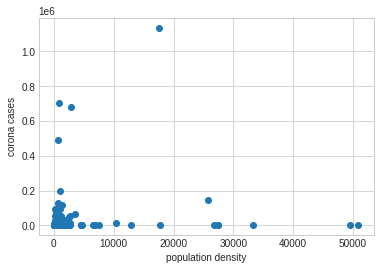

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np
x = df2['Population density']
y = df2['cases']
print(x.corr(y))
rng = np.random.RandomState(0)
colors = rng.rand(len(x))
sizes = 1000 * rng.rand(len(x))
plt.scatter(x, y)
plt.xlabel('population density')
plt.ylabel('corona cases')
plt.show()
